# Lesson 3: Basic Python for Data Analytics (Stocks Prediction)

# Introduction of Pandas


pandas is a DataFrame Framework, a library that stores data in a highly efficient spreadsheet format and functions.
Efficient in:
1. Data Structure (numpy)
2. Computing time (since DataFrame is processed by C++, it runs in a well streamlined computing environment)
3. Highly optimized and updated processes


[For more details of numpy](https://en.wikipedia.org/wiki/NumPy)

[For more details of pandas cookbook and 10 minutes basic](http://pandas.pydata.org/pandas-docs/stable/10min.html)

## Objective

* To use pandas to load the latest updated data from Yahoo Finance
* To explore and understand the dataset 
    * Viewing the data
    * Correlation Analysis
    * Graphing using matplotlib
* To predict the return of the stocks in the next period - Prediction analysis
    * Simple Linear Analysis
    * Quadratic Linear Analysis (QDA)
    * K Nearest Neighbor (KNN)
* Comparing models and discuss improvements
* Challenges:
    * Assuming economic qualitative factors such as news (news sourcing and sentimental analysis)
    * Assuming economic quantitative factors such as HPI of a certain country, economic inequality among origin of company
    * Cleaning out the data
    * Importing data files
* Next lesson:
    * Lesson 4 Basic Python for Data Analytics (Predicting Employee Retention)

## Loading YahooFinance Dataset

In this demonstration, we will use pandas web data reader. This is an extension of pandas library to communicate with most updated financial data. 

This will include sources as:
* Yahoo! Finance
* Google Finance
* Enigma
* FRED
* Fama/French
* World Bank
* OECD
* Eurostat
* EDGAR Index
* TSP Fund Data
* Oanda currency historical rate
* Nasdaq Trader Symbol Definitions

[For more details of pandas webreader](https://pandas-datareader.readthedocs.io/en/latest/)  

In [2]:
import sys
print (sys.prefix)

/usr


In [3]:
!pip install pandas
!pip show pandas_datareader
!pip install --upgrade pandas_datareader

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Name: pandas-datareader
Version: 0.9.0
Summary: Data readers extracted from the pandas codebase,should be compatible with recent pandas versions
Home-page: https://github.com/pydata/pandas-datareader
Author: The PyData Development Team
Author-email: pydata@googlegroups.com
License: BSD License
Location: /usr/local/lib/python3.7/dist-packages
Requires: lxml, pandas, requests
Required-by: 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 109 kB 4.1 MB/s 
  Attempting uninstall: pandas-datareader
    Found existing installation: pandas-datareader 0.9.0
    Uninstalling pandas-datareader-0.9.0:
      Successfully uninstalled pandas-datareader-0.9.0


In [4]:
pip install pandas-datareader

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [5]:
!pip install yfinance
import yfinance as yf


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 62 kB 1.5 MB/s 
  Attempting uninstall: requests
    Found existing installation: requests 2.23.0
    Uninstalling requests-2.23.0:
      Successfully uninstalled requests-2.23.0


In [6]:
ipsa = ['HLAG.DE','MAERSK-B.CO','VALE','INVERCAP.SN','SQM-B.SN','CHILE.SN','BSANTANDER.SN','COPEC.SN','CENCOSUD.SN','FALABELLA.SN','ENELAM.SN','CMPC.SN','BCI.SN','VAPORES.SN','CAP.SN','CCU.SN','ENELCHILE.SN','ANDINA-B.SN','CONCHATORO.SN','PARAUCO.SN','ITAUCORP.SN','AGUAS-A.SN','COLBUN.SN','CENCOSHOPP.SN','ENTEL.SN','MALLPLAZA.SN','IAM.SN','SMU.SN','ECL.SN','SONDA.SN','RIPLEY.SN','SECURITY.SN', 'QUINENCO.SN', 'BESALCO.SN','MASISA.SN', 'LTM.SN','ENJOY.SN']
ipsa2 = ['NVDA','AMD','TSLA', 'LMT','AMZN', 'FB']
accion_predecir = 'QUINENCO.SN'


In [7]:
import pandas as pd
import datetime
import pandas_datareader.data as web
from pandas import Series, DataFrame

#start = datetime.datetime(2002, 1, 1)
start = datetime.datetime(2000, 1, 1)
end = datetime.datetime(2022, 11, 17)

df = web.DataReader(accion_predecir, 'yahoo', start, end)
df.tail()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2022-11-11,2718.000000,2650.100098,2700.0,2701.399902,7891.0,2701.399902
2022-11-14,2721.100098,2646.100098,2665.0,2668.800049,10898.0,2668.800049
2022-11-15,2695.399902,2650.000000,2680.0,2680.000000,98368.0,2680.000000
2022-11-16,2678.699951,2660.000000,2675.0,2673.699951,12080.0,2673.699951
2022-11-17,2700.000000,2650.000000,2700.0,2670.100098,236915.0,2670.100098


In [8]:
#CODIGO EN DESARROLLO

def acciones(accion_predecirs):
  df = accion_predecirs[0:-3]
  globals()[str(accion_predecirs.replace(".",""))] = web.DataReader(accion_predecirs, 'yahoo', start, end)
  return globals()[str(accion_predecirs).replace(".","")]
 
for i in ipsa:
  print("******************************************************************************")
  print(i)
  d = acciones(i)
  print(d)
  d.tail()
  print(d)

  print(type(d))
  print("dataframe name: "+str(d))
 

******************************************************************************
HLAG.DE
                  High         Low        Open       Close     Volume  \
Date                                                                    
2015-11-06   20.181255   19.785543   19.835009   19.993292  1775788.0   
2015-11-09   20.131790   19.859739   20.131790   19.924044    52918.0   
2015-11-10   20.240612   19.785543   19.933935   19.825115   236784.0   
2015-11-11   20.428574   19.513493   19.884472   19.736080  1004556.0   
2015-11-12   19.958668   19.686617   19.696508   19.785543    56239.0   
...                ...         ...         ...         ...        ...   
2022-11-11  189.000000  179.100006  182.100006  185.800003    61961.0   
2022-11-14  200.399994  184.300003  190.399994  193.100006    56625.0   
2022-11-15  196.600006  182.199997  194.699997  190.899994    30326.0   
2022-11-16  190.199997  185.100006  190.000000  188.000000    26424.0   
2022-11-17  191.899994  185.199997  1

Get the dimension of dataframe

In [9]:
'''
for i in ipsa:
  print("******************************************************************************")
  print(i)
  d = acciones(i)
  d.tail()
  print(d)
  print("******************************************************************************")

'''

'\nfor i in ipsa:\n  print("******************************************************************************")\n  print(i)\n  d = acciones(i)\n  d.tail()\n  print(d)\n  print("******************************************************************************")\n\n'

## Exploring the data 

First we will need to explore the data.
This means understanding the stocks data trend thoroughly by finding key measures
* rolling mean (moving average) -- to determine trend
* return deviation -- to determine return deviation

[For more details of rolling mean](http://www.investopedia.com/articles/active-trading/052014/how-use-moving-average-buy-stocks.asp) 


In [10]:
close_px = VAPORESSN['Adj Close']
mavg = close_px.rolling(window=100).mean()
mavg.tail(10)

Date
2022-11-04    81.523276
2022-11-07    81.062638
2022-11-08    80.635500
2022-11-09    80.379500
2022-11-10    80.200000
2022-11-11    80.072000
2022-11-14    79.937500
2022-11-15    79.840500
2022-11-16    79.740700
2022-11-17    79.609700
Name: Adj Close, dtype: float64

In [11]:

for i in ipsa:

  globals()["close_px_" + str(i).replace(".","")] = globals()[str(i).replace(".","")]['Adj Close']
  globals()["mavg" + str(i).replace(".","")] = close_px.rolling(window=100).mean()
  globals()["mavg" + str(i).replace(".","")].tail(10)

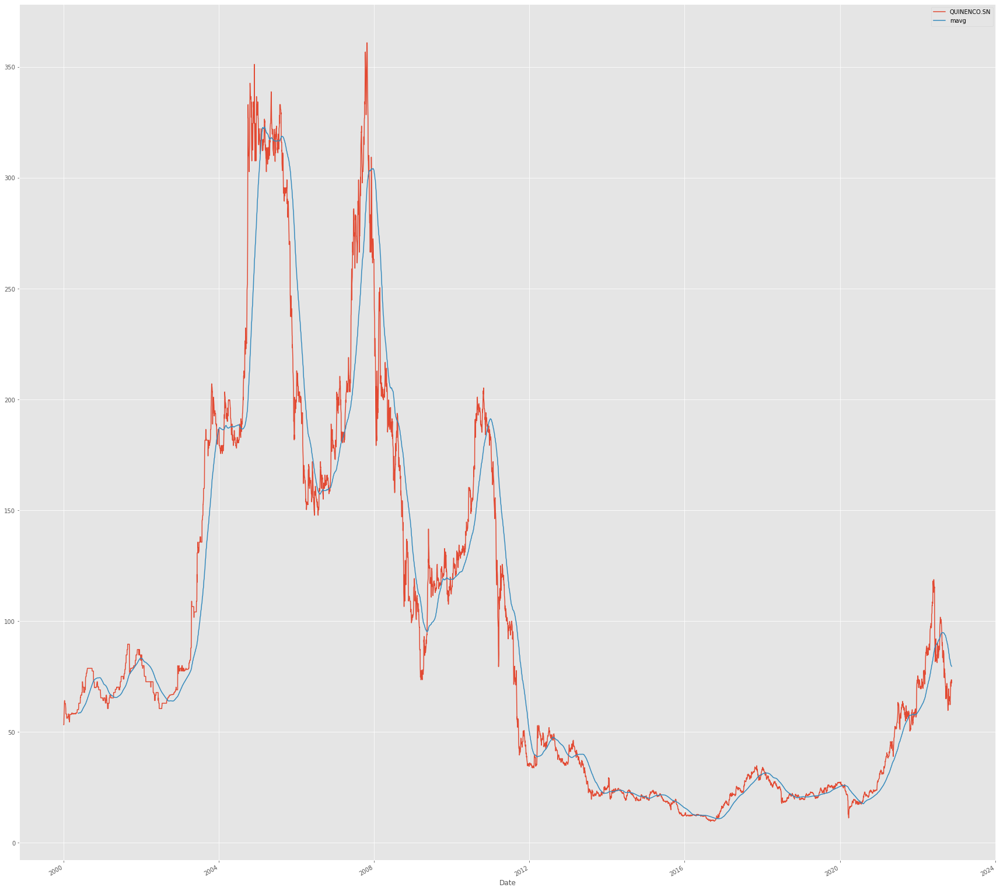

In [12]:
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import style

# Adjusting the size of matplotlib
import matplotlib as mpl
mpl.rc('figure', figsize=(30, 30))
mpl.__version__

# Adjusting the style of matplotlib
style.use('ggplot')

close_px.plot(label=accion_predecir)
mavg.plot(label='mavg')
plt.legend()

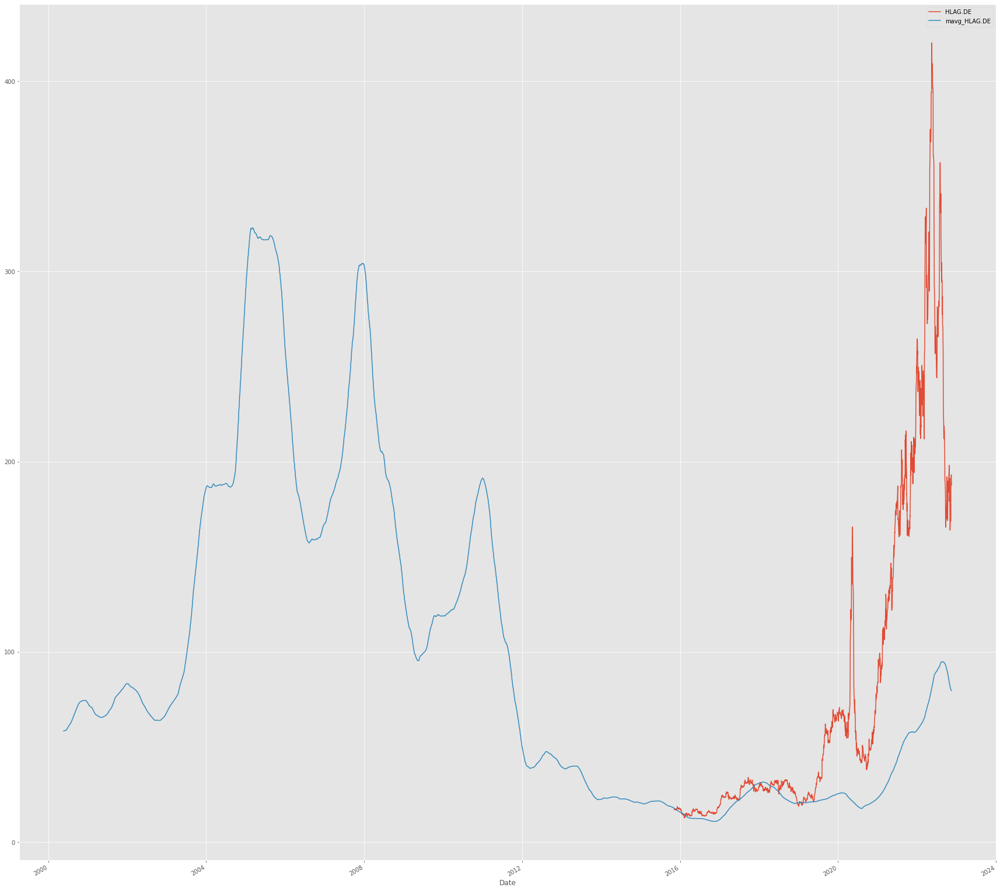

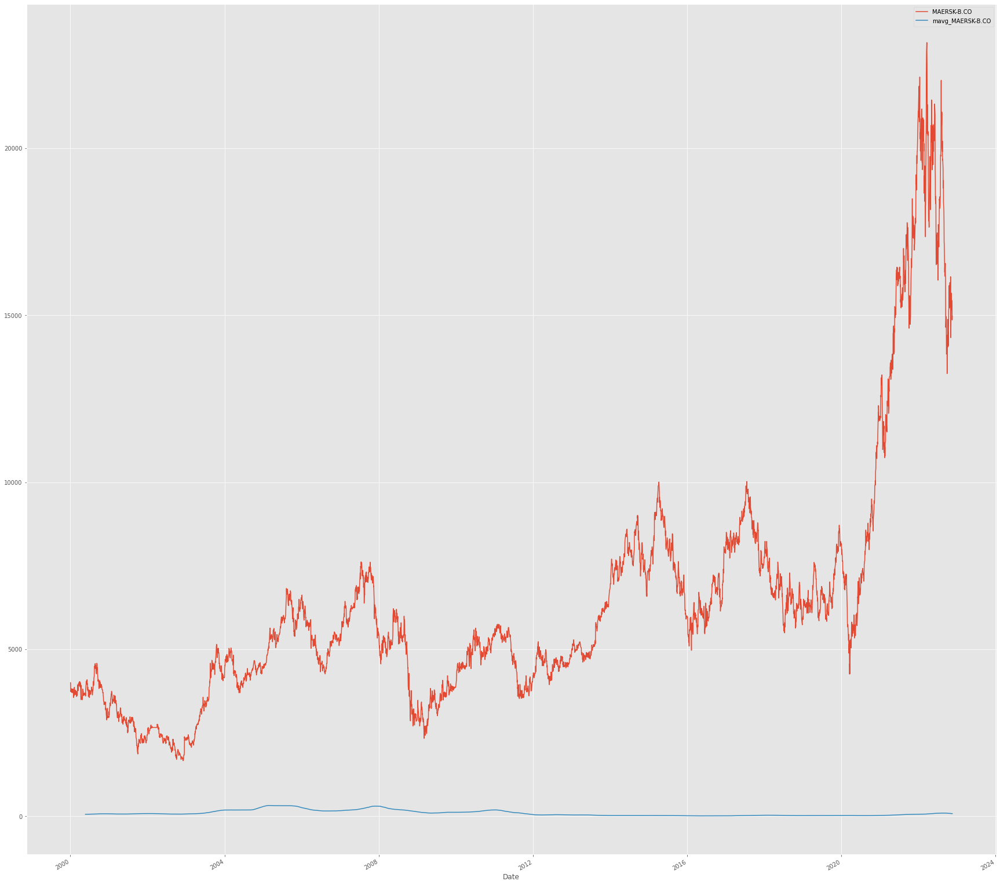

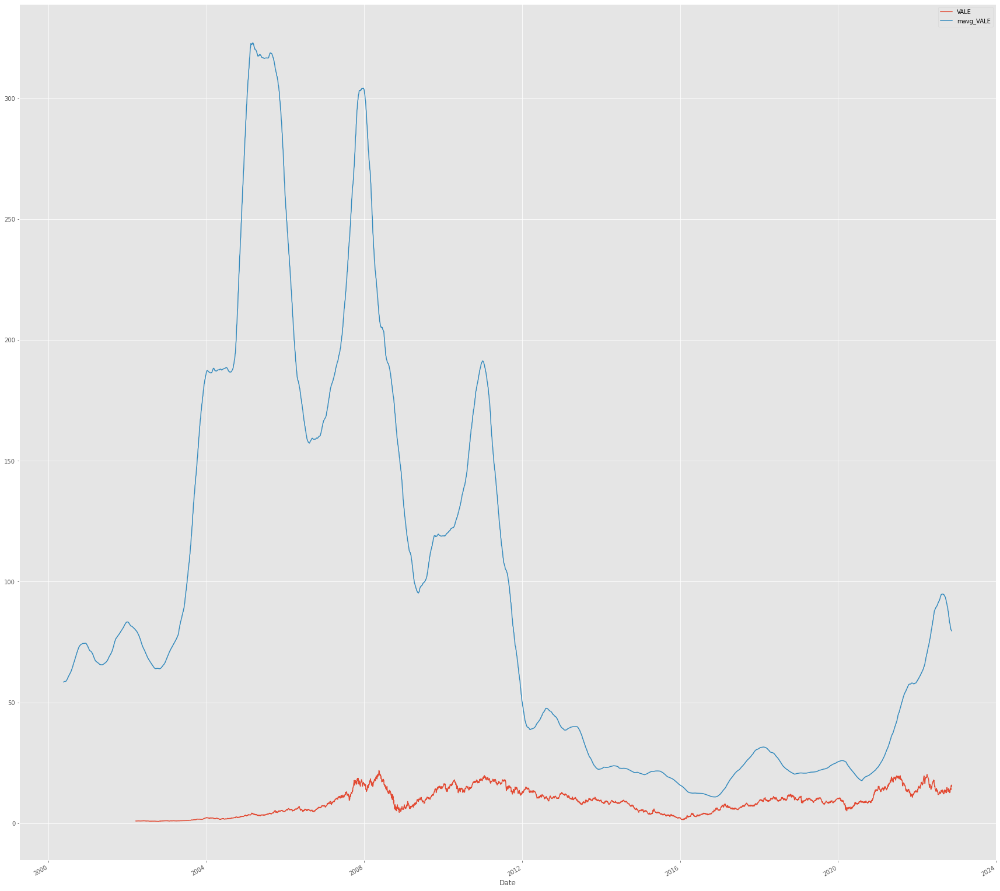

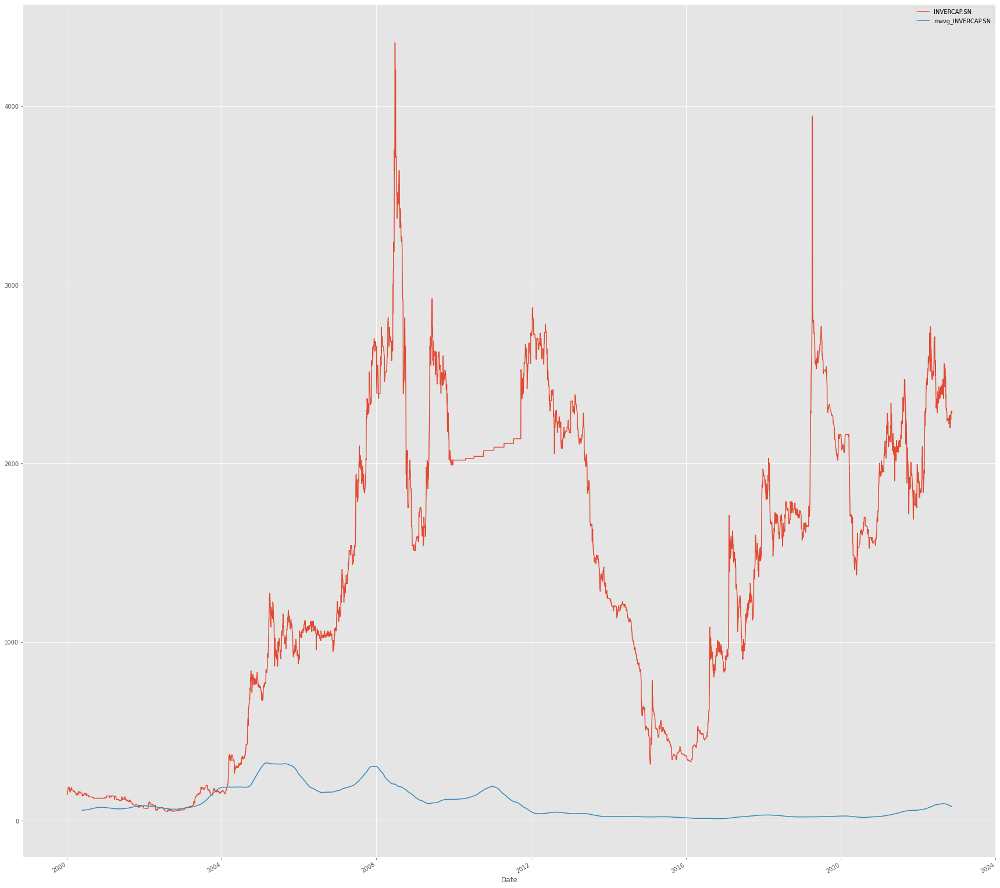

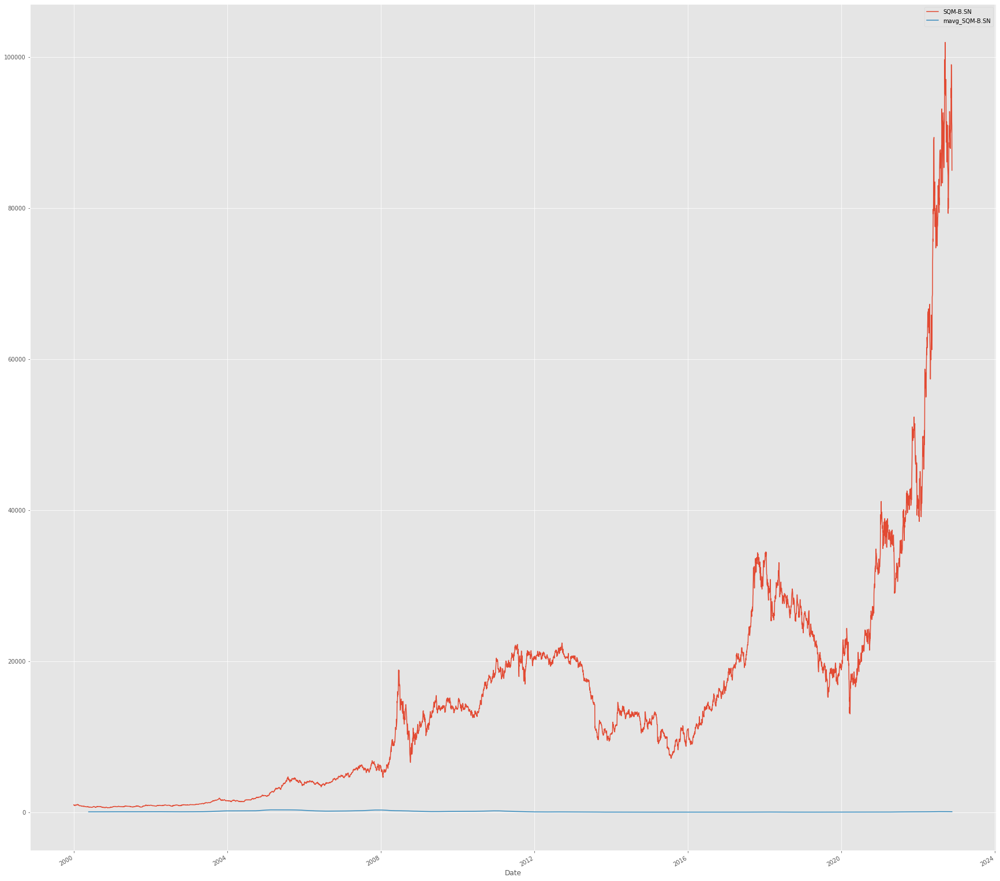

...

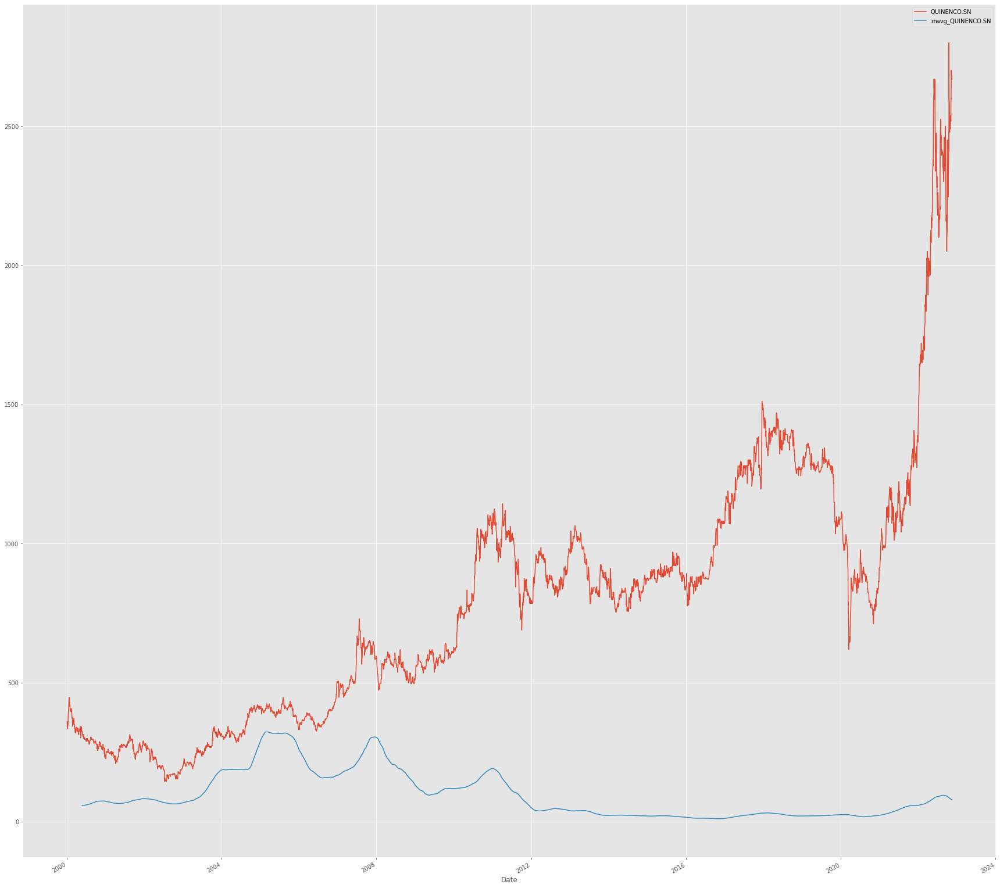

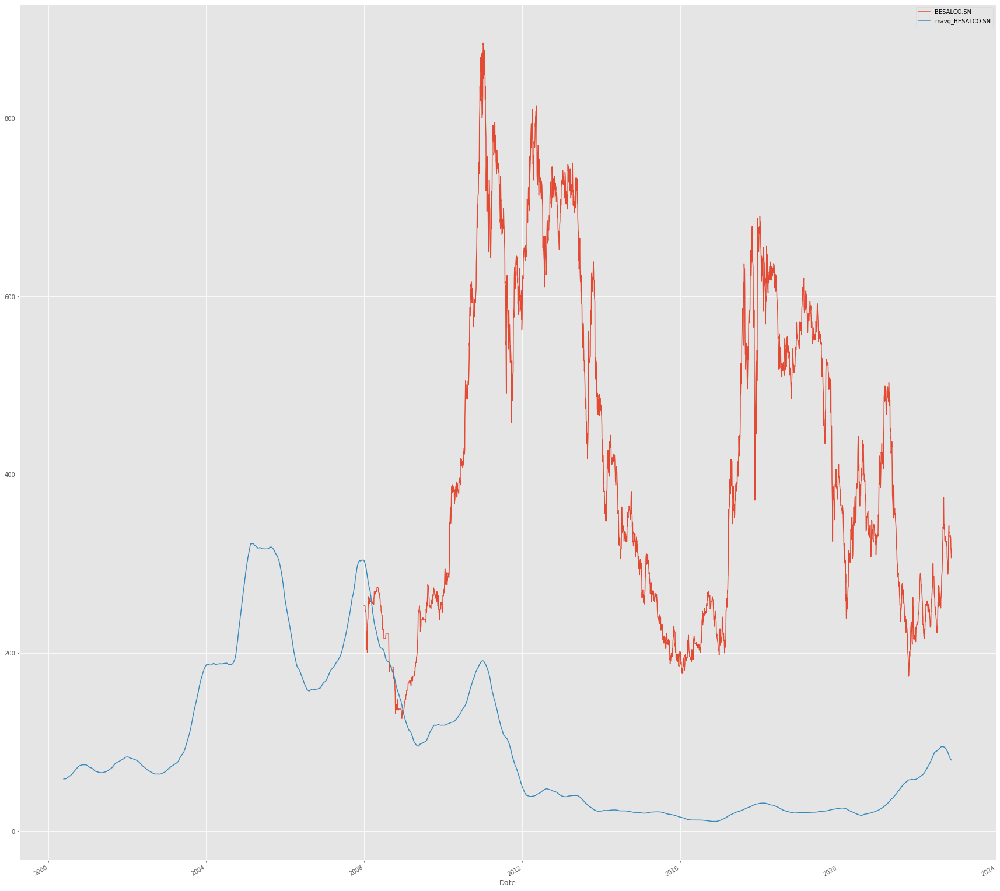

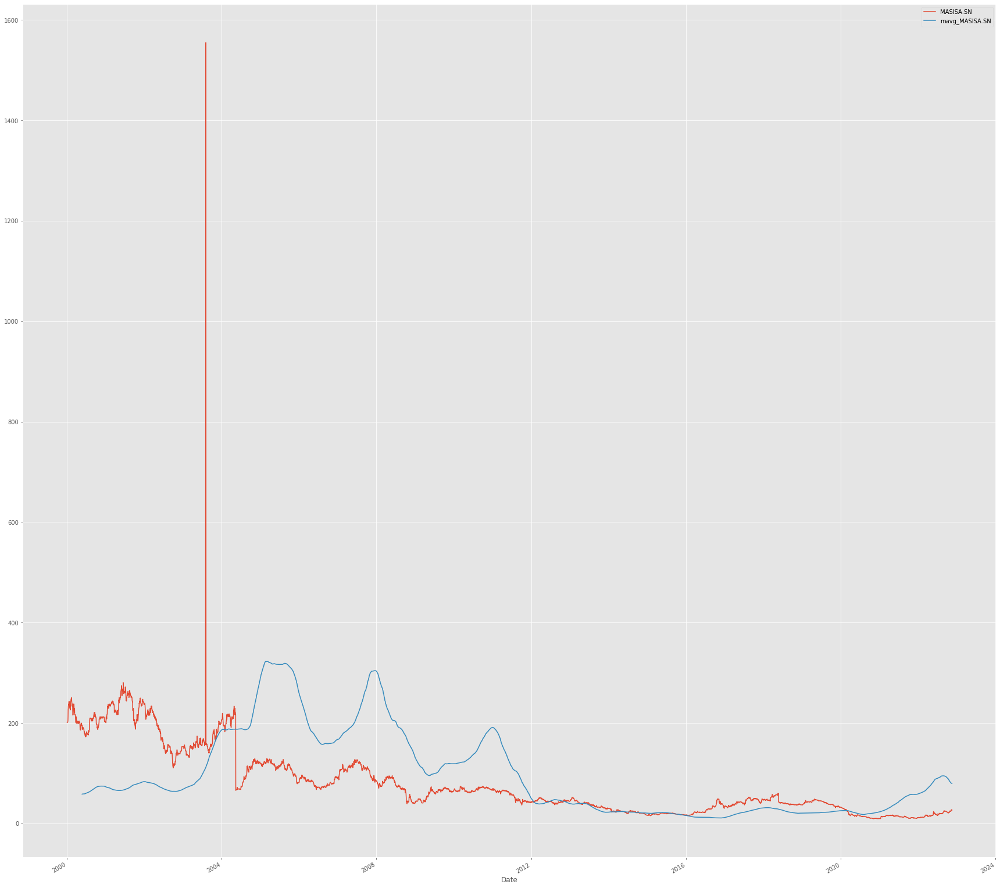

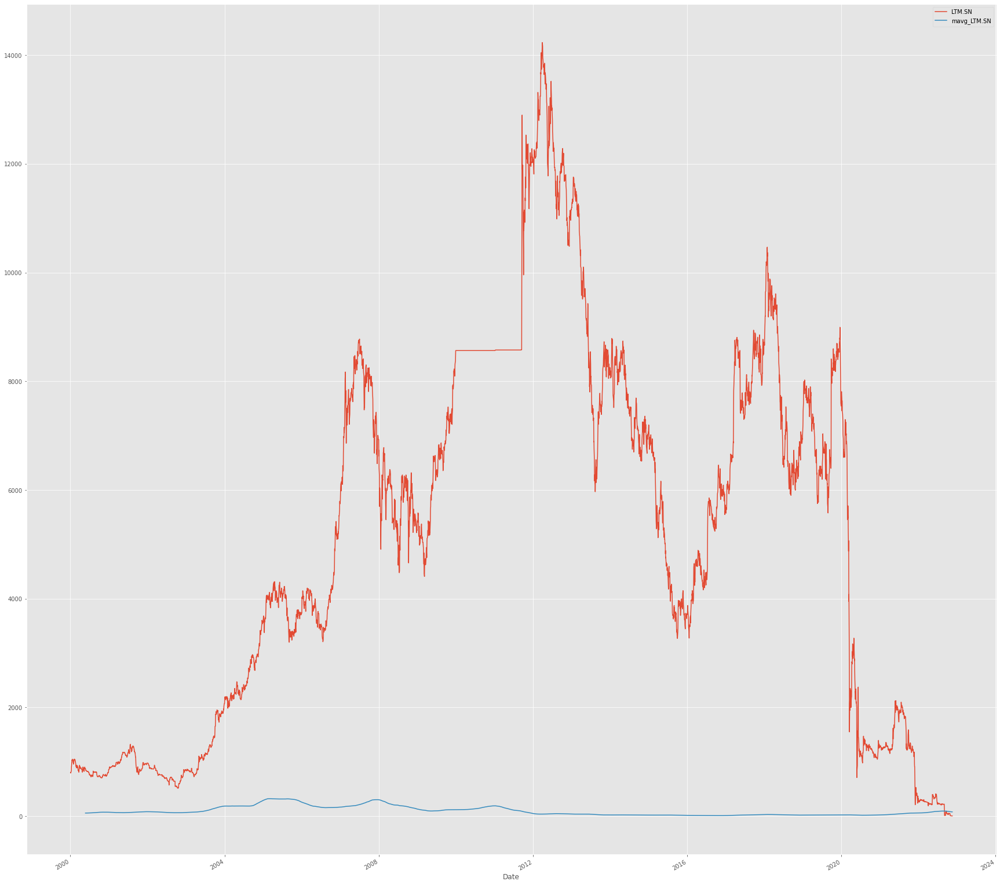

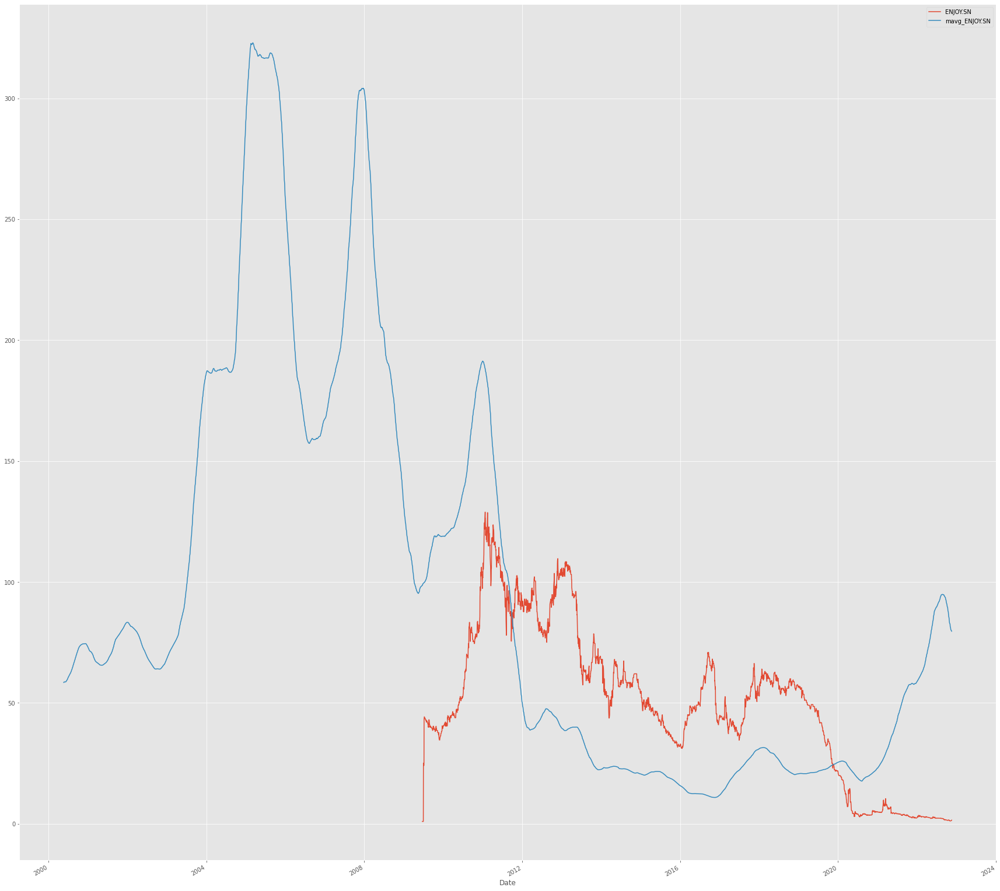

In [13]:
for i in ipsa:
  %matplotlib inline
  import matplotlib.pyplot as plt
  from matplotlib import style

  # Adjusting the size of matplotlib
  import matplotlib as mpl
  mpl.rc('figure', figsize=(30, 30))
  mpl.__version__

  # Adjusting the style of matplotlib
  style.use('ggplot')

  globals()["close_px_" + str(i).replace(".","")].plot(label=i)
  globals()["mavg" + str(i).replace(".","")].plot(label='mavg_'+i)
  plt.legend()
  plt.show()


Returns defined as: 
$$ $$
$$r_t = \frac{p_t - p_{t-1}}{p_{t-1}} = \frac{p_t}{p_{t-1}} - 1$$

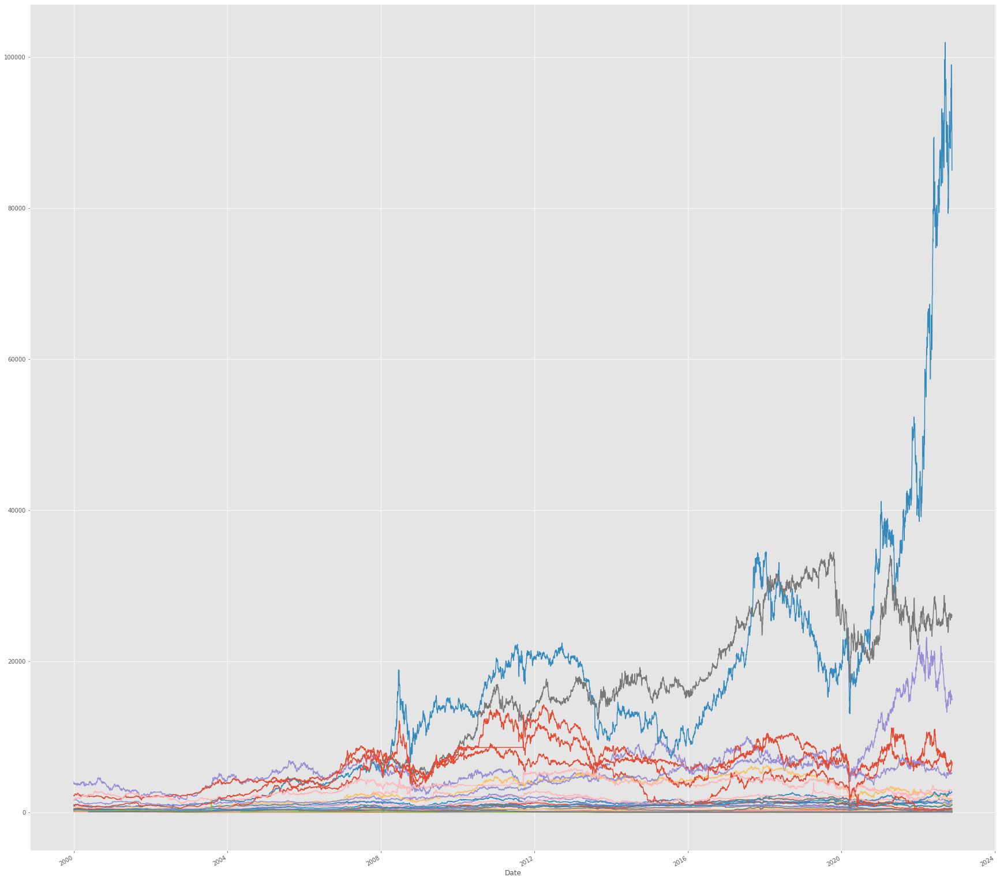

In [14]:
for i in ipsa:
  globals()["close_px_" + str(i).replace(".","")].plot(label=i)
  globals()["mavg" + str(i).replace(".","")].plot(label='mavg_'+i)

  globals()["rets"+str(i).replace(".","")] = globals()["close_px_" + str(i).replace(".","")] / globals()["close_px_" + str(i).replace(".","")] - 1
  globals()["rets"+str(i).replace(".","")].head()

  globals()["close_px_" + str(i).replace(".","")].pct_change().head()

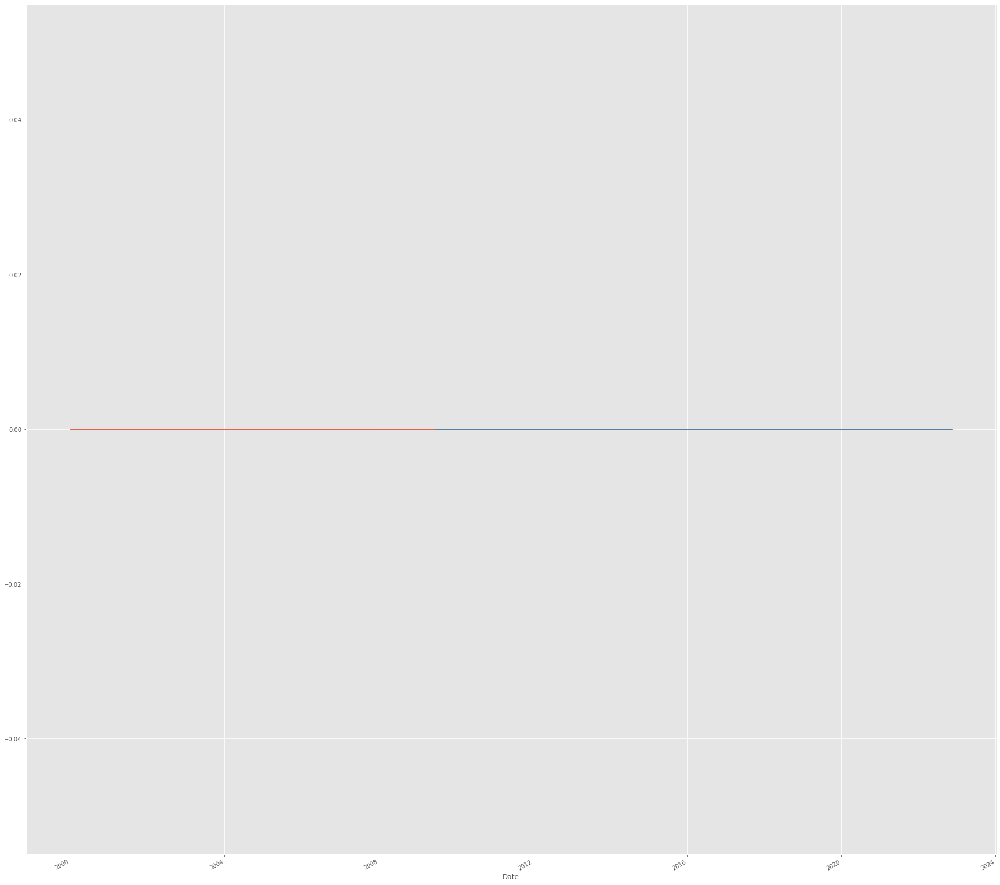

In [15]:
for i in ipsa:
  globals()["rets"+str(i).replace(".","")].plot(label='return')

## Doing the competitor analysis/Correlation

1. How does one company perform in relative with its competitor
2. What are the correlations among these companies

In [16]:

dfcomp = web.DataReader(ipsa,'yahoo',
                               start=start, 
                               end=end)['Adj Close']
dfcomp.tail()

Symbols,HLAG.DE,MAERSK-B.CO,VALE,INVERCAP.SN,SQM-B.SN,CHILE.SN,BSANTANDER.SN,COPEC.SN,CENCOSUD.SN,FALABELLA.SN,...,SMU.SN,ECL.SN,SONDA.SN,RIPLEY.SN,SECURITY.SN,QUINENCO.SN,BESALCO.SN,MASISA.SN,LTM.SN,ENJOY.SN
Date,,,,,,,,,,,,,,,,,,,,,
2022-11-11,185.800003,15450.0,15.45,2288.300049,99000.0,84.500000,33.970001,6585.000000,1300.0,1738.0,...,100.949997,500.000000,328.890015,147.410004,155.000000,2701.399902,317.619995,27.370001,6.000,1.246
2022-11-14,193.100006,15425.0,15.71,2293.100098,95150.0,84.500000,33.849998,6560.000000,1285.0,1685.0,...,100.650002,512.809998,324.339996,144.789993,156.119995,2668.800049,310.890015,27.340000,5.865,1.307
2022-11-15,190.899994,15315.0,15.81,2293.100098,91414.0,83.900002,33.360001,6385.000000,1291.0,1670.0,...,103.669998,500.109985,327.600006,141.839996,154.100006,2680.000000,306.559998,27.340000,5.719,1.369
2022-11-16,188.000000,14855.0,15.22,2293.199951,90900.0,84.389999,33.000000,6360.000000,1300.0,1646.0,...,106.500000,503.450012,325.000000,143.320007,154.789993,2673.699951,313.290009,26.740000,5.881,1.487
2022-11-17,187.699997,14970.0,15.33,2278.300049,85000.0,84.959999,33.000000,6389.899902,1300.0,1605.0,...,108.419998,504.410004,324.690002,146.000000,155.839996,2670.100098,316.559998,26.559999,5.879,1.518


Get the dimension of dataframes

In [17]:
dfcomp.shape

(5933, 37)

In [18]:
retscomp = dfcomp.pct_change()

corr = retscomp.corr()
corr

Symbols,HLAG.DE,MAERSK-B.CO,VALE,INVERCAP.SN,SQM-B.SN,CHILE.SN,BSANTANDER.SN,COPEC.SN,CENCOSUD.SN,FALABELLA.SN,...,SMU.SN,ECL.SN,SONDA.SN,RIPLEY.SN,SECURITY.SN,QUINENCO.SN,BESALCO.SN,MASISA.SN,LTM.SN,ENJOY.SN
Symbols,,,,,,,,,,,,,,,,,,,,,
HLAG.DE,1.000000,0.388565,0.117555,0.036344,0.113413,0.059315,0.080493,0.062754,0.006300,0.083929,...,0.058972,0.043347,0.081244,0.032992,0.082582,0.097641,0.044301,0.052438,0.013835,0.066028
MAERSK-B.CO,0.388565,1.000000,0.309075,0.104848,0.197217,0.168726,0.203435,0.178773,0.157733,0.170470,...,0.137833,0.110512,0.169481,0.183358,0.111406,0.110996,0.144115,0.024744,0.066211,-0.021574
VALE,0.117555,0.309075,1.000000,0.149113,0.358165,0.235067,0.292560,0.272133,0.233986,0.253457,...,0.126546,0.146598,0.210979,0.232461,0.114227,0.129636,0.139572,0.018386,0.088740,-0.009620
INVERCAP.SN,0.036344,0.104848,0.149113,1.000000,0.144574,0.132044,0.126027,0.137055,0.115275,0.134523,...,0.136415,0.101024,0.115745,0.149771,0.115176,0.095914,0.127495,0.020051,0.025509,0.004759
SQM-B.SN,0.113413,0.197217,0.358165,0.144574,1.000000,0.334365,0.358231,0.345500,0.301918,0.326235,...,0.214331,0.163510,0.286747,0.247934,0.172601,0.179792,0.208045,0.037020,0.130325,0.029882
CHILE.SN,0.059315,0.168726,0.235067,0.132044,0.334365,1.000000,0.587172,0.487133,0.458737,0.477362,...,0.421329,0.391420,0.384491,0.377228,0.301011,0.251233,0.292026,0.223949,0.087840,0.007722
BSANTANDER.SN,0.080493,0.203435,0.292560,0.126027,0.358231,0.587172,1.000000,0.446202,0.408605,0.432337,...,0.369095,0.268354,0.366774,0.372674,0.289375,0.238839,0.285717,0.030205,0.130333,0.011715
COPEC.SN,0.062754,0.178773,0.272133,0.137055,0.345500,0.487133,0.446202,1.000000,0.414883,0.475706,...,0.336953,0.237124,0.369469,0.408748,0.245419,0.255579,0.287034,0.049295,0.100496,0.007354
CENCOSUD.SN,0.006300,0.157733,0.233986,0.115275,0.301918,0.458737,0.408605,0.414883,1.000000,0.452176,...,0.379465,0.209003,0.383709,0.434222,0.262957,0.187134,0.290127,0.044813,0.102831,0.004057


In [19]:
#plt.scatter(retscomp.CAP.SN, retscomp.VAPORES.SN)
#plt.xlabel('Returns CAP.SN')
#plt.ylabel('Returns VAPORES.SN')

You can do scatter matrix with all the competitors data and find the kde of each m
KDE will determine if your chart is more normally distributed leaning to the 
* left: Returns are more likely to be negative in the long run
* centre: Returns are more likely to be 0 in the long run
* right: Returns are more likely to be positive in the long run

In [20]:
pip install matplotlib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [21]:
#pd.plotting.scatter_matrix(retscomp, diagonal='kde', figsize=(600, 600));

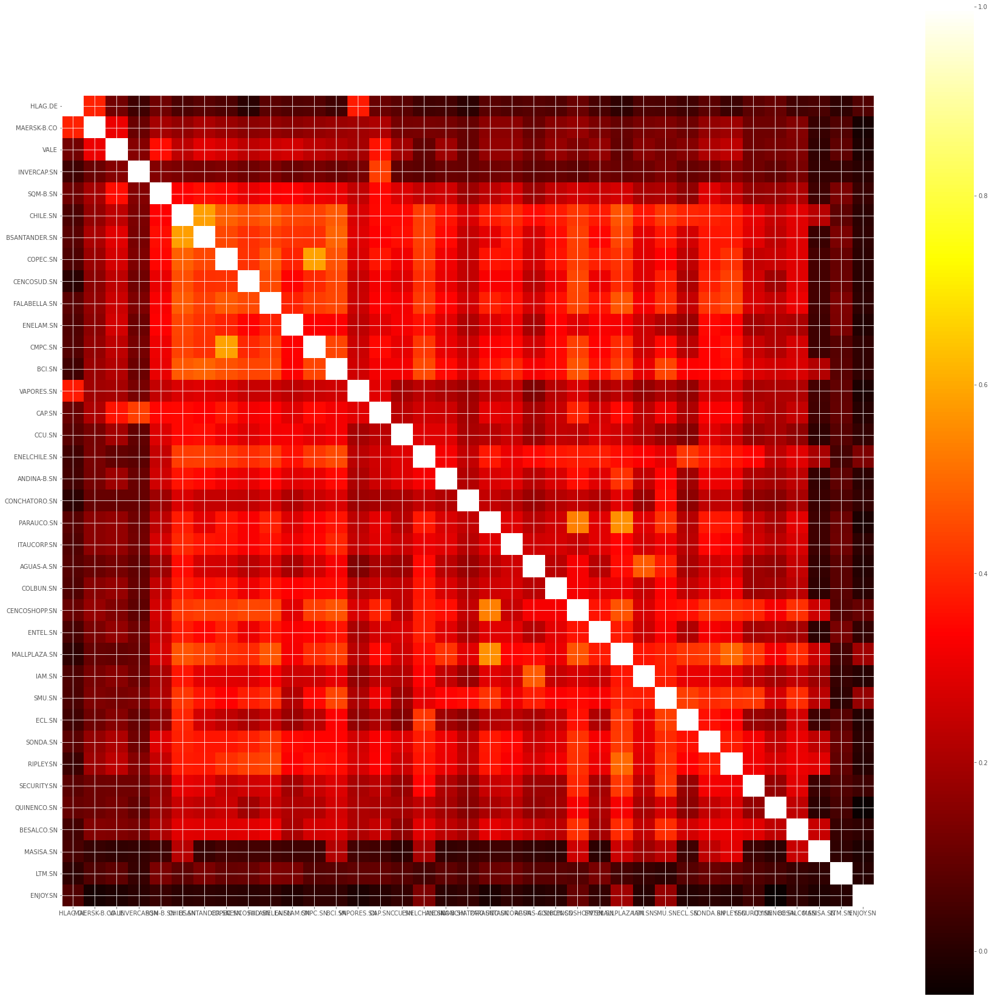

In [22]:
plt.imshow(corr, cmap='hot', interpolation='none')
plt.colorbar()
plt.xticks(range(len(corr)), corr.columns)
plt.yticks(range(len(corr)), corr.columns);

[texto del vínculo](https://)## Stocks mean and Risk calculation
Which stocks are risky and bearing returns

Kurtosis and skewness

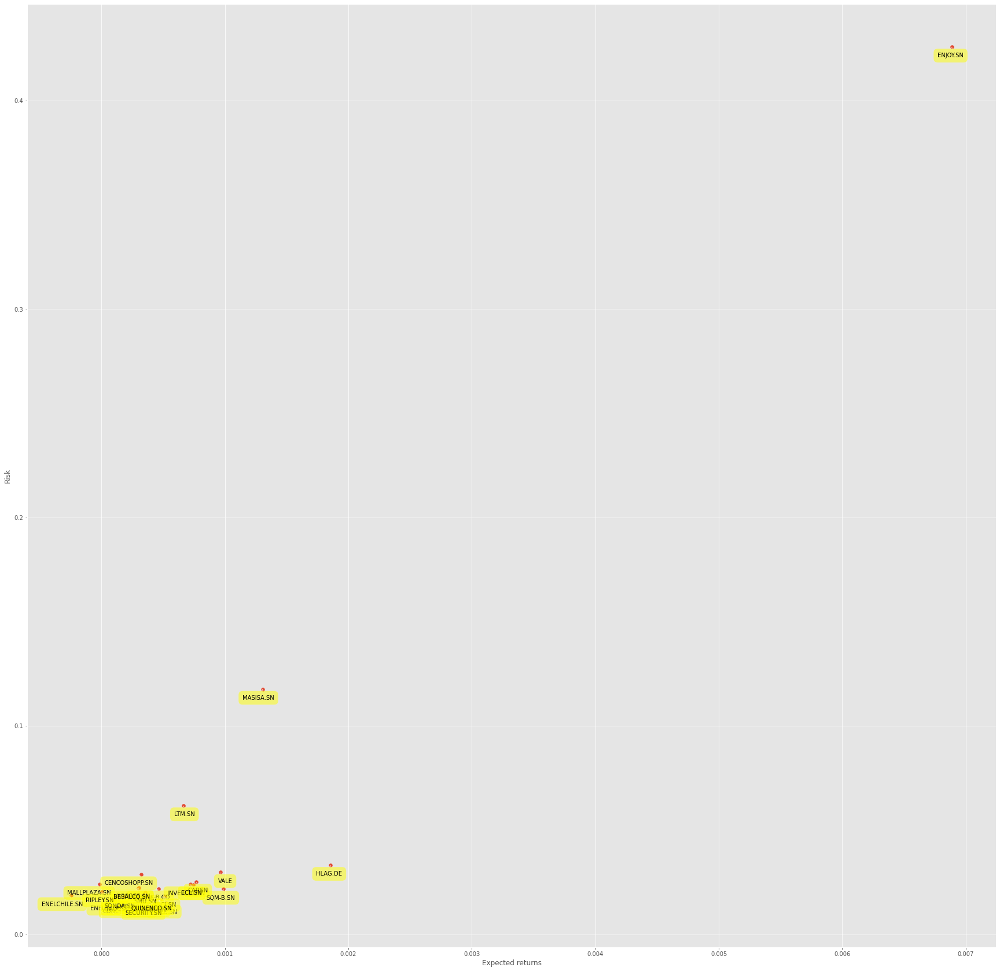

In [23]:
plt.scatter(retscomp.mean(), retscomp.std())
plt.xlabel('Expected returns')
plt.ylabel('Risk')
for label, x, y in zip(retscomp.columns, retscomp.mean(), retscomp.std()):
    plt.annotate(
        label, 
        xy = (x, y), xytext = (20, -20),
        textcoords = 'offset points', ha = 'right', va = 'bottom',
        bbox = dict(boxstyle = 'round,pad=0.7', fc = 'yellow', alpha = 0.5),
        arrowprops = dict(arrowstyle = '->', connectionstyle = 'arc3,rad=0'))

# Predicting the stocks price

To predict the return of the stocks in the next period - Prediction analysis
* Simple Linear Analysis
* Quadratic Linear Analysis (QDA)
* K Nearest Neighbor (KNN)

But first, let us extract the necessary columns first from df:
* Adj Close
* Adj Volume
* HL Percentage
* PCT Change

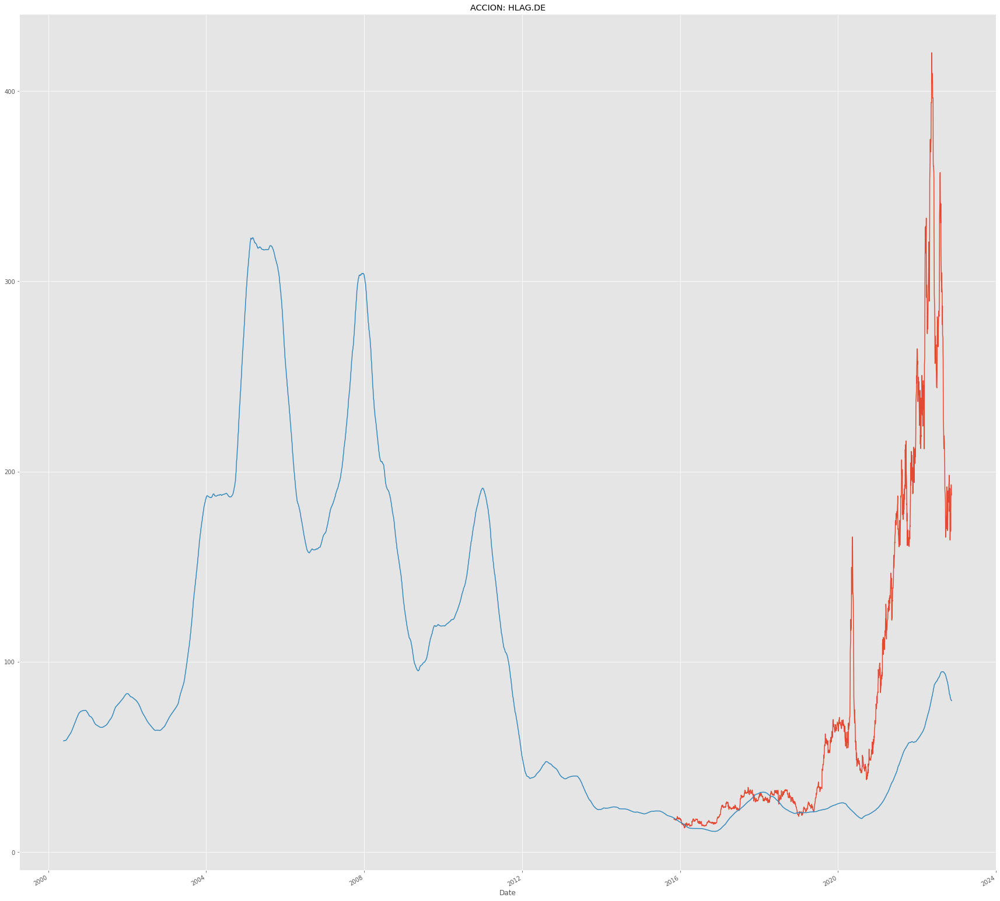

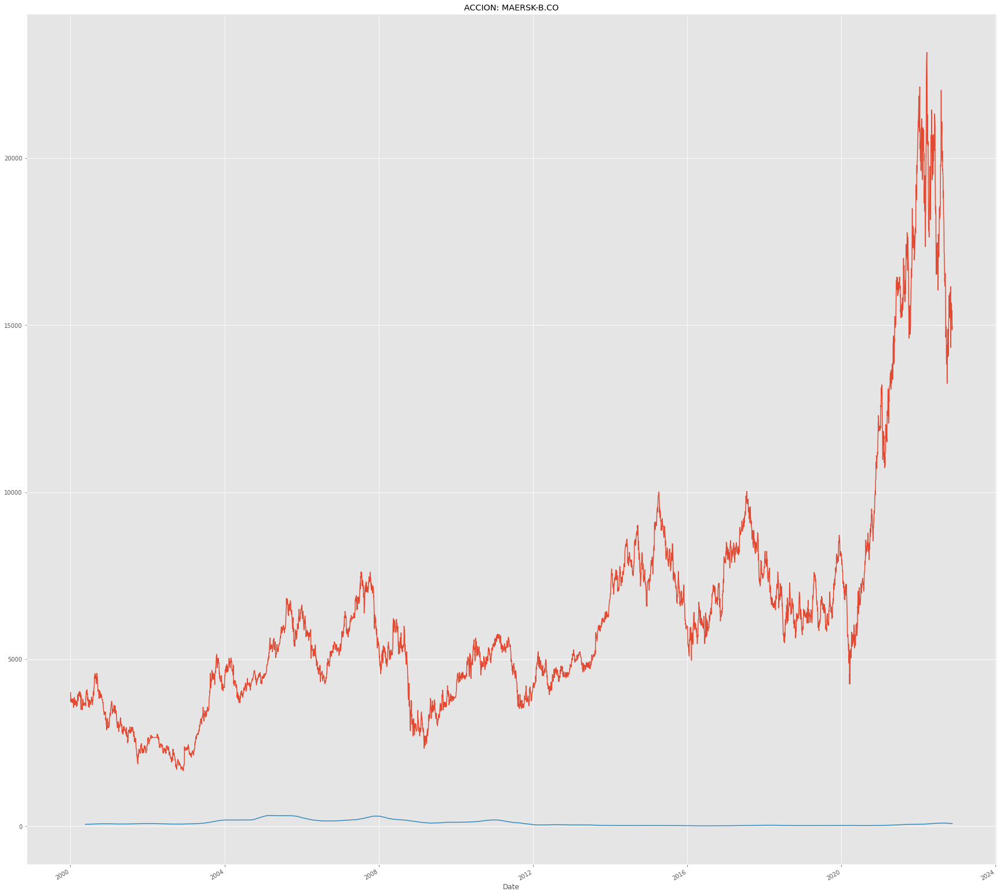

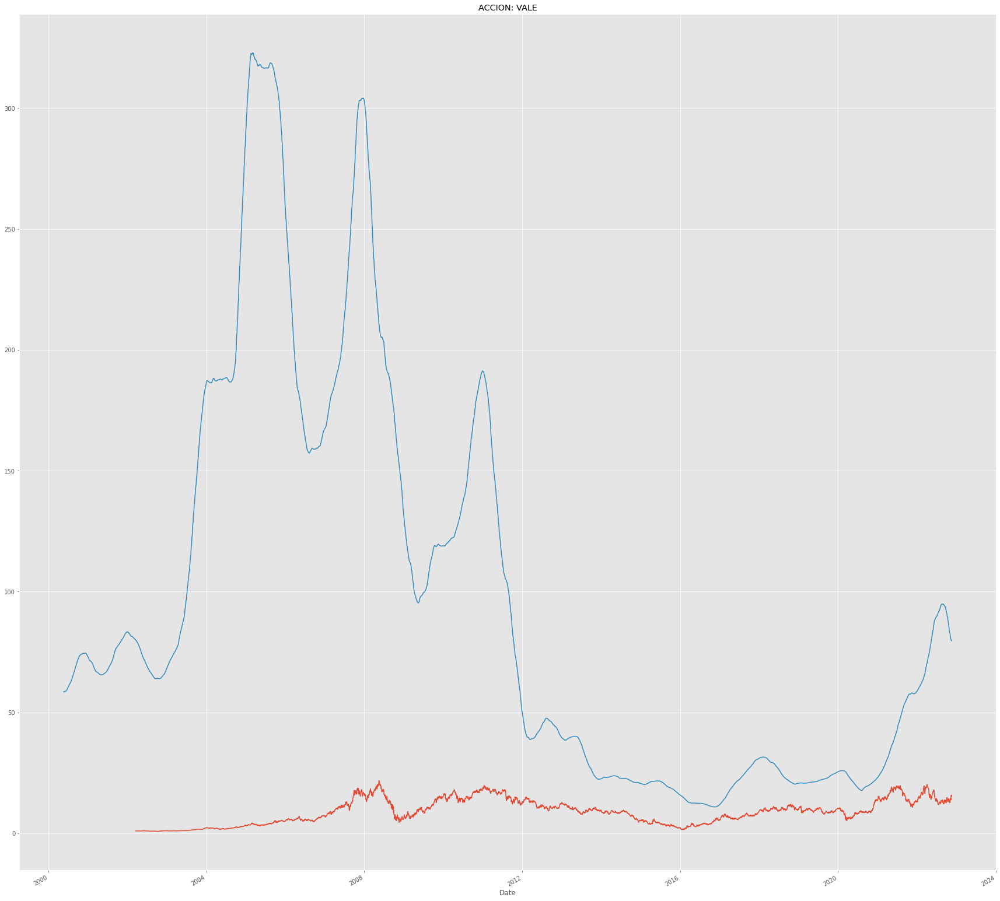

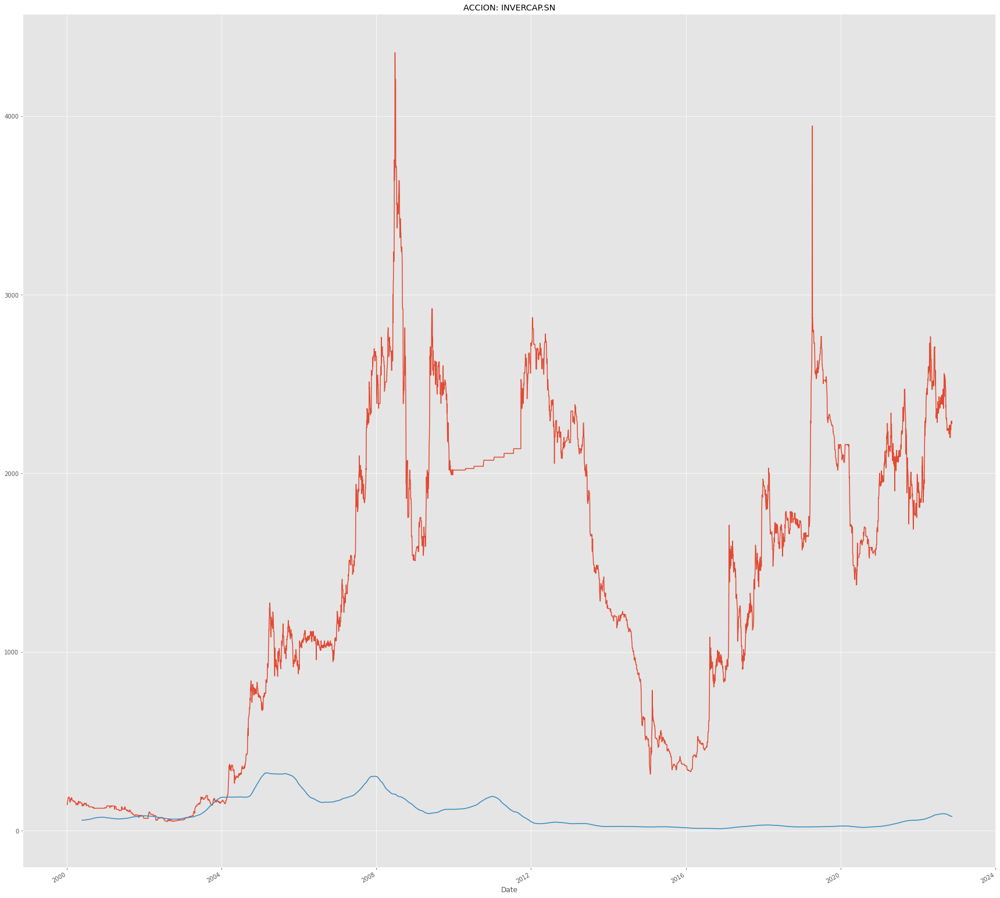

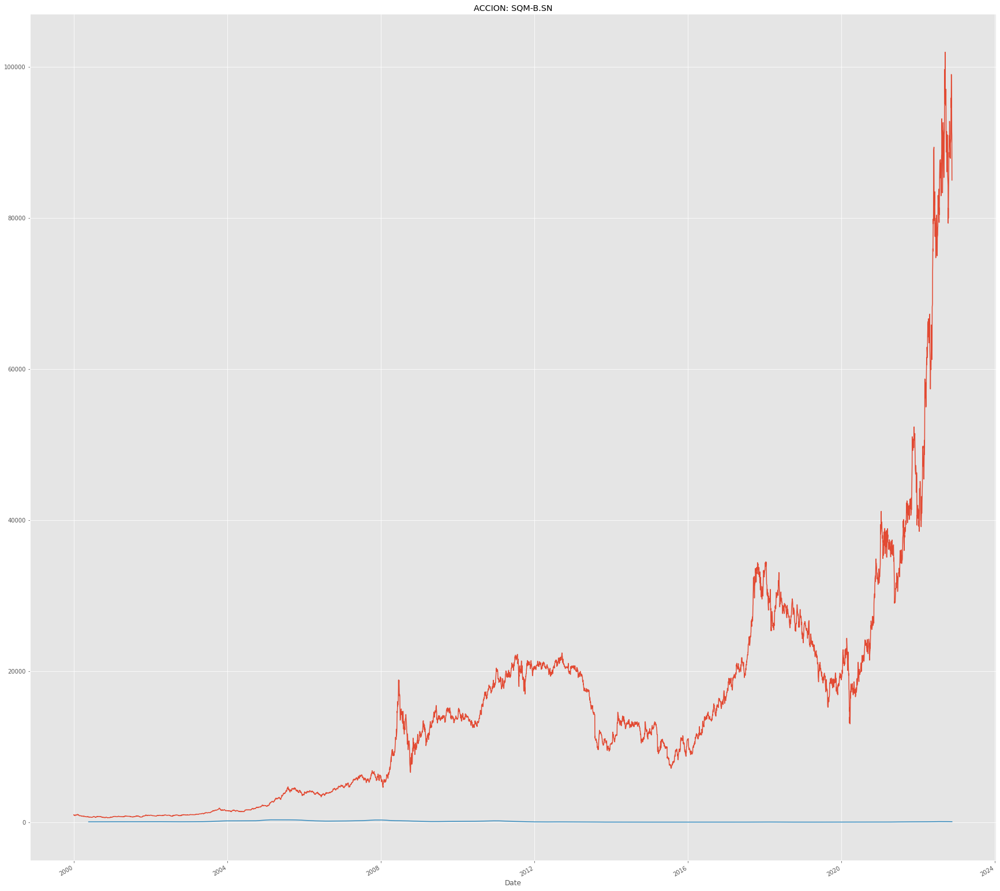

...

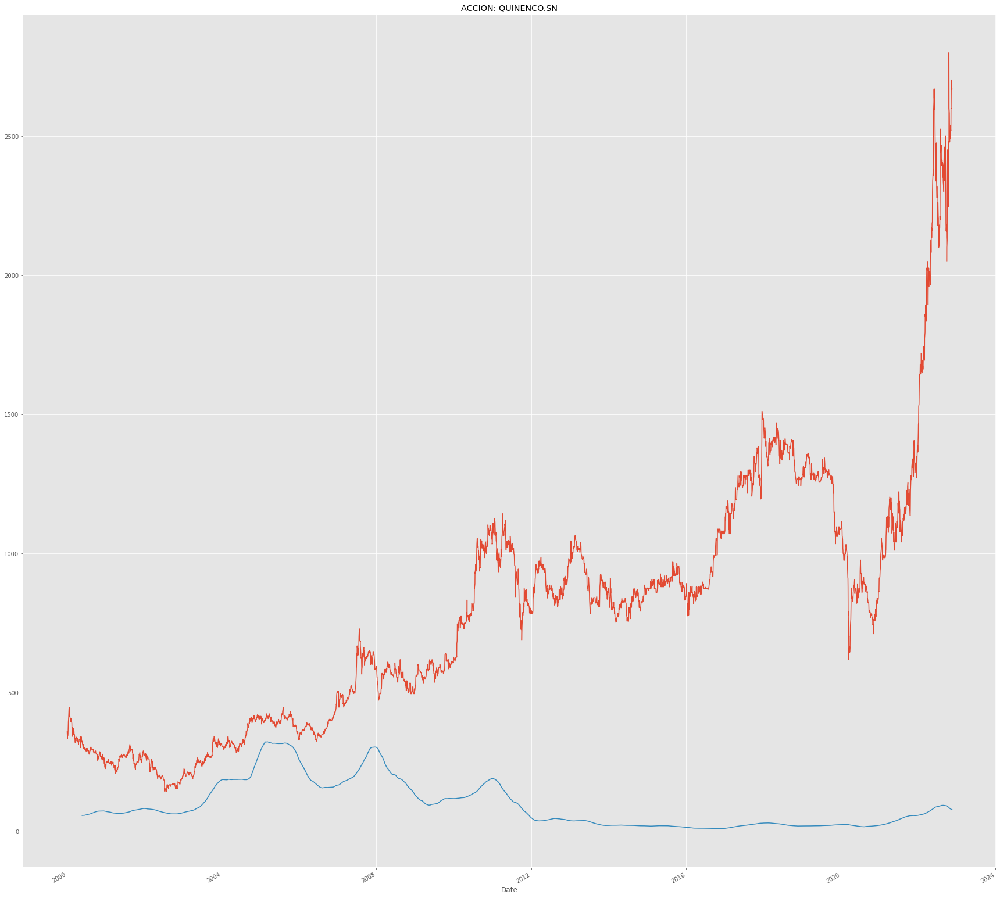

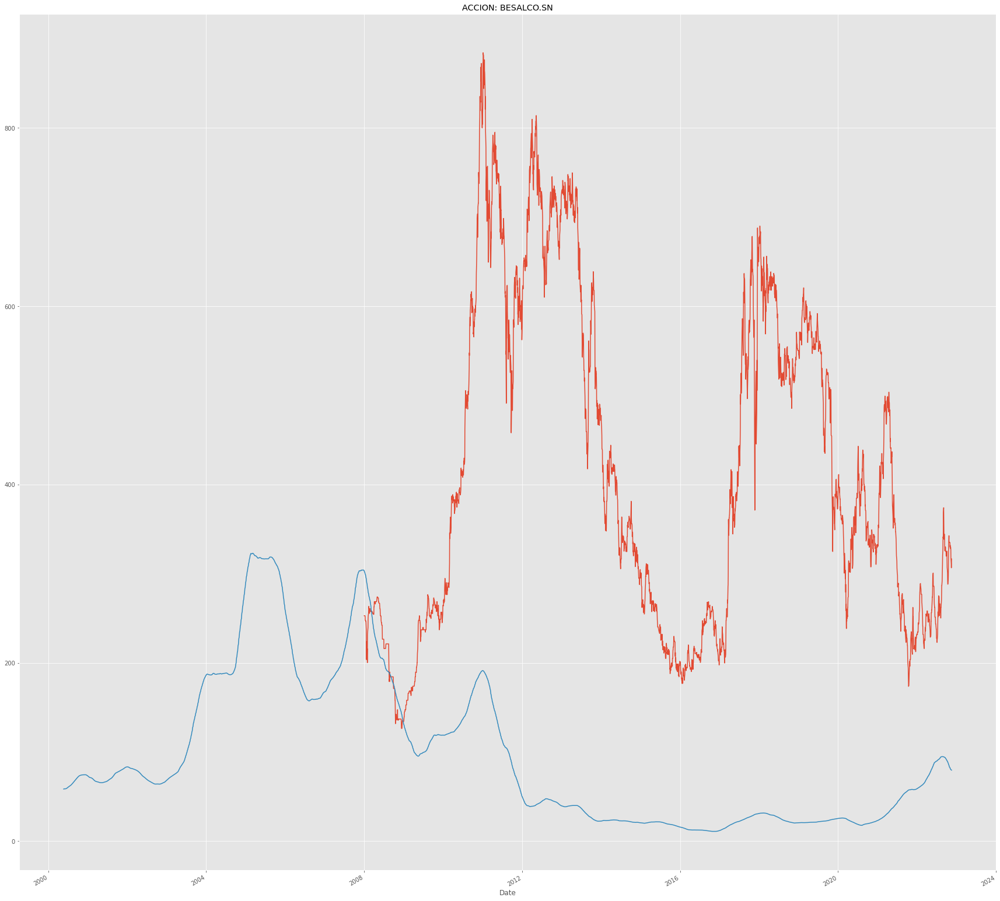

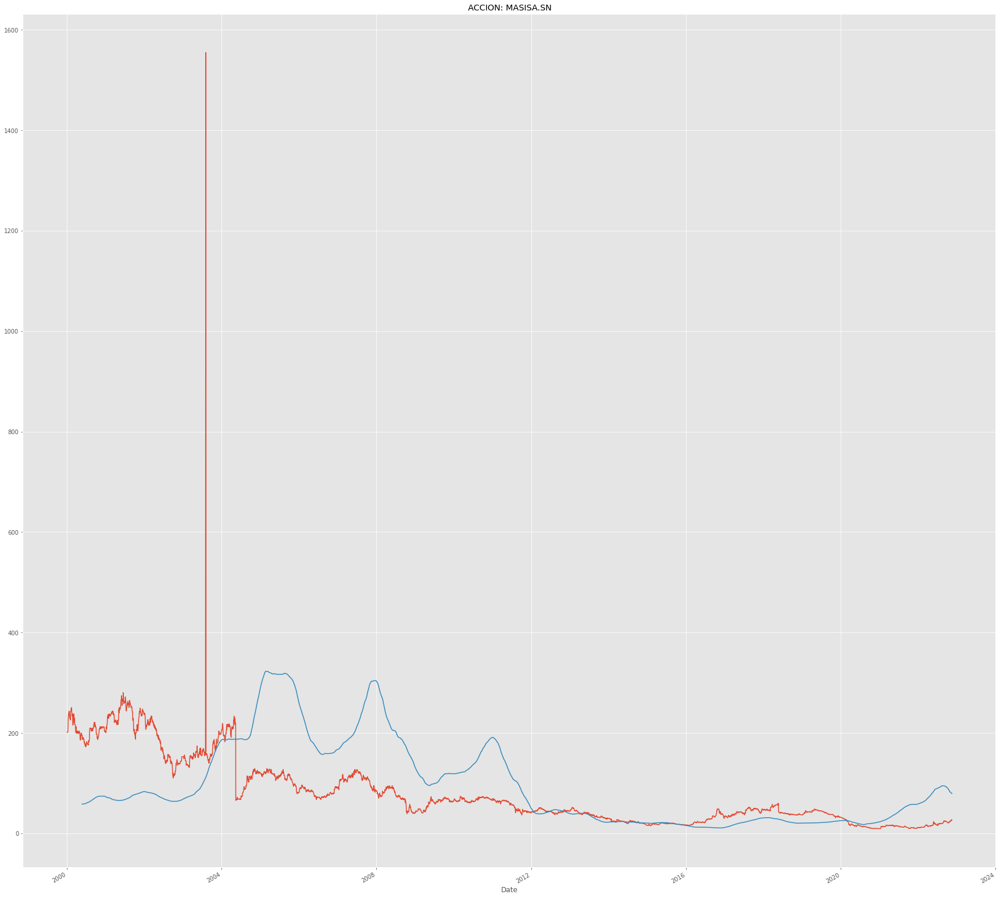

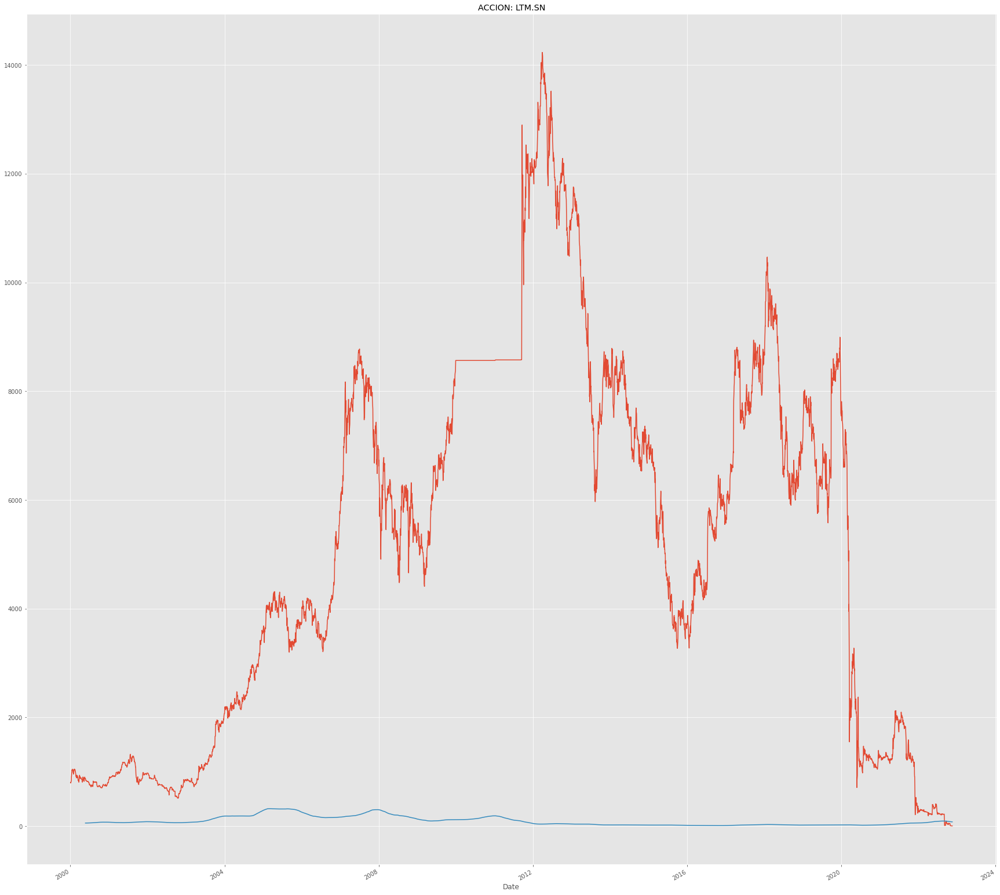

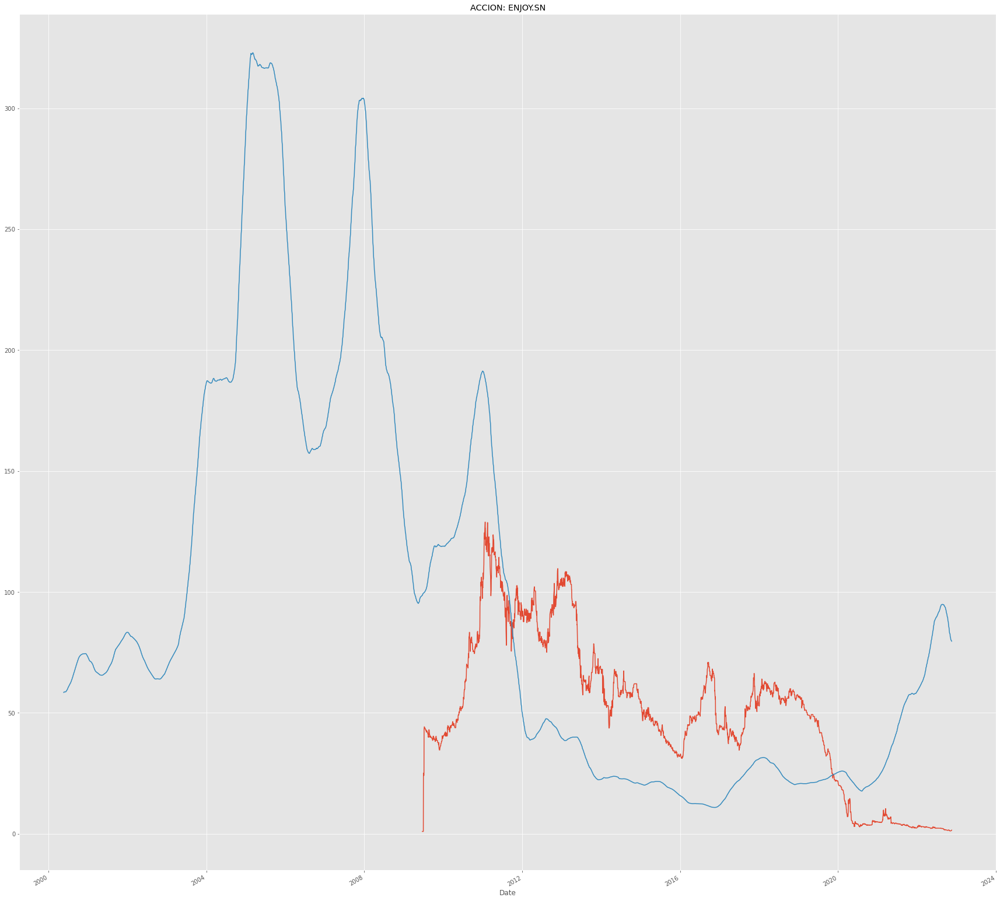

In [24]:
for i in ipsa:
  globals()["close_px_" + str(i).replace(".","")].plot(label=i)
  globals()["mavg" + str(i).replace(".","")].plot(label='mavg_'+i)

  globals()[str(i).replace(".","")].head()
  plt.title("ACCION: "+ str(i))
  plt.show()

In [25]:
for i in ipsa:
  globals()[str('dfreg')+str(i).replace(".","")] = globals()[str(i).replace(".","")].loc[:,['Adj Close','Volume']]
  globals()[str('dfreg')+str(i).replace(".","")]['HL_PCT'] = (df['High'] - df['Low']) / df['Close'] * 100.0
  globals()[str('dfreg')+str(i).replace(".","")]['PCT_change'] = (df['Close'] - df['Open']) / df['Open'] * 100.0
  globals()[str('dfreg')+str(i).replace(".","")].head()

In [26]:
import math
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn import preprocessing

for i in ipsa:

  # Drop missing value
  globals()[str('dfreg')+str(i).replace(".","")].fillna(value=-99999, inplace=True)

  globals()[str('dfreg')+str(i).replace(".","")].shape
  # We want to separate 1 percent of the data to forecast
  globals()[str('forecast_out')+str(i).replace(".","")] = int(math.ceil(0.01 * len(globals()[str('dfreg')+str(i).replace(".","")])))

  # Separating the label here, we want to predict the AdjClose
  globals()[str('forecast_col')+str(i).replace(".","")] = 'Adj Close'
  globals()[str('dfreg')+str(i).replace(".","")]['label'] = globals()[str('dfreg')+str(i).replace(".","")][globals()[str('forecast_col')+str(i).replace(".","")]].shift(-globals()[str('forecast_out')+str(i).replace(".","")])
  
  globals()[str('X')+str(i).replace(".","")] = np.array(globals()[str('dfreg')+str(i).replace(".","")].drop(['label'], 1))
  

  # Scale the X so that everyone can have the same distribution for linear regression
  globals()[str('X')+str(i).replace(".","")] = preprocessing.scale(globals()[str('X')+str(i).replace(".","")])

  # Finally We want to find Data Series of late X and early X (train) for model generation and evaluation
  globals()[str('X_lately')+str(i).replace(".","")] =  globals()[str('X')+str(i).replace(".","")][-globals()[str('forecast_out')+str(i).replace(".","")]:]
  globals()[str('X')+str(i).replace(".","")] = globals()[str('X')+str(i).replace(".","")][:-globals()[str('forecast_out')+str(i).replace(".","")]]

  # Separate label and identify it as y
  # Separate label and identify it as y
  globals()[str('y')+str(i).replace(".","")] = np.array( globals()[str('dfreg')+str(i).replace(".","")]['label'])
  globals()[str('y')+str(i).replace(".","")] = globals()[str('y')+str(i).replace(".","")][:-int(globals()[str('forecast_out')+str(i).replace(".","")])]

  print('Dimension of X',globals()[str('X')+str(i).replace(".","")].shape)
  print('Dimension of y',globals()[str('y')+str(i).replace(".","")].shape)
  print("")

Dimension of X (1769, 4)
Dimension of y (1769,)

Dimension of X (5731, 4)
Dimension of y (5731,)

Dimension of X (5151, 4)
Dimension of y (5151,)

Dimension of X (5728, 4)
Dimension of y (5728,)

Dimension of X (5739, 4)
Dimension of y (5739,)

Dimension of X (3683, 4)
Dimension of y (3683,)

Dimension of X (5072, 4)
Dimension of y (5072,)

Dimension of X (5709, 4)
Dimension of y (5709,)

Dimension of X (5739, 4)
Dimension of y (5739,)

Dimension of X (5739, 4)
Dimension of y (5739,)

Dimension of X (5737, 4)
Dimension of y (5737,)

Dimension of X (5739, 4)
Dimension of y (5739,)

Dimension of X (3683, 4)
Dimension of y (3683,)

Dimension of X (5727, 4)
Dimension of y (5727,)

Dimension of X (5735, 4)
Dimension of y (5735,)

Dimension of X (5739, 4)
Dimension of y (5739,)

Dimension of X (1619, 4)
Dimension of y (1619,)

Dimension of X (5646, 4)
Dimension of y (5646,)

Dimension of X (5737, 4)
Dimension of y (5737,)

Dimension of X (5739, 4)
Dimension of y (5739,)

Dimension of X (4990

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
/usr/local/lib/pytho

In [27]:
# Separation of training and testing of model by cross validation train test split
for i in ipsa: 
  globals()[str('X_train')+str(i).replace(".","")], globals()[str('X_test')+str(i).replace(".","")], globals()[str('y_train')+str(i).replace(".","")], globals()[str('y_test')+str(i).replace(".","")] = train_test_split(globals()[str('X')+str(i).replace(".","")], globals()[str('y')+str(i).replace(".","")], test_size=0.2)

# Model Generation

* To predict the return of the stocks in the next period - Prediction analysis
    * Simple Linear Analysis
    * Quadratic Linear Analysis (QDA)
    * K Nearest Neighbor (KNN)

## Build the model

In [28]:
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
import datetime


from sklearn.linear_model import Ridge
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline

for i in ipsa:

  # Linear regression
  globals()[str('clfreg')+str(i).replace(".","")] = LinearRegression(n_jobs=-1)
  globals()[str('clfreg')+str(i).replace(".","")].fit(globals()[str('X_train')+str(i).replace(".","")], globals()[str('y_train')+str(i).replace(".","")])


  # Quadratic Regression 2
  globals()[str('clfpoly2')+str(i).replace(".","")] = make_pipeline(PolynomialFeatures(2), Ridge())
  globals()[str('clfpoly2')+str(i).replace(".","")].fit(globals()[str('X_train')+str(i).replace(".","")], globals()[str('y_train')+str(i).replace(".","")])

  # Quadratic Regression 3
  globals()[str('clfpoly3')+str(i).replace(".","")] = make_pipeline(PolynomialFeatures(3), Ridge())
  globals()[str('clfpoly3')+str(i).replace(".","")].fit(globals()[str('X_train')+str(i).replace(".","")], globals()[str('y_train')+str(i).replace(".","")])
      
  # KNN Regression
  globals()[str('clfknn')+str(i).replace(".","")] = KNeighborsRegressor(n_neighbors=2)
  globals()[str('clfknn')+str(i).replace(".","")].fit(globals()[str('X_train')+str(i).replace(".","")], globals()[str('y_train')+str(i).replace(".","")])

## Test the model

In [29]:
for i in ipsa:

  globals()[str('confidencereg')+str(i).replace(".","")] = globals()[str('clfreg')+str(i).replace(".","")].score(globals()[str('X_test')+str(i).replace(".","")], globals()[str('y_test')+str(i).replace(".","")])
  globals()[str('confidencepoly2')+str(i).replace(".","")] = globals()[str('clfpoly2')+str(i).replace(".","")].score(globals()[str('X_test')+str(i).replace(".","")], globals()[str('y_test')+str(i).replace(".","")])
  globals()[str('confidencepoly3')+str(i).replace(".","")] = globals()[str('clfpoly3')+str(i).replace(".","")].score(globals()[str('X_test')+str(i).replace(".","")], globals()[str('y_test')+str(i).replace(".","")])
  globals()[str('confidenceknn')+str(i).replace(".","")] = globals()[str('clfknn')+str(i).replace(".","")].score(globals()[str('X_test')+str(i).replace(".","")], globals()[str('y_test')+str(i).replace(".","")])

  print("The linear regression confidence is ",globals()[str('confidencereg')+str(i).replace(".","")])
  print("The quadratic regression 2 confidence is ",globals()[str('confidencepoly2')+str(i).replace(".","")])
  print("The quadratic regression 3 confidence is ",globals()[str('confidencepoly3')+str(i).replace(".","")])
  print("The knn regression confidence is ",globals()[str('confidenceknn')+str(i).replace(".","")])
  print("")

The linear regression confidence is  0.9036638893071104
The quadratic regression 2 confidence is  0.9092033895793799
The quadratic regression 3 confidence is  0.9130218483429599
The knn regression confidence is  0.8757747545095993

The linear regression confidence is  0.9002743969027112
The quadratic regression 2 confidence is  0.9017519458841484
The quadratic regression 3 confidence is  0.9126934280289215
The knn regression confidence is  0.9011877393018949

The linear regression confidence is  0.8706222953541279
The quadratic regression 2 confidence is  0.8761850815597967
The quadratic regression 3 confidence is  0.8764895457086659
The knn regression confidence is  0.8183652407328867

The linear regression confidence is  0.8819215772817095
The quadratic regression 2 confidence is  0.8943613322622783
The quadratic regression 3 confidence is  0.8818318795539013
The knn regression confidence is  0.8690167390931861

The linear regression confidence is  0.9462796358269523
The quadratic re

This means that the linear regression holds the most accuracy of it as being linear and justify the trend of stocks as being linear most of the times. 

However this does not mean we can just put stocks in it. There are still many issues to consider, especially with different companies that have different price trajectories over time. Google really is very linear: Up and to the right. Many companies aren't, so keep this in mind. 

We need to plot out the graph to make the most sense of it 

In [30]:
# Printing the forecast

for i in ipsa:
  globals()[str('forecast_set')+str(i).replace(".","")] = globals()[str('clfreg')+str(i).replace(".","")].predict(globals()[str('X_lately')+str(i).replace(".","")])
  globals()[str('dfreg')+str(i).replace(".","")]['Forecast'] = np.nan
  print(globals()[str('forecast_set')+str(i).replace(".","")], globals()[str('confidencereg')+str(i).replace(".","")], globals()[str('forecast_out')+str(i).replace(".","")])
  print("")

[192.04710113 194.21730039 186.25159675 177.00339702 176.58355874
 184.44779411 167.09451577 164.83257675 164.40043196 171.71243312
 176.63217003 166.75821096 174.57992129 183.37085821 190.54898085
 187.8372559  184.28693054 186.07150381] 0.9036638893071104 18

[17929.27629071 17703.25091908 17087.66754901 17102.7493906
 16534.40632008 16221.68191752 16350.25998025 16087.31405279
 16185.24873211 16473.87908483 16143.56878106 16035.86910965
 15418.81701537 14773.72934294 14982.55263929 14681.41896847
 14764.53419849 14321.62599156 13854.0940733  13936.7573325
 14374.53760151 14016.20678538 13253.22587577 13881.11056721
 14272.73583559 14846.03776042 14276.78820104 14345.26581204
 14058.55513927 14546.45375209 14051.00918096 14494.68802746
 14666.04425282 15145.62723527 15152.39971251 15832.80222211
 15159.52438395 15560.30178125 15695.44194497 15810.03507071
 15905.67252122 15891.02929513 15596.14859449 15164.21797547
 15772.77812943 16147.41769552 15200.95296587 14318.87024504
 14558.6

# Plotting the Prediction

In [31]:
for i in ipsa:
  globals()[str('last_date')+str(i).replace(".","")] = globals()[str('dfreg')+str(i).replace(".","")].iloc[-1].name
  globals()[str('last_unix')+str(i).replace(".","")] = globals()[str('last_date')+str(i).replace(".","")]
  globals()[str('next_unix')+str(i).replace(".","")] = globals()[str('last_unix')+str(i).replace(".","")] + datetime.timedelta(days=1)

  for x in globals()[str('forecast_set')+str(i).replace(".","")]:
      globals()[str('next_date')+str(i).replace(".","")] = globals()[str('next_unix')+str(i).replace(".","")]
      globals()[str('next_unix')+str(i).replace(".","")] += datetime.timedelta(days=1)
      globals()[str('dfreg')+str(i).replace(".","")].loc[globals()[str('next_date')+str(i).replace(".","")]] = [np.nan for _ in range(len(globals()[str('dfreg')+str(i).replace(".","")].columns)-1)]+[x]

HLAG.DE
Date
2022-11-02           NaN
2022-11-03           NaN
2022-11-04           NaN
2022-11-07           NaN
2022-11-08           NaN
2022-11-09           NaN
2022-11-10           NaN
2022-11-11           NaN
2022-11-14           NaN
2022-11-15           NaN
2022-11-16           NaN
2022-11-17           NaN
2022-11-18    192.047101
2022-11-19    194.217300
2022-11-20    186.251597
2022-11-21    177.003397
2022-11-22    176.583559
2022-11-23    184.447794
2022-11-24    167.094516
2022-11-25    164.832577
2022-11-26    164.400432
2022-11-27    171.712433
2022-11-28    176.632170
2022-11-29    166.758211
2022-11-30    174.579921
2022-12-01    183.370858
2022-12-02    190.548981
2022-12-03    187.837256
2022-12-04    184.286931
2022-12-05    186.071504
Name: Forecast, dtype: float64
----------------------


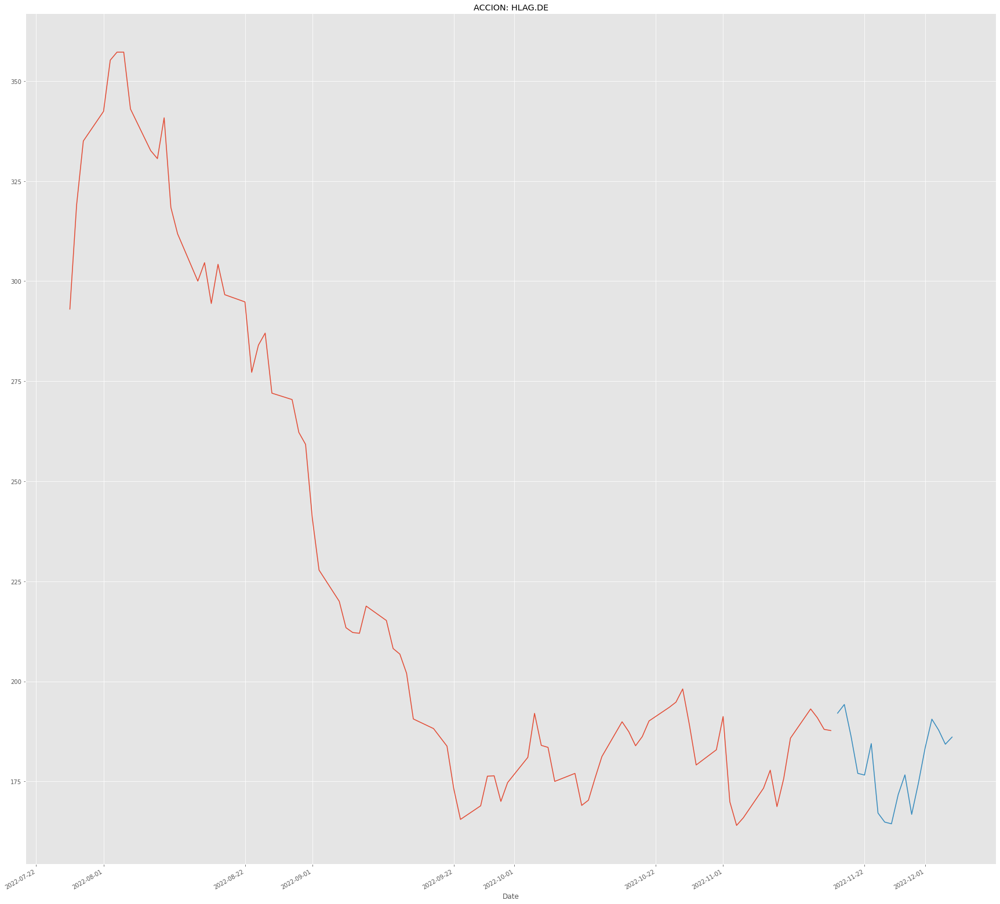


MAERSK-B.CO
Date
2022-12-16    14058.555139
2022-12-17    14546.453752
2022-12-18    14051.009181
2022-12-19    14494.688027
2022-12-20    14666.044253
2022-12-21    15145.627235
2022-12-22    15152.399713
2022-12-23    15832.802222
2022-12-24    15159.524384
2022-12-25    15560.301781
2022-12-26    15695.441945
2022-12-27    15810.035071
2022-12-28    15905.672521
2022-12-29    15891.029295
2022-12-30    15596.148594
2022-12-31    15164.217975
2023-01-01    15772.778129
2023-01-02    16147.417696
2023-01-03    15200.952966
2023-01-04    14318.870245
2023-01-05    14558.639437
2023-01-06    15275.504683
2023-01-07    15599.062781
2023-01-08    15102.382604
2023-01-09    15368.533854
2023-01-10    15400.252127
2023-01-11    15354.499536
2023-01-12    15254.841523
2023-01-13    14793.540564
2023-01-14    14911.950497
Name: Forecast, dtype: float64
----------------------


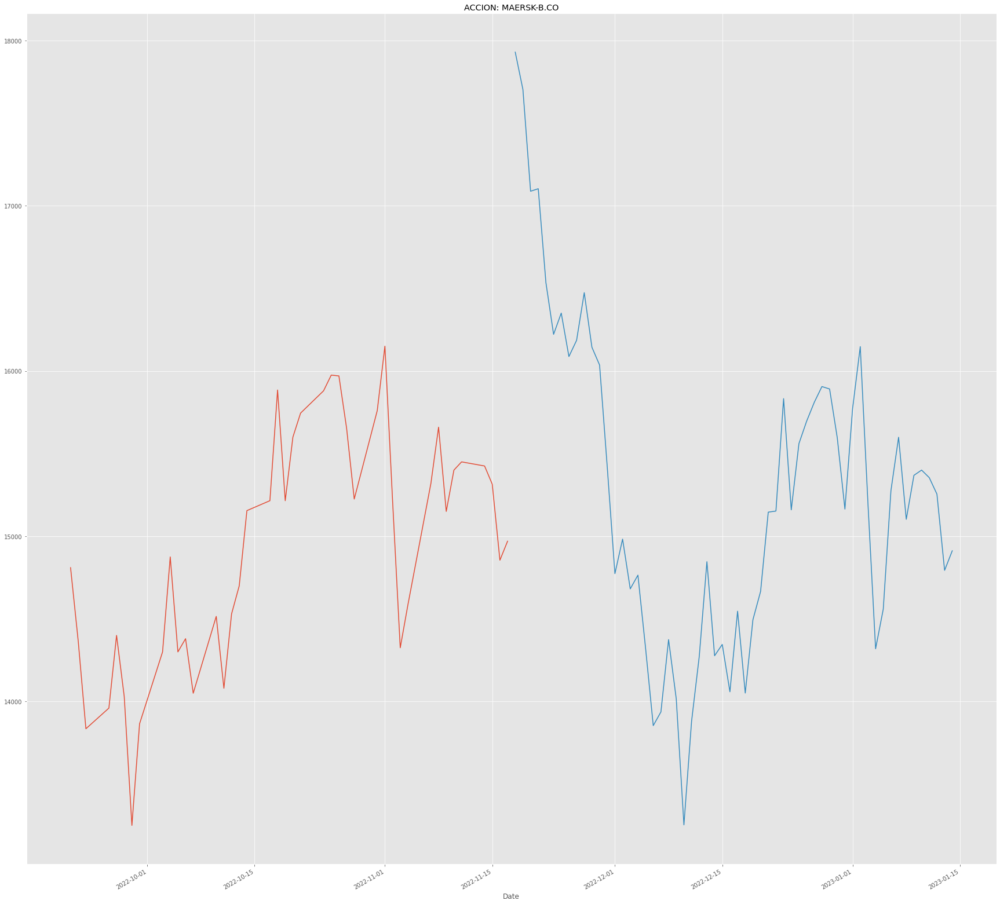


VALE
Date
2022-12-11    14.851228
2022-12-12    14.418756
2022-12-13    13.759408
2022-12-14    13.436099
2022-12-15    13.650732
2022-12-16    13.040626
2022-12-17    13.274171
2022-12-18    13.600443
2022-12-19    13.401254
2022-12-20    13.665954
2022-12-21    14.528169
2022-12-22    13.888832
2022-12-23    13.818542
2022-12-24    13.995302
2022-12-25    13.697888
2022-12-26    13.114721
2022-12-27    13.751737
2022-12-28    14.065414
2022-12-29    12.904299
2022-12-30    13.039569
2022-12-31    14.852752
2023-01-01    13.676658
2023-01-02    14.289850
2023-01-03    13.808644
2023-01-04    13.809097
2023-01-05    15.533845
2023-01-06    15.425073
2023-01-07    15.309069
2023-01-08    14.875747
2023-01-09    14.875810
Name: Forecast, dtype: float64
----------------------


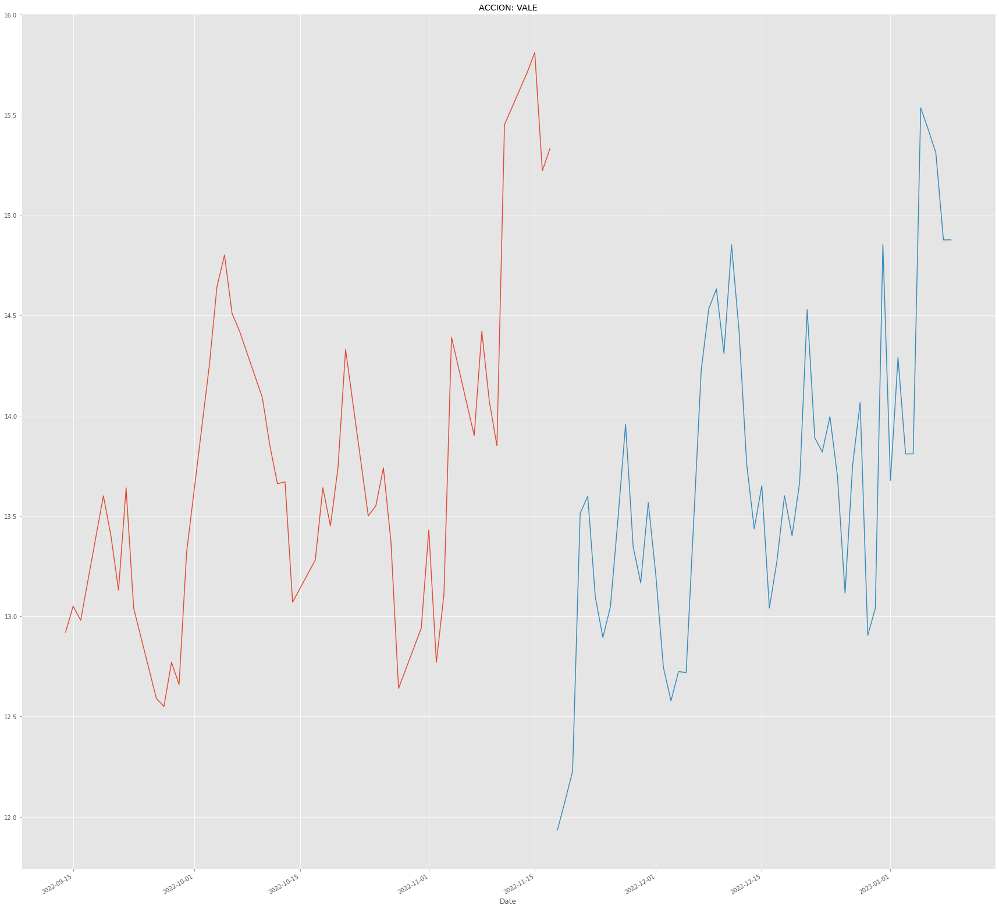


INVERCAP.SN
Date
2022-12-16    2200.623264
2022-12-17    2202.003518
2022-12-18    2203.329742
2022-12-19    2199.685754
2022-12-20    2199.978945
2022-12-21    2220.951195
2022-12-22    2196.352713
2022-12-23    2191.641865
2022-12-24    2205.778126
2022-12-25    2203.502482
2022-12-26    2205.338110
2022-12-27    2196.799421
2022-12-28    2178.316522
2022-12-29    2206.209549
2022-12-30    2205.471144
2022-12-31    2223.979020
2023-01-01    2192.430050
2023-01-02    2160.264578
2023-01-03    2158.337359
2023-01-04    2156.023882
2023-01-05    2223.608760
2023-01-06    2200.558457
2023-01-07    2199.687454
2023-01-08    2232.720091
2023-01-09    2241.340396
2023-01-10    2240.277019
2023-01-11    2244.404807
2023-01-12    2244.665406
2023-01-13    2246.599370
2023-01-14    2228.347919
Name: Forecast, dtype: float64
----------------------


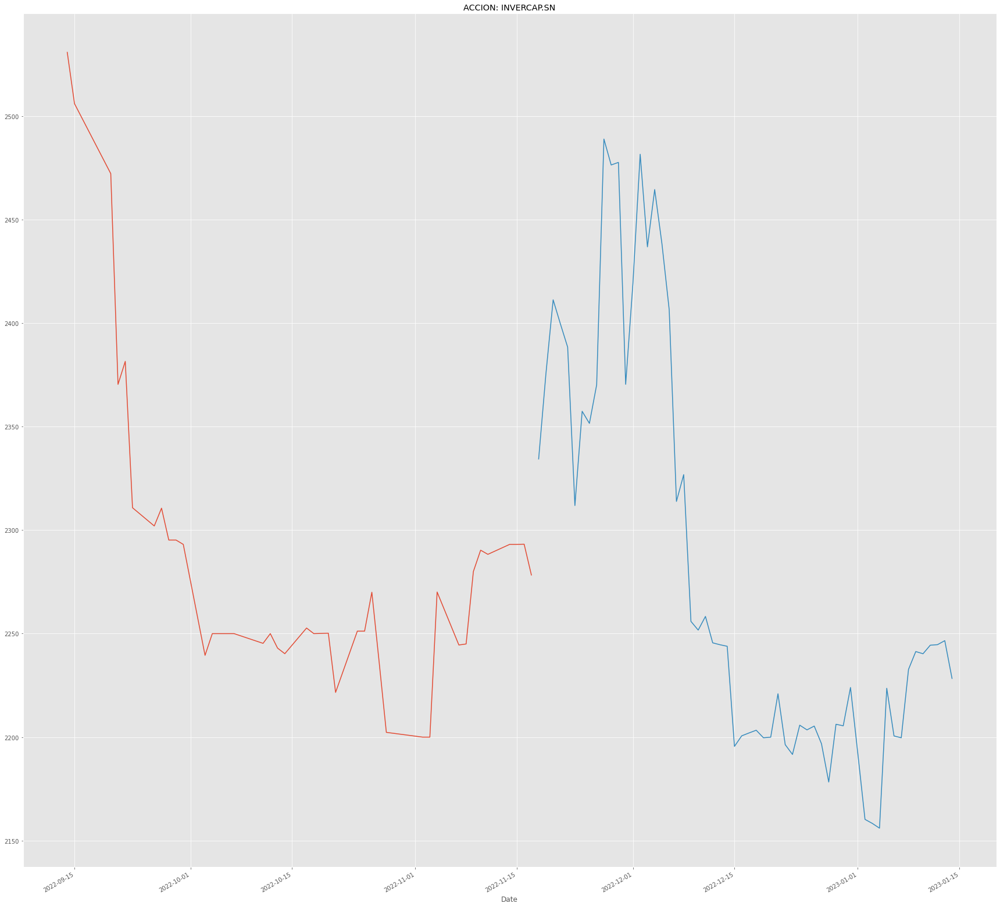


SQM-B.SN
Date
2022-12-16    101813.495028
2022-12-17     99032.834755
2022-12-18     98374.156290
2022-12-19     95084.310040
2022-12-20     93378.216910
2022-12-21     87372.930635
2022-12-22     90365.306398
2022-12-23     89295.961914
2022-12-24     94813.028747
2022-12-25     96299.313318
2022-12-26     97387.765562
2022-12-27    100313.771512
2022-12-28    100924.172347
2022-12-29     99132.298402
2022-12-30    102235.568925
2022-12-31    101457.057188
2023-01-01    100582.139629
2023-01-02     98907.659380
2023-01-03     96755.029794
2023-01-04    100049.478994
2023-01-05     99122.602711
2023-01-06     99802.424688
2023-01-07    105842.336057
2023-01-08    104102.082861
2023-01-09    106353.502417
2023-01-10    109171.109435
2023-01-11    104985.427769
2023-01-12    100579.297910
2023-01-13     99755.442324
2023-01-14     93612.529210
Name: Forecast, dtype: float64
----------------------


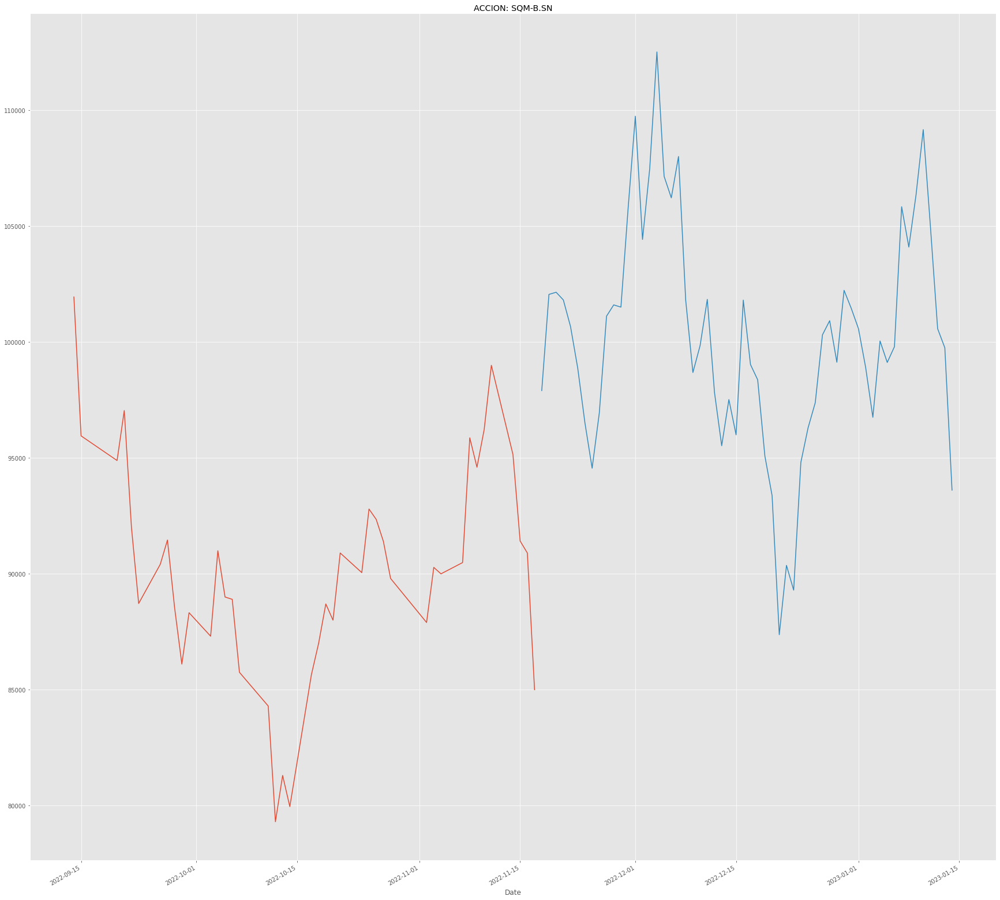


CHILE.SN
Date
2022-11-26    86.961055
2022-11-27    86.051935
2022-11-28    86.357005
2022-11-29    85.165633
2022-11-30    85.508059
2022-12-01    86.714551
2022-12-02    87.264827
2022-12-03    88.232960
2022-12-04    88.675563
2022-12-05    88.092906
2022-12-06    86.695386
2022-12-07    86.688305
2022-12-08    87.727265
2022-12-09    86.978882
2022-12-10    86.671347
2022-12-11    85.897157
2022-12-12    86.184596
2022-12-13    86.470359
2022-12-14    88.007949
2022-12-15    86.834810
2022-12-16    87.359599
2022-12-17    87.169891
2022-12-18    87.162260
2022-12-19    86.630376
2022-12-20    85.158301
2022-12-21    84.707114
2022-12-22    84.665710
2022-12-23    84.123567
2022-12-24    84.634752
2022-12-25    85.172708
Name: Forecast, dtype: float64
----------------------


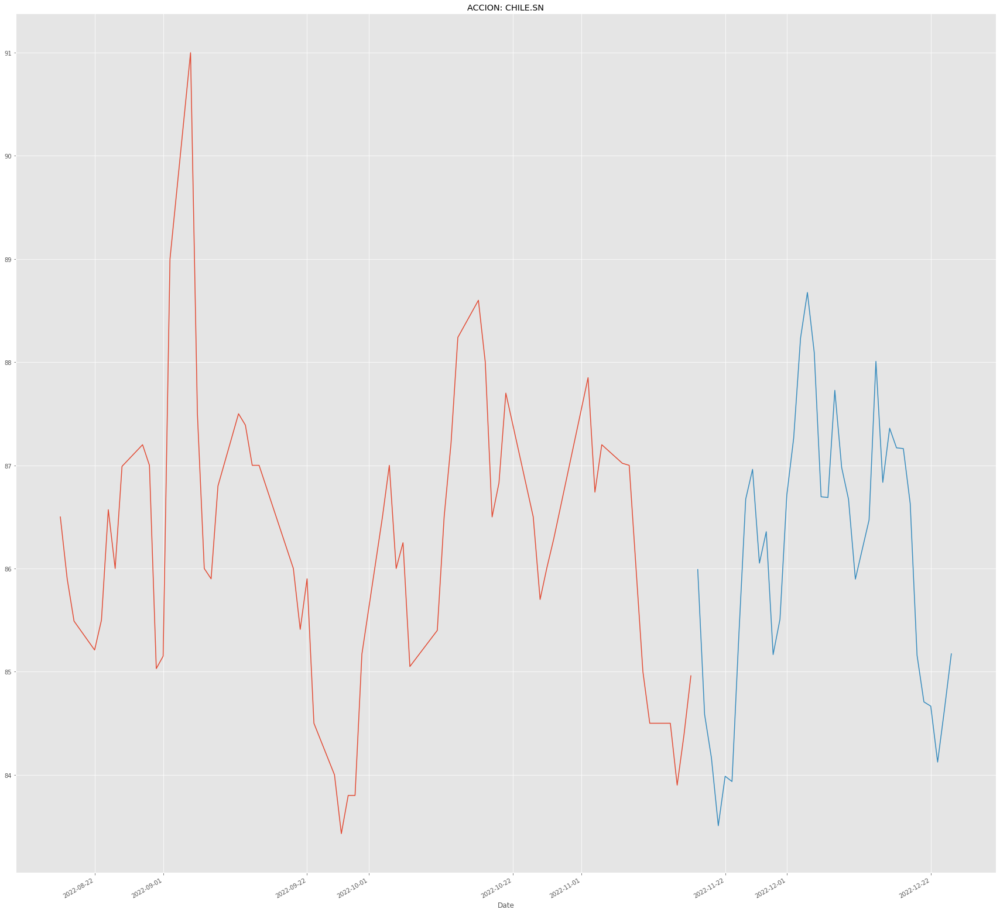


BSANTANDER.SN
Date
2022-12-10    33.931633
2022-12-11    33.911808
2022-12-12    33.354052
2022-12-13    33.196946
2022-12-14    33.006683
2022-12-15    33.459117
2022-12-16    33.427790
2022-12-17    32.967571
2022-12-18    34.494994
2022-12-19    34.549191
2022-12-20    33.569016
2022-12-21    32.963730
2022-12-22    33.681004
2022-12-23    33.635451
2022-12-24    34.077832
2022-12-25    33.932618
2022-12-26    34.246078
2022-12-27    33.701242
2022-12-28    33.603533
2022-12-29    33.130675
2022-12-30    33.226733
2022-12-31    33.605096
2023-01-01    34.624123
2023-01-02    33.814864
2023-01-03    33.777853
2023-01-04    33.838513
2023-01-05    33.710068
2023-01-06    33.296803
2023-01-07    33.008581
2023-01-08    32.942357
Name: Forecast, dtype: float64
----------------------


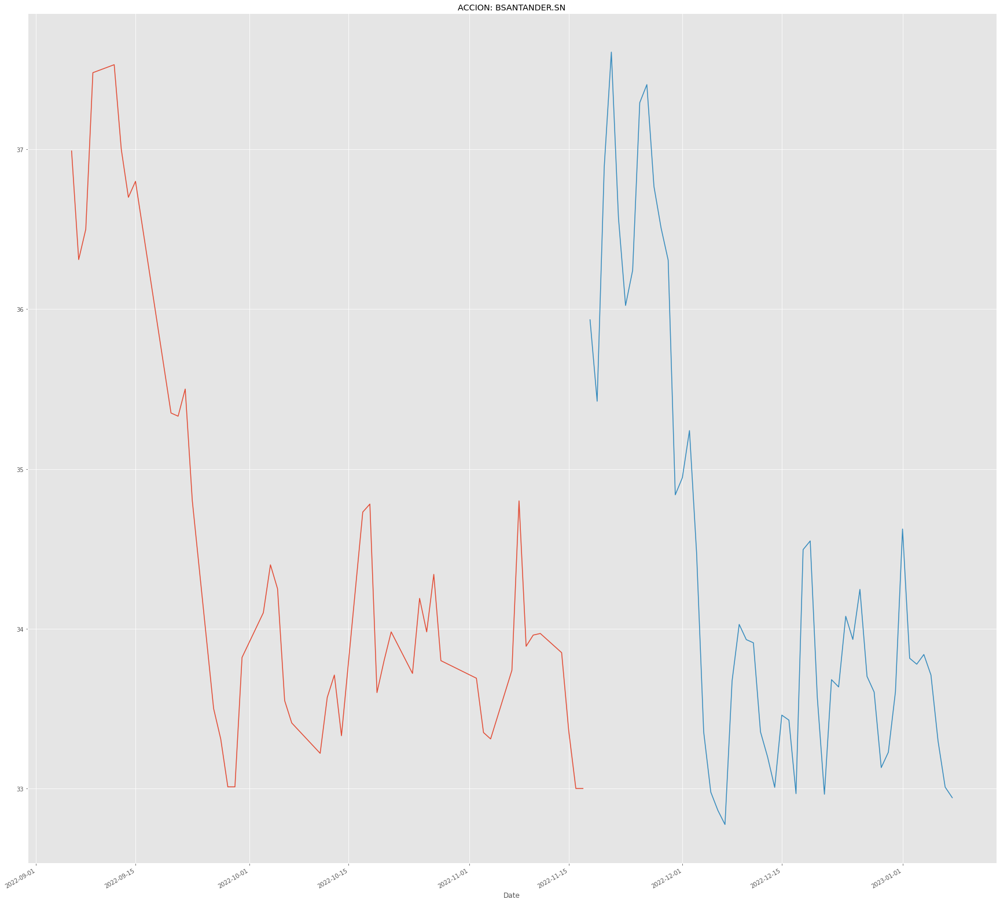


COPEC.SN
Date
2022-12-16    6489.797188
2022-12-17    6424.728176
2022-12-18    6412.858697
2022-12-19    6251.387691
2022-12-20    6057.978164
2022-12-21    6083.036469
2022-12-22    6144.456307
2022-12-23    6121.307975
2022-12-24    6328.221411
2022-12-25    6197.767124
2022-12-26    6188.152686
2022-12-27    6513.165977
2022-12-28    6279.992694
2022-12-29    6180.783230
2022-12-30    6388.239605
2022-12-31    6377.552878
2023-01-01    6558.188032
2023-01-02    6486.327052
2023-01-03    6448.970879
2023-01-04    6353.144214
2023-01-05    6477.359176
2023-01-06    6627.749428
2023-01-07    6846.413762
2023-01-08    6813.438707
2023-01-09    6682.977859
2023-01-10    6556.052020
2023-01-11    6537.967429
2023-01-12    6377.942659
2023-01-13    6348.534568
2023-01-14    6390.157973
Name: Forecast, dtype: float64
----------------------


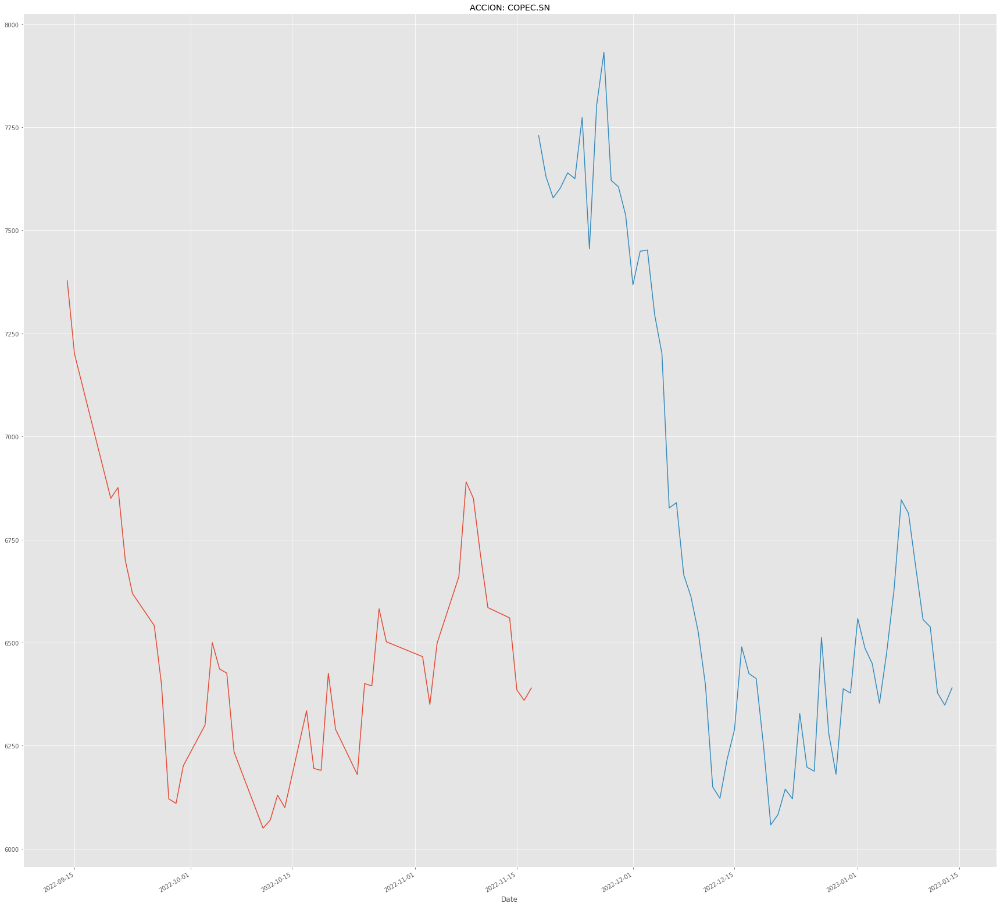


CENCOSUD.SN
Date
2022-12-16    1269.982017
2022-12-17    1268.123613
2022-12-18    1259.875824
2022-12-19    1250.756065
2022-12-20    1200.762108
2022-12-21    1190.235365
2022-12-22    1203.654618
2022-12-23    1212.474062
2022-12-24    1208.182193
2022-12-25    1207.714185
2022-12-26    1187.855438
2022-12-27    1242.982891
2022-12-28    1210.208511
2022-12-29    1210.645651
2022-12-30    1235.296333
2022-12-31    1254.819955
2023-01-01    1257.387115
2023-01-02    1268.317358
2023-01-03    1295.202189
2023-01-04    1295.515747
2023-01-05    1324.552771
2023-01-06    1353.337230
2023-01-07    1362.316374
2023-01-08    1334.585805
2023-01-09    1312.912051
2023-01-10    1297.915279
2023-01-11    1284.442252
2023-01-12    1287.122258
2023-01-13    1292.694710
2023-01-14    1296.100723
Name: Forecast, dtype: float64
----------------------


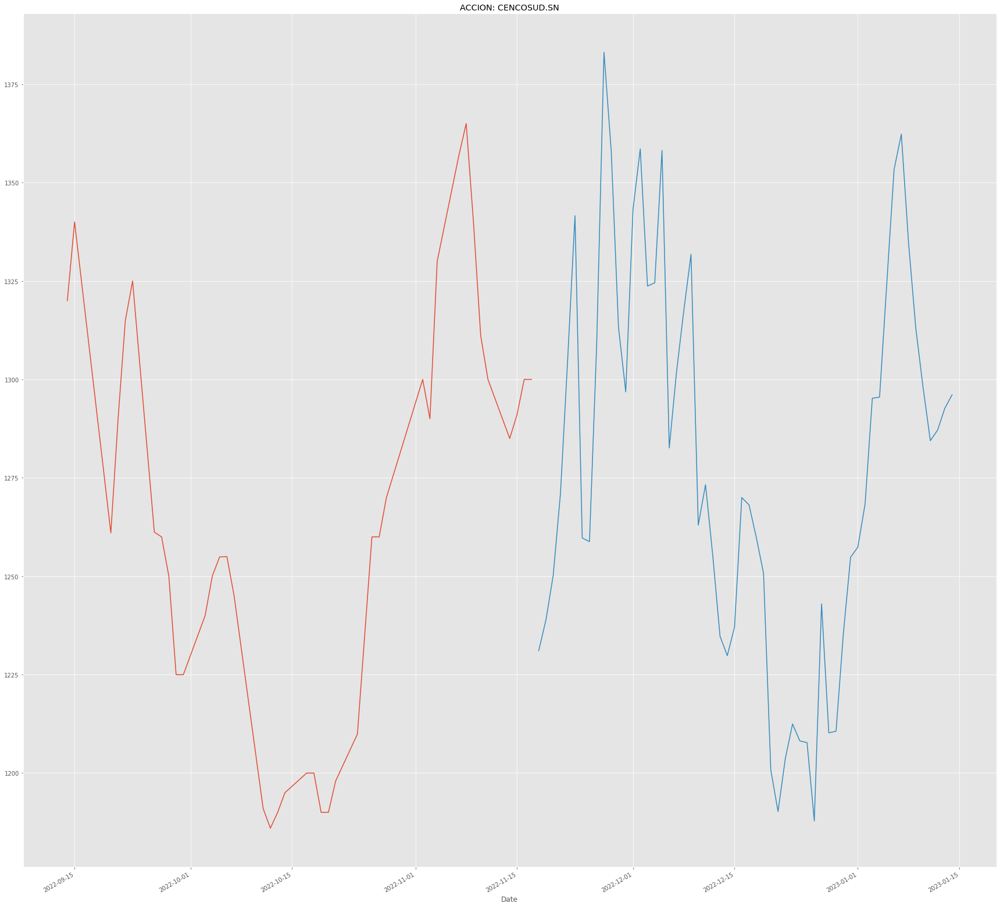


FALABELLA.SN
Date
2022-12-16    1940.906283
2022-12-17    1906.285471
2022-12-18    1903.328970
2022-12-19    1790.056518
2022-12-20    1824.208295
2022-12-21    1816.751125
2022-12-22    1797.792030
2022-12-23    1846.649536
2022-12-24    1859.334455
2022-12-25    1860.114004
2022-12-26    1831.182377
2022-12-27    1785.455804
2022-12-28    1777.569304
2022-12-29    1786.219331
2022-12-30    1819.083120
2022-12-31    1840.202889
2023-01-01    1866.916035
2023-01-02    1882.269918
2023-01-03    1893.640946
2023-01-04    1883.228201
2023-01-05    1886.813107
2023-01-06    1889.388190
2023-01-07    1870.682876
2023-01-08    1830.534421
2023-01-09    1790.167138
2023-01-10    1777.638404
2023-01-11    1725.362656
2023-01-12    1713.180759
2023-01-13    1691.628298
2023-01-14    1652.992964
Name: Forecast, dtype: float64
----------------------


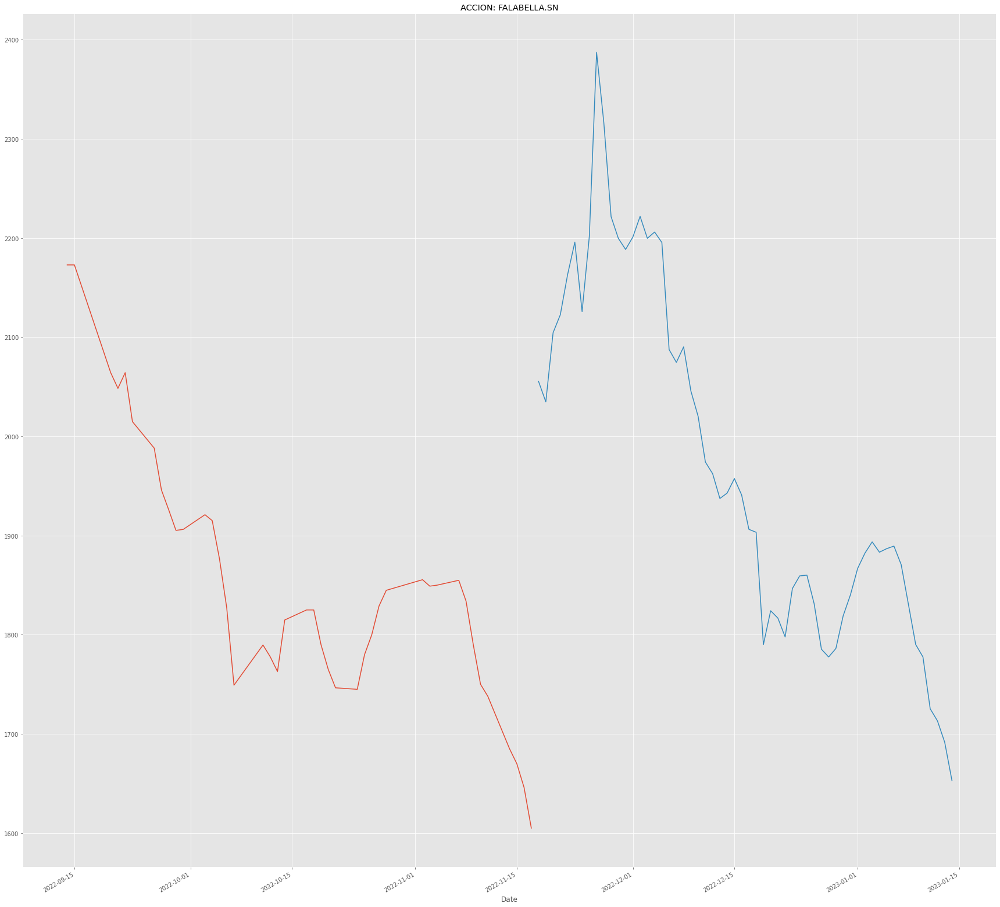


ENELAM.SN
Date
2022-12-16    100.189984
2022-12-17     99.858579
2022-12-18    101.513727
2022-12-19    102.529848
2022-12-20    104.008725
2022-12-21    104.228419
2022-12-22    103.797833
2022-12-23    103.465217
2022-12-24    103.991335
2022-12-25    103.612414
2022-12-26    103.226173
2022-12-27    101.449409
2022-12-28    105.183265
2022-12-29     97.980239
2022-12-30     98.111476
2022-12-31     94.193829
2023-01-01     92.361333
2023-01-02     92.752399
2023-01-03     95.117462
2023-01-04     93.386834
2023-01-05     93.794944
2023-01-06     94.078497
2023-01-07     95.252511
2023-01-08     95.222607
2023-01-09     94.156754
2023-01-10     94.066092
2023-01-11     93.410371
2023-01-12     94.151960
2023-01-13     91.815452
2023-01-14     89.964913
Name: Forecast, dtype: float64
----------------------


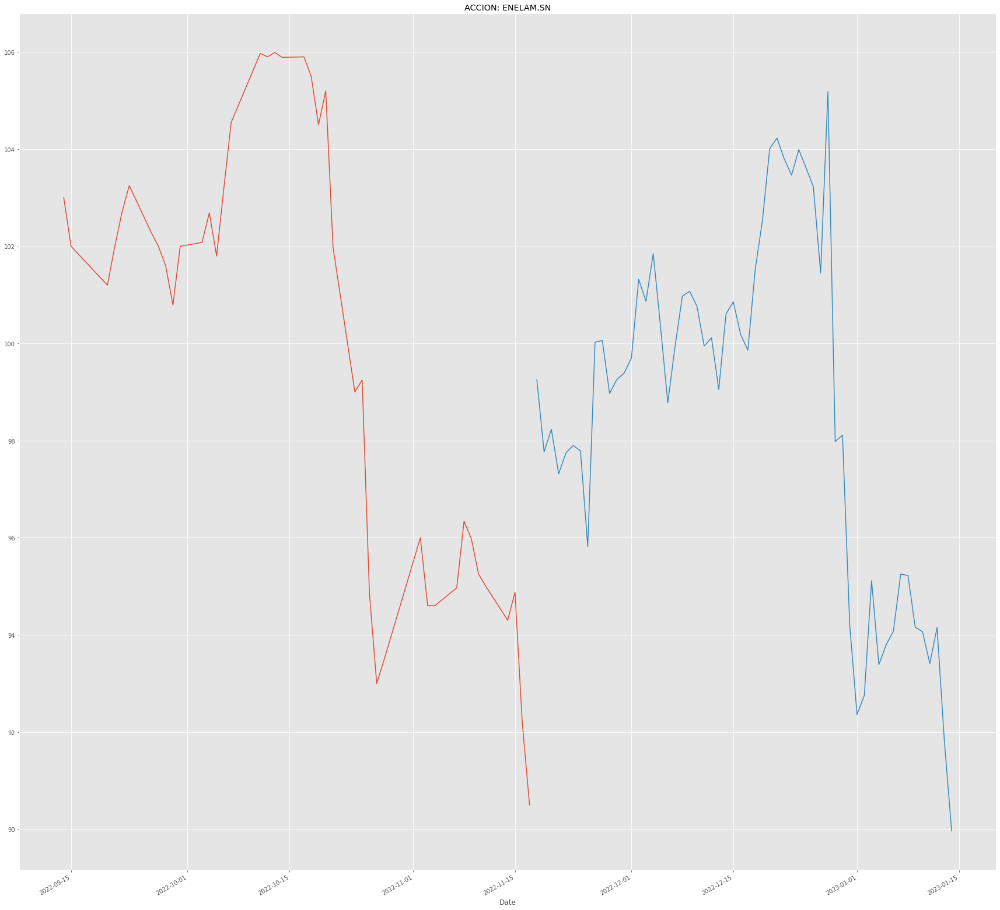


CMPC.SN
Date
2022-12-16    1496.373929
2022-12-17    1476.045373
2022-12-18    1493.606019
2022-12-19    1467.673859
2022-12-20    1372.113481
2022-12-21    1410.788217
2022-12-22    1359.566012
2022-12-23    1331.055698
2022-12-24    1355.274931
2022-12-25    1364.858069
2022-12-26    1370.158832
2022-12-27    1330.559142
2022-12-28    1380.347873
2022-12-29    1444.967406
2022-12-30    1415.229241
2022-12-31    1443.983344
2023-01-01    1473.286049
2023-01-02    1479.674268
2023-01-03    1453.688543
2023-01-04    1462.727507
2023-01-05    1486.682247
2023-01-06    1544.422841
2023-01-07    1612.136446
2023-01-08    1589.944560
2023-01-09    1550.690501
2023-01-10    1523.450900
2023-01-11    1536.872879
2023-01-12    1508.461345
2023-01-13    1496.182150
2023-01-14    1512.894352
Name: Forecast, dtype: float64
----------------------


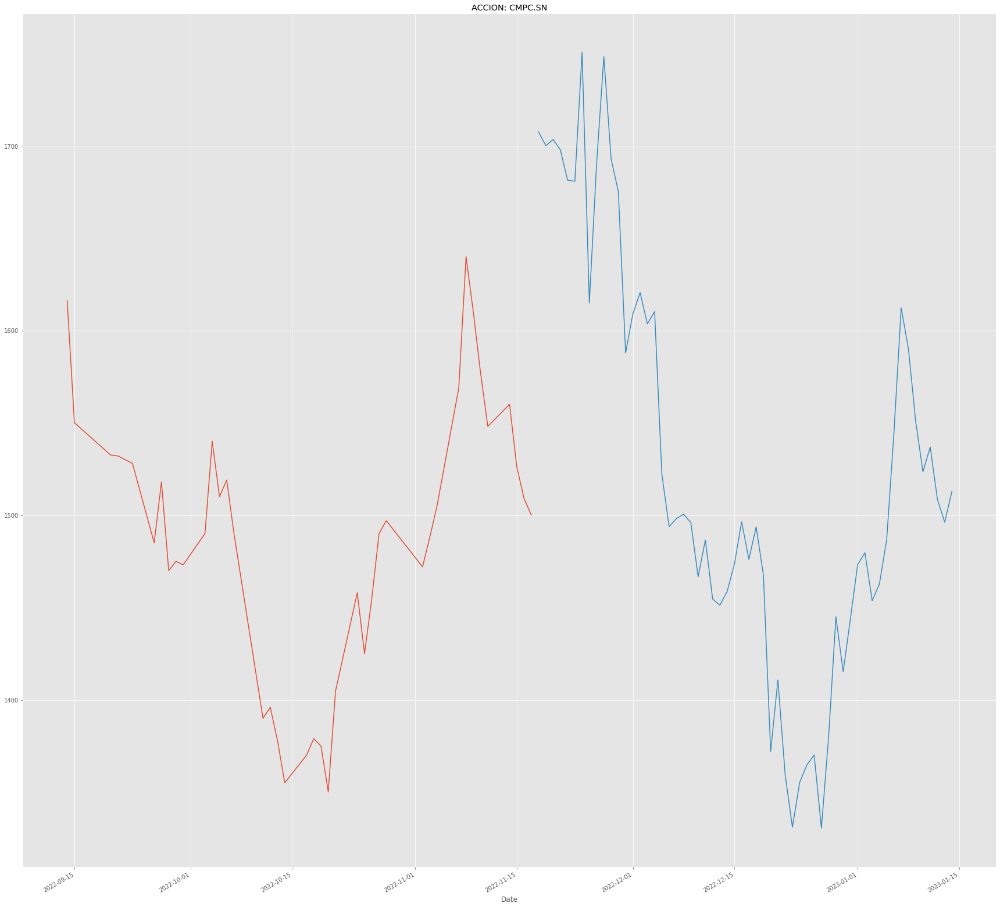


BCI.SN
Date
2022-11-26    25319.828361
2022-11-27    25289.496170
2022-11-28    25595.806047
2022-11-29    24930.235256
2022-11-30    24076.493688
2022-12-01    23756.926416
2022-12-02    23762.478391
2022-12-03    24001.947670
2022-12-04    25352.158018
2022-12-05    26030.355834
2022-12-06    25534.327975
2022-12-07    25456.287967
2022-12-08    25949.127939
2022-12-09    25898.867598
2022-12-10    26282.570494
2022-12-11    26212.064056
2022-12-12    26120.651524
2022-12-13    26175.482709
2022-12-14    26039.807573
2022-12-15    25270.522660
2022-12-16    25623.908168
2022-12-17    26085.787811
2022-12-18    26166.756602
2022-12-19    26115.587951
2022-12-20    25913.164392
2022-12-21    25873.194689
2022-12-22    25636.266100
2022-12-23    25851.405666
2022-12-24    25938.866112
2022-12-25    26033.079440
Name: Forecast, dtype: float64
----------------------


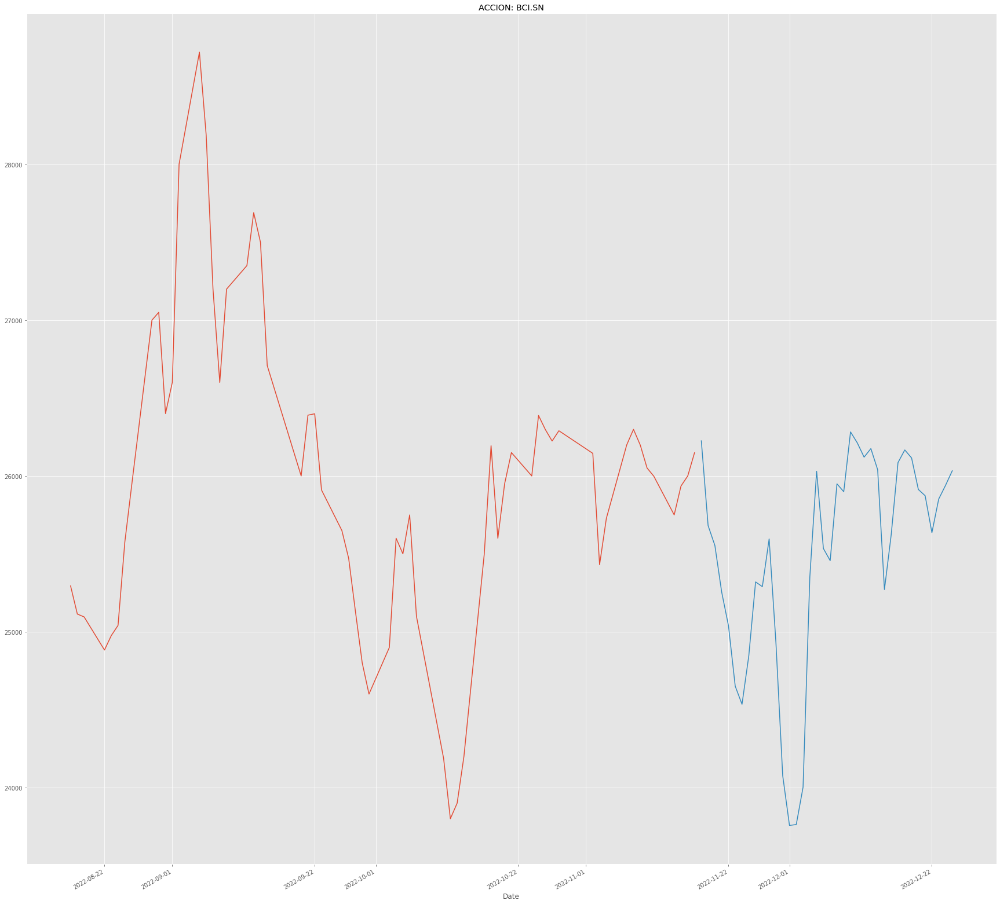


VAPORES.SN
Date
2022-12-16    74.609242
2022-12-17    72.386970
2022-12-18    72.496458
2022-12-19    68.391225
2022-12-20    66.470633
2022-12-21    63.172503
2022-12-22    62.369596
2022-12-23    63.348822
2022-12-24    65.761109
2022-12-25    64.532710
2022-12-26    64.364905
2022-12-27    73.448593
2022-12-28    69.700801
2022-12-29    66.084768
2022-12-30    66.081099
2022-12-31    65.849423
2023-01-01    67.865133
2023-01-02    67.399502
2023-01-03    65.988965
2023-01-04    64.402312
2023-01-05    66.525087
2023-01-06    71.208190
2023-01-07    74.337604
2023-01-08    72.109874
2023-01-09    72.849636
2023-01-10    74.057470
2023-01-11    75.347103
2023-01-12    73.545455
2023-01-13    73.831525
2023-01-14    73.975407
Name: Forecast, dtype: float64
----------------------


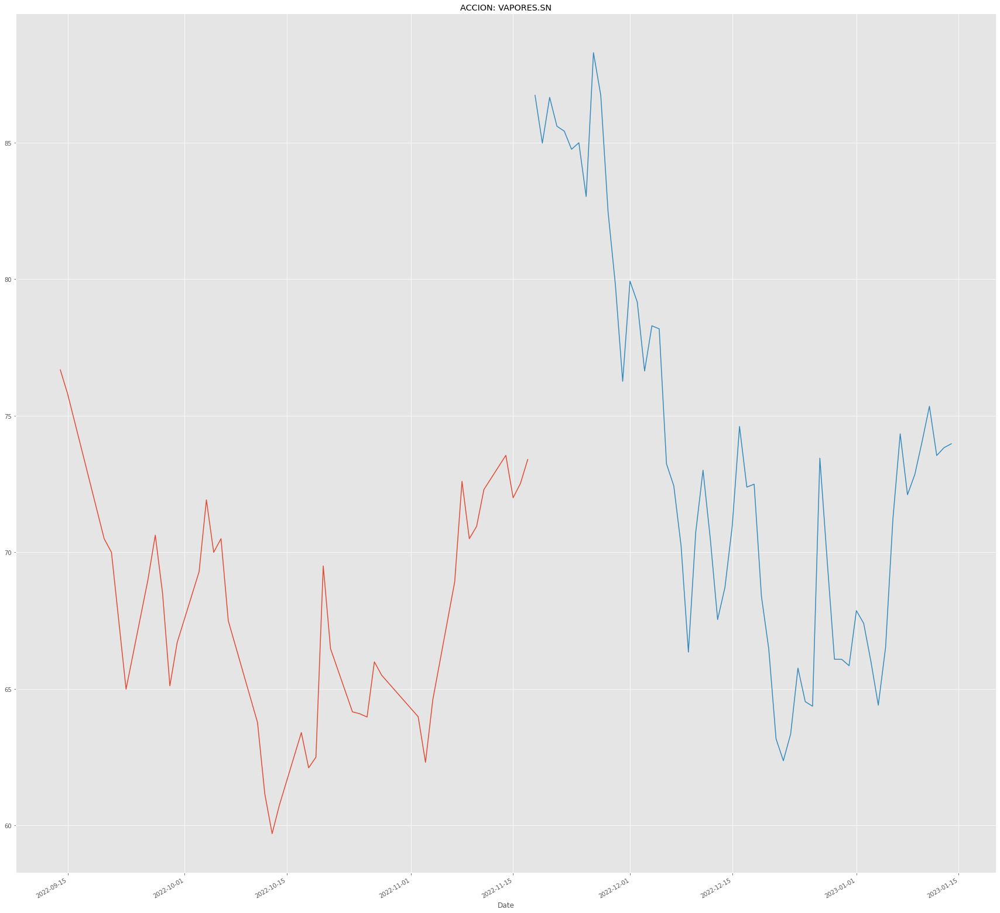


CAP.SN
Date
2022-12-16    6441.063887
2022-12-17    6250.759084
2022-12-18    6153.817972
2022-12-19    6059.969384
2022-12-20    5786.313388
2022-12-21    5660.297576
2022-12-22    5511.397992
2022-12-23    5588.267319
2022-12-24    5593.413419
2022-12-25    5686.916288
2022-12-26    5659.667228
2022-12-27    5399.263979
2022-12-28    5453.000119
2022-12-29    5433.335103
2022-12-30    5348.316361
2022-12-31    5310.175880
2023-01-01    5205.151814
2023-01-02    5075.075667
2023-01-03    5187.601569
2023-01-04    5078.405364
2023-01-05    5496.145469
2023-01-06    5446.219939
2023-01-07    5591.835600
2023-01-08    5548.430011
2023-01-09    5765.749525
2023-01-10    5993.959845
2023-01-11    6025.131304
2023-01-12    6227.997930
2023-01-13    6605.190779
2023-01-14    6131.961149
Name: Forecast, dtype: float64
----------------------


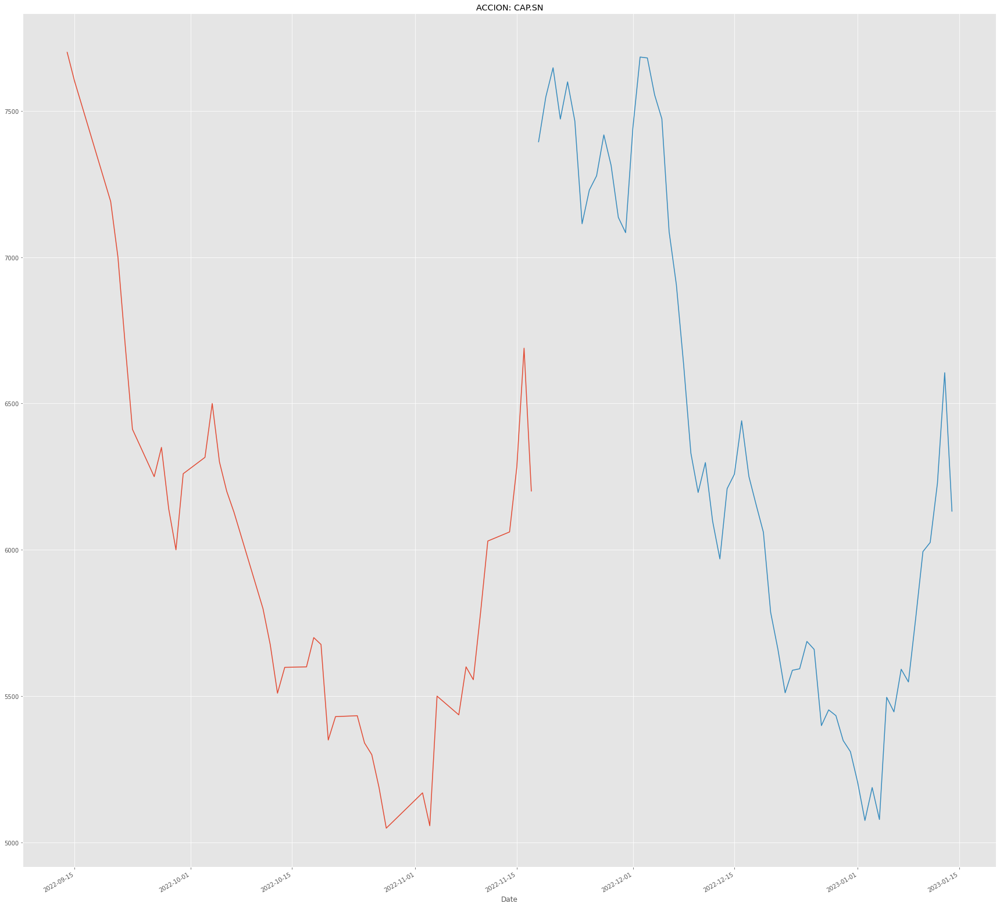


CCU.SN
Date
2022-12-16    5145.657244
2022-12-17    5094.761577
2022-12-18    5227.081243
2022-12-19    4998.292688
2022-12-20    4862.022631
2022-12-21    4890.684583
2022-12-22    4993.787312
2022-12-23    4998.563906
2022-12-24    5183.172662
2022-12-25    5272.064660
2022-12-26    5192.466414
2022-12-27    5194.537314
2022-12-28    5128.427184
2022-12-29    5056.799096
2022-12-30    5052.949641
2022-12-31    5016.726704
2023-01-01    5045.972591
2023-01-02    5169.204733
2023-01-03    5222.919867
2023-01-04    5174.085122
2023-01-05    5192.641303
2023-01-06    5183.350639
2023-01-07    5218.172011
2023-01-08    5154.531581
2023-01-09    5050.522148
2023-01-10    5096.015609
2023-01-11    5098.089191
2023-01-12    5168.106329
2023-01-13    5203.129011
2023-01-14    5192.675682
Name: Forecast, dtype: float64
----------------------


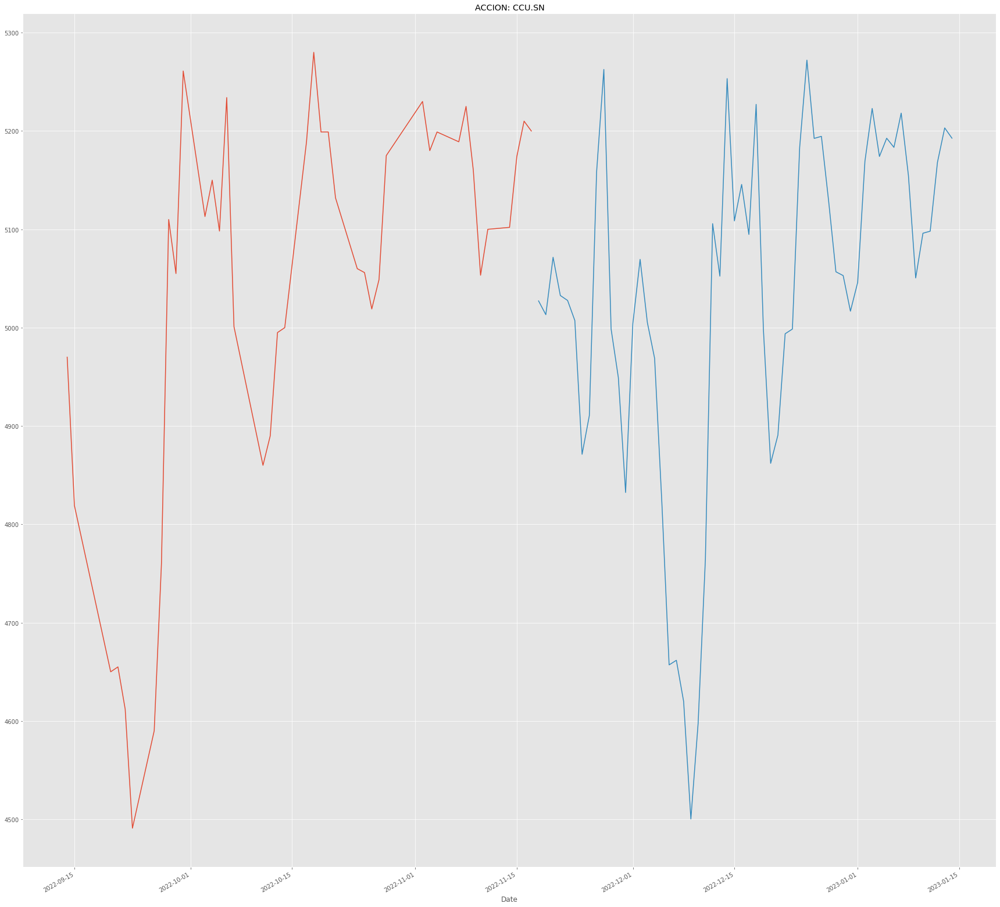


ENELCHILE.SN
Date
2022-10-28          NaN
2022-11-02          NaN
2022-11-03          NaN
2022-11-04          NaN
2022-11-07          NaN
2022-11-08          NaN
2022-11-09          NaN
2022-11-10          NaN
2022-11-11          NaN
2022-11-14          NaN
2022-11-15          NaN
2022-11-16          NaN
2022-11-17          NaN
2022-11-18    30.133713
2022-11-19    30.589808
2022-11-20    30.908172
2022-11-21    32.200202
2022-11-22    33.625740
2022-11-23    34.463498
2022-11-24    34.130937
2022-11-25    34.130880
2022-11-26    35.249018
2022-11-27    35.014214
2022-11-28    34.758480
2022-11-29    33.652882
2022-11-30    33.963581
2022-12-01    34.274854
2022-12-02    33.480899
2022-12-03    33.611367
2022-12-04    34.999313
Name: Forecast, dtype: float64
----------------------


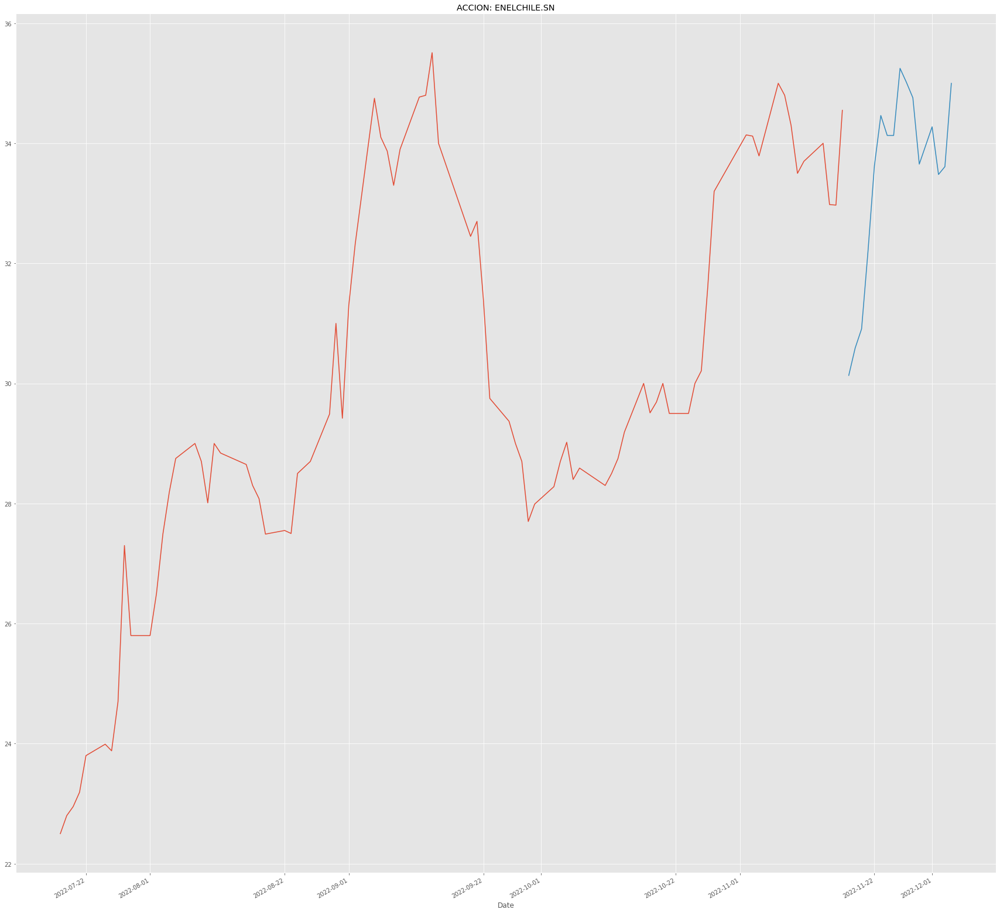


ANDINA-B.SN
Date
2022-12-16    1664.530738
2022-12-17    1633.173206
2022-12-18    1651.053120
2022-12-19    1619.735202
2022-12-20    1615.693284
2022-12-21    1643.748579
2022-12-22    1647.411991
2022-12-23    1640.536086
2022-12-24    1626.223114
2022-12-25    1610.996520
2022-12-26    1610.465867
2022-12-27    1606.059355
2022-12-28    1615.206489
2022-12-29    1615.398540
2022-12-30    1651.149806
2022-12-31    1639.825525
2023-01-01    1668.046086
2023-01-02    1648.300036
2023-01-03    1661.082657
2023-01-04    1646.110004
2023-01-05    1648.317489
2023-01-06    1669.096885
2023-01-07    1684.070018
2023-01-08    1658.330562
2023-01-09    1681.000339
2023-01-10    1668.378845
2023-01-11    1670.129086
2023-01-12    1696.116134
2023-01-13    1697.882360
2023-01-14    1725.433468
Name: Forecast, dtype: float64
----------------------


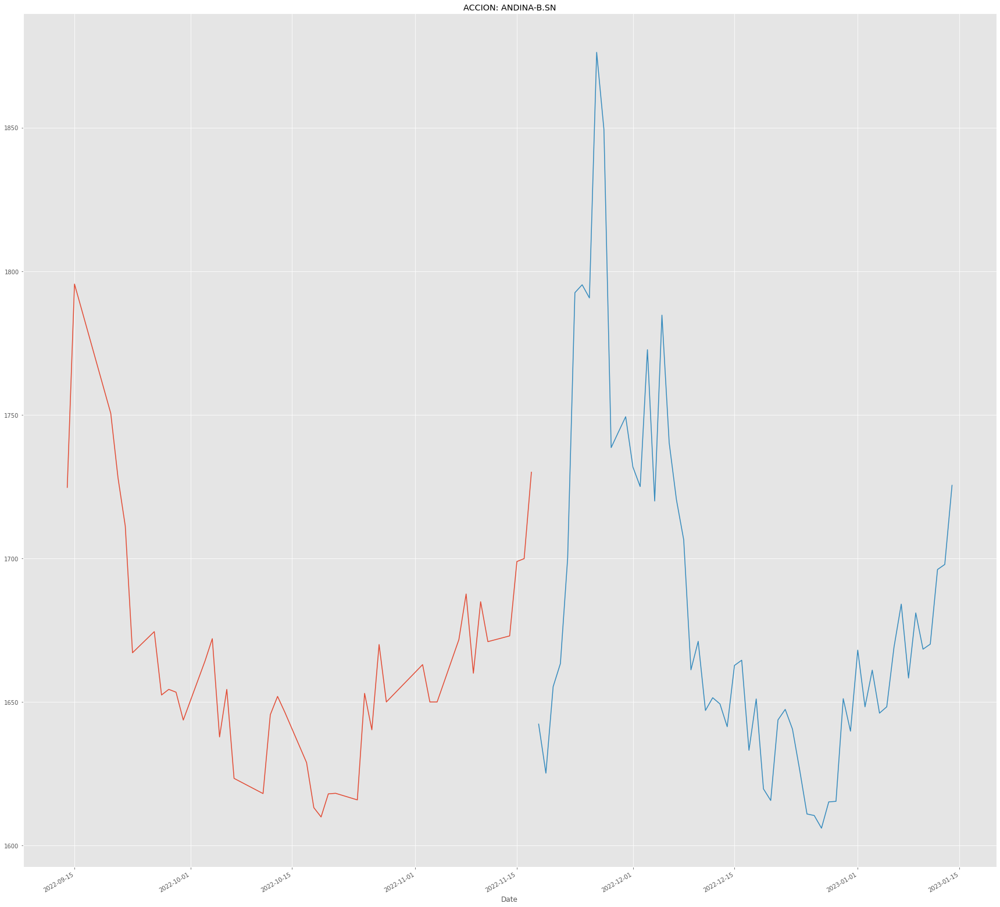


CONCHATORO.SN
Date
2022-12-16    1075.477822
2022-12-17    1073.474156
2022-12-18    1066.158615
2022-12-19    1051.854369
2022-12-20    1032.541247
2022-12-21    1036.617343
2022-12-22    1032.052094
2022-12-23    1029.704754
2022-12-24    1039.636822
2022-12-25    1048.951548
2022-12-26    1043.932026
2022-12-27    1038.478894
2022-12-28    1040.661858
2022-12-29    1034.288697
2022-12-30    1042.413329
2022-12-31    1057.927708
2023-01-01    1071.268837
2023-01-02    1058.555040
2023-01-03    1046.009714
2023-01-04    1051.971812
2023-01-05    1043.306624
2023-01-06    1069.512325
2023-01-07    1071.420425
2023-01-08    1067.276789
2023-01-09    1044.042105
2023-01-10    1033.478772
2023-01-11    1046.910736
2023-01-12    1057.957270
2023-01-13    1064.224149
2023-01-14    1064.529189
Name: Forecast, dtype: float64
----------------------


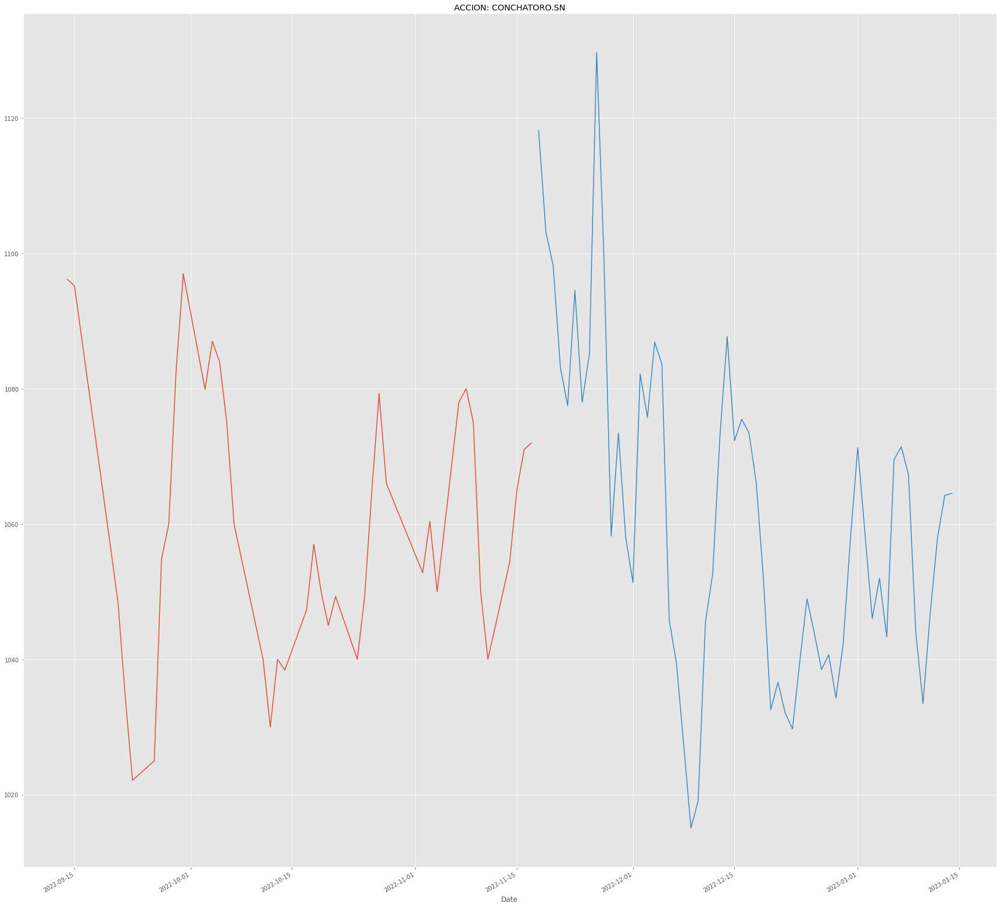


PARAUCO.SN
Date
2022-12-16    809.546939
2022-12-17    792.627308
2022-12-18    801.062375
2022-12-19    765.562898
2022-12-20    757.224015
2022-12-21    751.826904
2022-12-22    760.270034
2022-12-23    768.368881
2022-12-24    783.735934
2022-12-25    794.078484
2022-12-26    791.937784
2022-12-27    734.812230
2022-12-28    765.352787
2022-12-29    753.574958
2022-12-30    762.007457
2022-12-31    755.898814
2023-01-01    771.450510
2023-01-02    800.275862
2023-01-03    813.880449
2023-01-04    796.850247
2023-01-05    832.725437
2023-01-06    864.188177
2023-01-07    869.660970
2023-01-08    899.507427
2023-01-09    931.659938
2023-01-10    922.056236
2023-01-11    925.423606
2023-01-12    928.858014
2023-01-13    953.628398
2023-01-14    957.237370
Name: Forecast, dtype: float64
----------------------


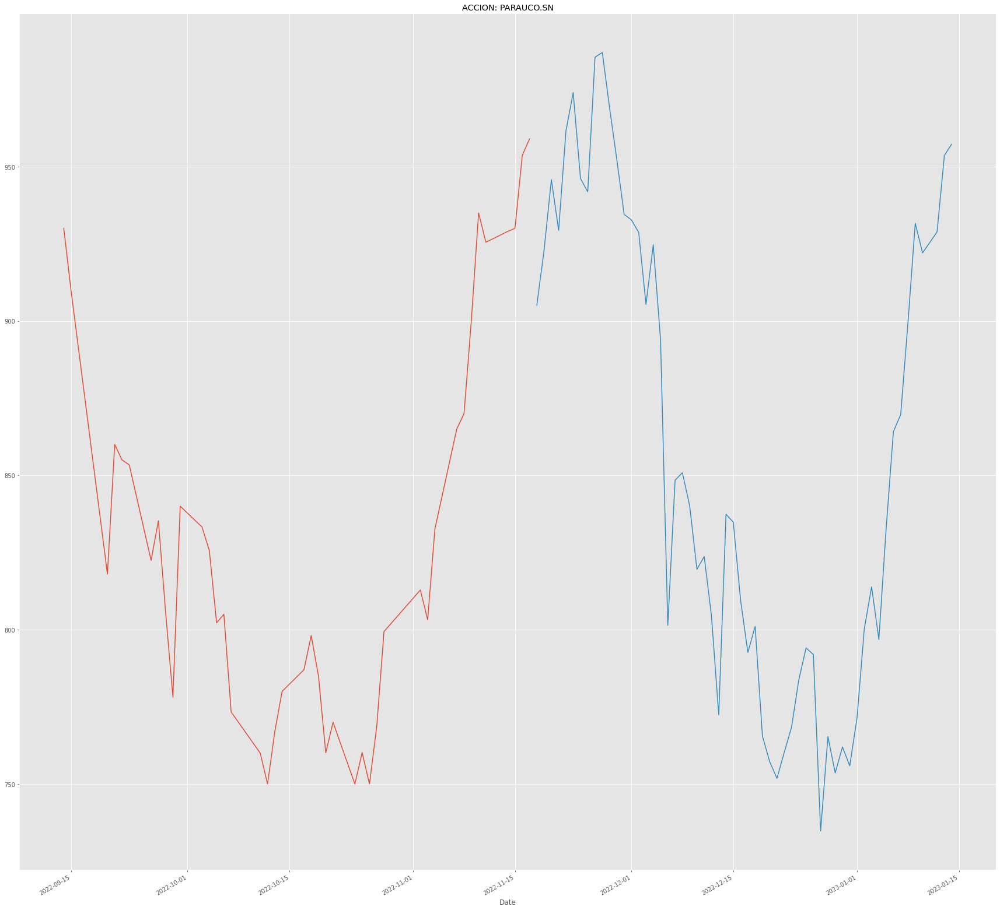


ITAUCORP.SN
Date
2022-12-09    2.005294
2022-12-10    1.998730
2022-12-11    1.948193
2022-12-12    1.899297
2022-12-13    1.865957
2022-12-14    1.841892
2022-12-15    1.942101
2022-12-16    1.947864
2022-12-17    1.921362
2022-12-18    1.924506
2022-12-19    1.863209
2022-12-20    2.073727
2022-12-21    1.955942
2022-12-22    1.880652
2022-12-23    1.864939
2022-12-24    1.910270
2022-12-25    1.888040
2022-12-26    1.903003
2022-12-27    1.881970
2022-12-28    1.910725
2022-12-29    1.911521
2022-12-30    1.947122
2022-12-31    1.993767
2023-01-01    1.967542
2023-01-02    2.002093
2023-01-03    2.004109
2023-01-04    2.008080
2023-01-05    1.976624
2023-01-06    1.972297
2023-01-07    1.946158
Name: Forecast, dtype: float64
----------------------


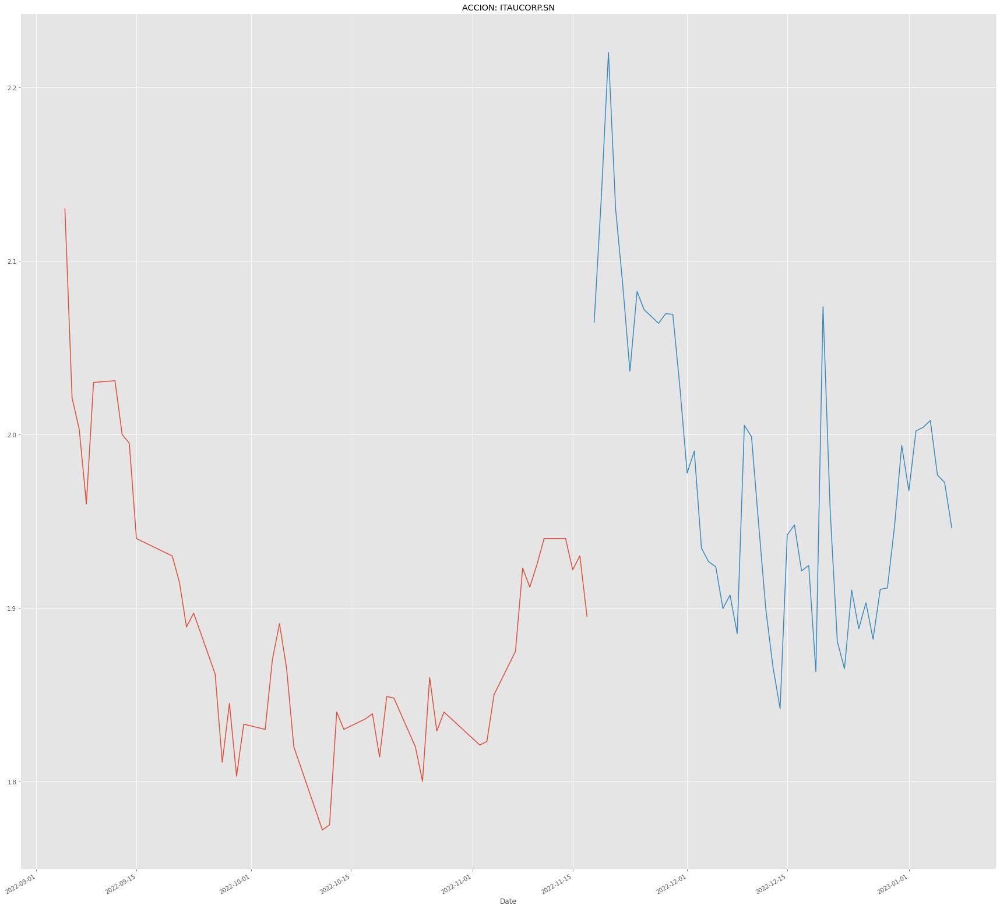


AGUAS-A.SN
Date
2022-12-16    190.499567
2022-12-17    188.886045
2022-12-18    191.312792
2022-12-19    193.102564
2022-12-20    190.050620
2022-12-21    188.327817
2022-12-22    187.937373
2022-12-23    190.043396
2022-12-24    193.068725
2022-12-25    193.073923
2022-12-26    191.746170
2022-12-27    192.011523
2022-12-28    192.603741
2022-12-29    192.371188
2022-12-30    192.736705
2022-12-31    194.135248
2023-01-01    198.151897
2023-01-02    199.055328
2023-01-03    199.086808
2023-01-04    197.985140
2023-01-05    196.601162
2023-01-06    198.063589
2023-01-07    198.961547
2023-01-08    198.142582
2023-01-09    198.141453
2023-01-10    198.029252
2023-01-11    197.054902
2023-01-12    198.148309
2023-01-13    198.036574
2023-01-14    197.105877
Name: Forecast, dtype: float64
----------------------


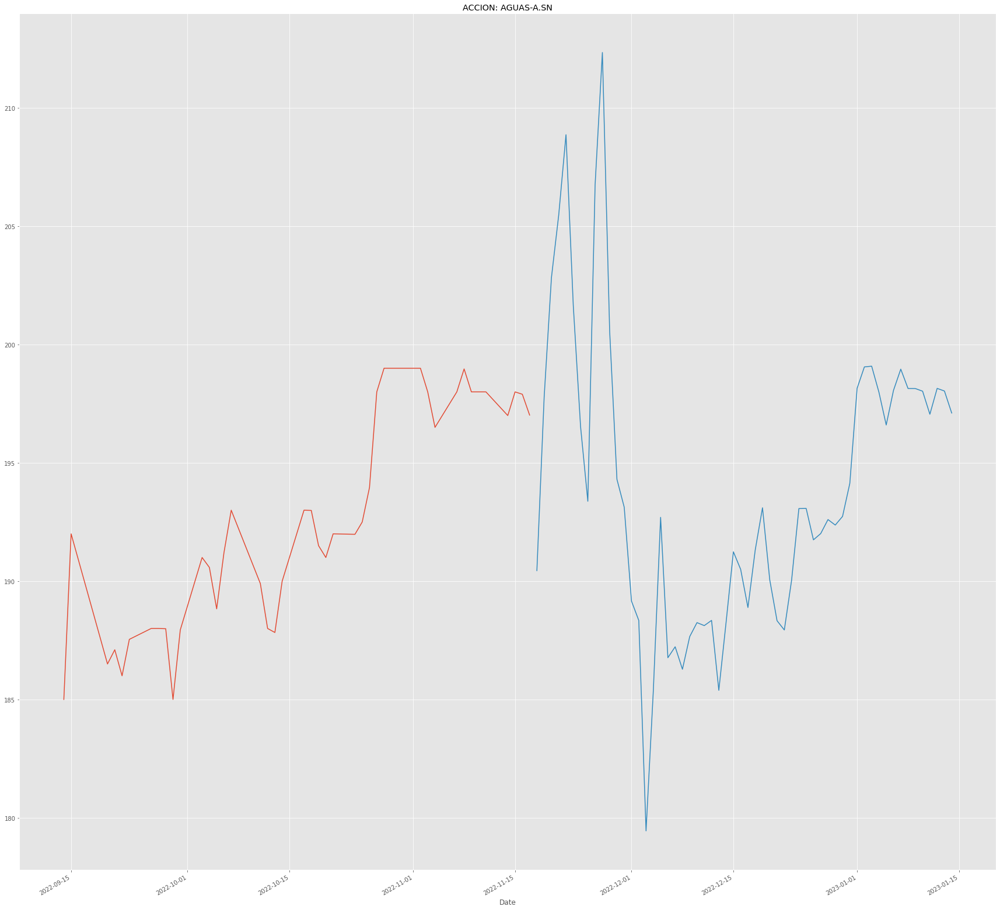


COLBUN.SN
Date
2022-12-16    84.799528
2022-12-17    84.955360
2022-12-18    84.050811
2022-12-19    82.589915
2022-12-20    80.919947
2022-12-21    80.743789
2022-12-22    80.582993
2022-12-23    81.940786
2022-12-24    83.720468
2022-12-25    85.002325
2022-12-26    86.384034
2022-12-27    89.728877
2022-12-28    88.659413
2022-12-29    86.691005
2022-12-30    87.459493
2022-12-31    87.566748
2023-01-01    90.437393
2023-01-02    93.953666
2023-01-03    94.674130
2023-01-04    94.762411
2023-01-05    93.846827
2023-01-06    94.771279
2023-01-07    93.171767
2023-01-08    92.779440
2023-01-09    92.460638
2023-01-10    91.168068
2023-01-11    90.532274
2023-01-12    89.030788
2023-01-13    88.184779
2023-01-14    87.563506
Name: Forecast, dtype: float64
----------------------


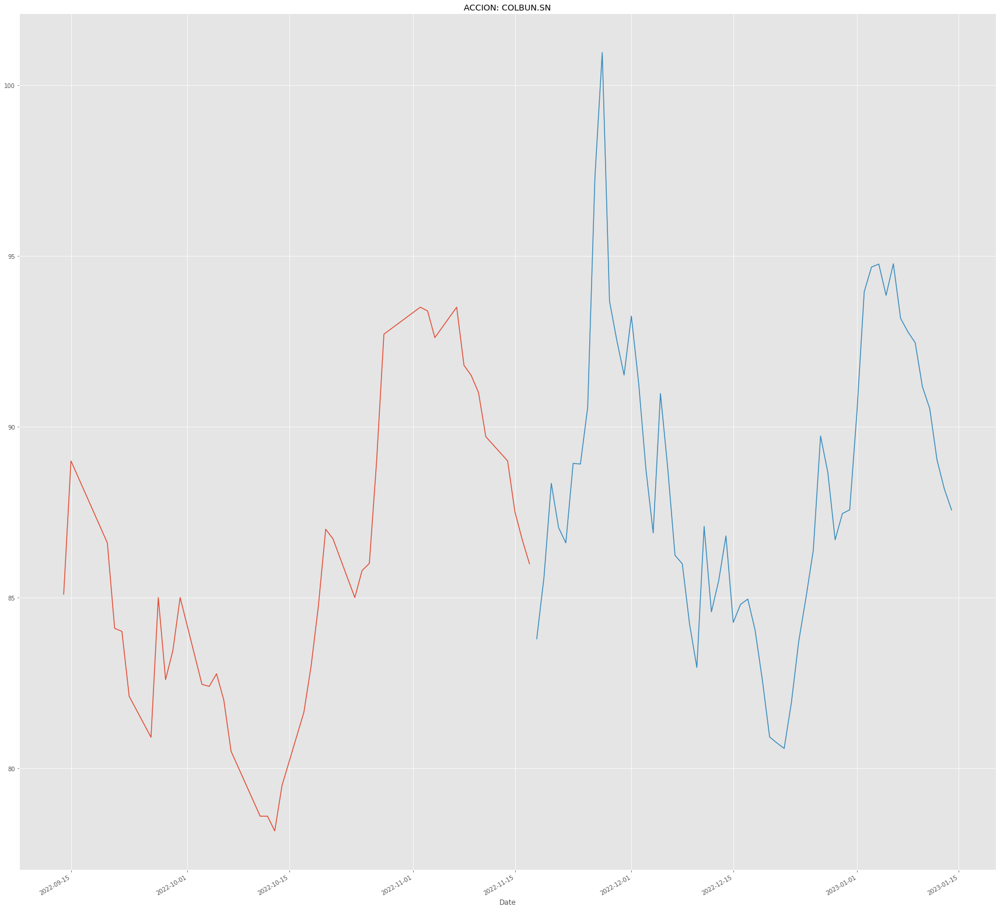


CENCOSHOPP.SN
Date
2022-10-18            NaN
2022-10-19            NaN
2022-10-20            NaN
2022-10-21            NaN
2022-10-24            NaN
2022-10-25            NaN
2022-10-26            NaN
2022-10-27            NaN
2022-10-28            NaN
2022-11-02            NaN
2022-11-03            NaN
2022-11-04            NaN
2022-11-07            NaN
2022-11-08            NaN
2022-11-09            NaN
2022-11-10            NaN
2022-11-11            NaN
2022-11-14            NaN
2022-11-15            NaN
2022-11-16            NaN
2022-11-17            NaN
2022-11-18    1016.917662
2022-11-19    1023.965109
2022-11-20    1090.711587
2022-11-21    1115.092569
2022-11-22    1125.002104
2022-11-23    1138.446965
2022-11-24    1163.843272
2022-11-25    1174.926393
2022-11-26    1160.921687
Name: Forecast, dtype: float64
----------------------


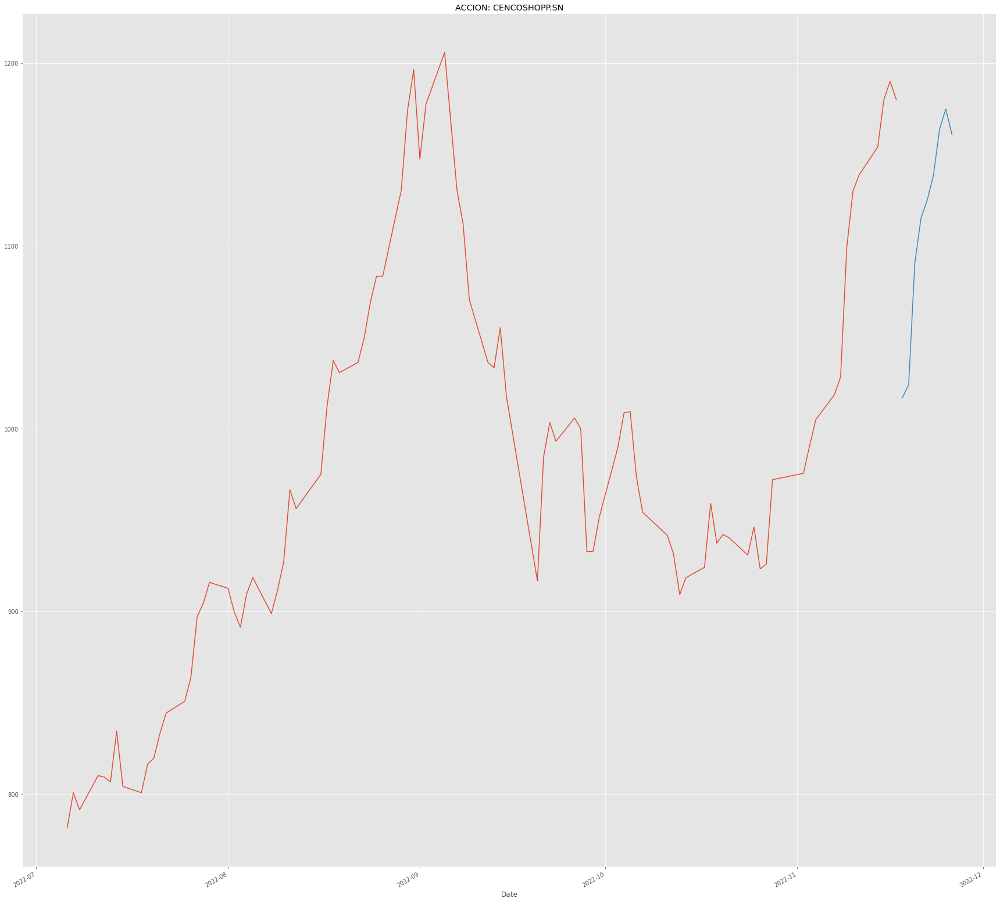


ENTEL.SN
Date
2022-12-16    2903.758064
2022-12-17    2893.508638
2022-12-18    2831.188940
2022-12-19    2785.046651
2022-12-20    2702.028368
2022-12-21    2672.503337
2022-12-22    2744.624051
2022-12-23    2812.009122
2022-12-24    2761.547121
2022-12-25    2816.820639
2022-12-26    2759.116219
2022-12-27    3329.978482
2022-12-28    3032.229143
2022-12-29    2952.244227
2022-12-30    2923.328687
2022-12-31    2910.270545
2023-01-01    2987.520309
2023-01-02    2988.556331
2023-01-03    2992.810880
2023-01-04    3034.913010
2023-01-05    3010.462111
2023-01-06    3028.639447
2023-01-07    3060.335964
2023-01-08    2977.998001
2023-01-09    3000.173983
2023-01-10    2975.809034
2023-01-11    2957.096587
2023-01-12    2884.316958
2023-01-13    2861.249307
2023-01-14    2865.558987
Name: Forecast, dtype: float64
----------------------


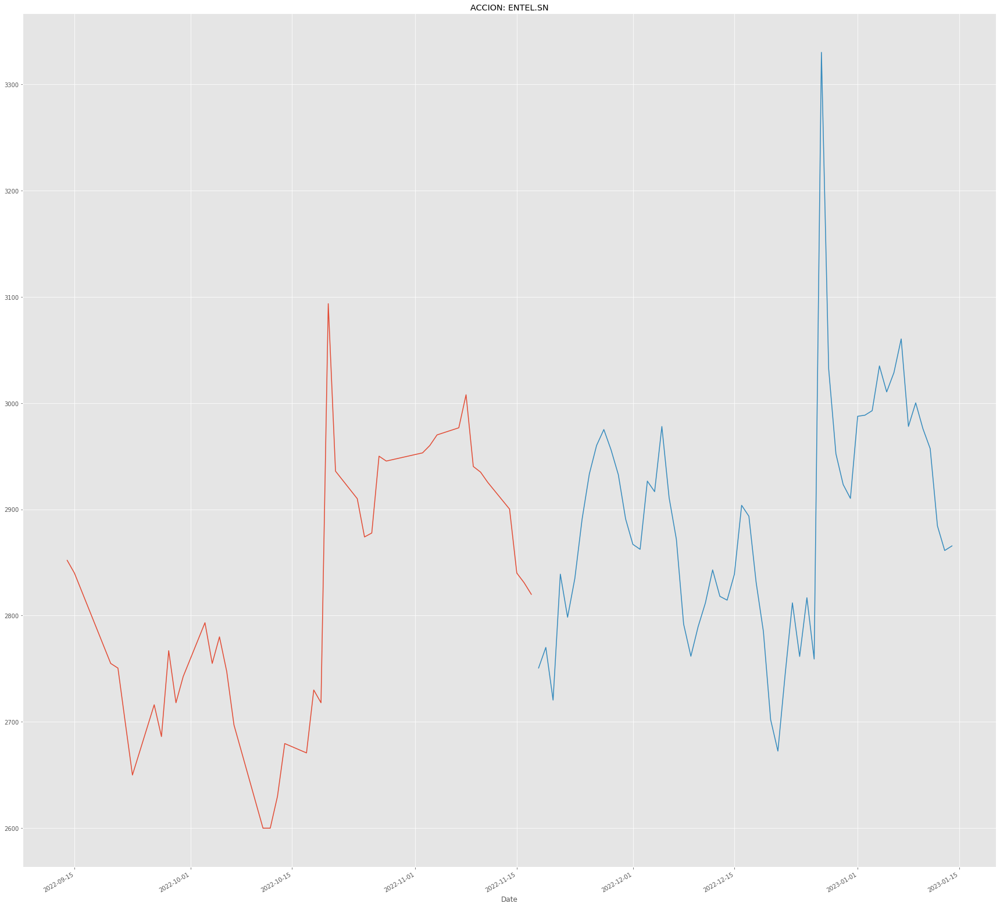


MALLPLAZA.SN
Date
2022-10-20           NaN
2022-10-21           NaN
2022-10-24           NaN
2022-10-25           NaN
2022-10-26           NaN
2022-10-27           NaN
2022-10-28           NaN
2022-11-02           NaN
2022-11-03           NaN
2022-11-04           NaN
2022-11-07           NaN
2022-11-08           NaN
2022-11-09           NaN
2022-11-10           NaN
2022-11-11           NaN
2022-11-14           NaN
2022-11-15           NaN
2022-11-16           NaN
2022-11-17           NaN
2022-11-18    817.670223
2022-11-19    845.316050
2022-11-20    842.958974
2022-11-21    861.943329
2022-11-22    887.310225
2022-11-23    889.058438
2022-11-24    911.011626
2022-11-25    912.657538
2022-11-26    926.620655
2022-11-27    938.215144
2022-11-28    950.631557
Name: Forecast, dtype: float64
----------------------


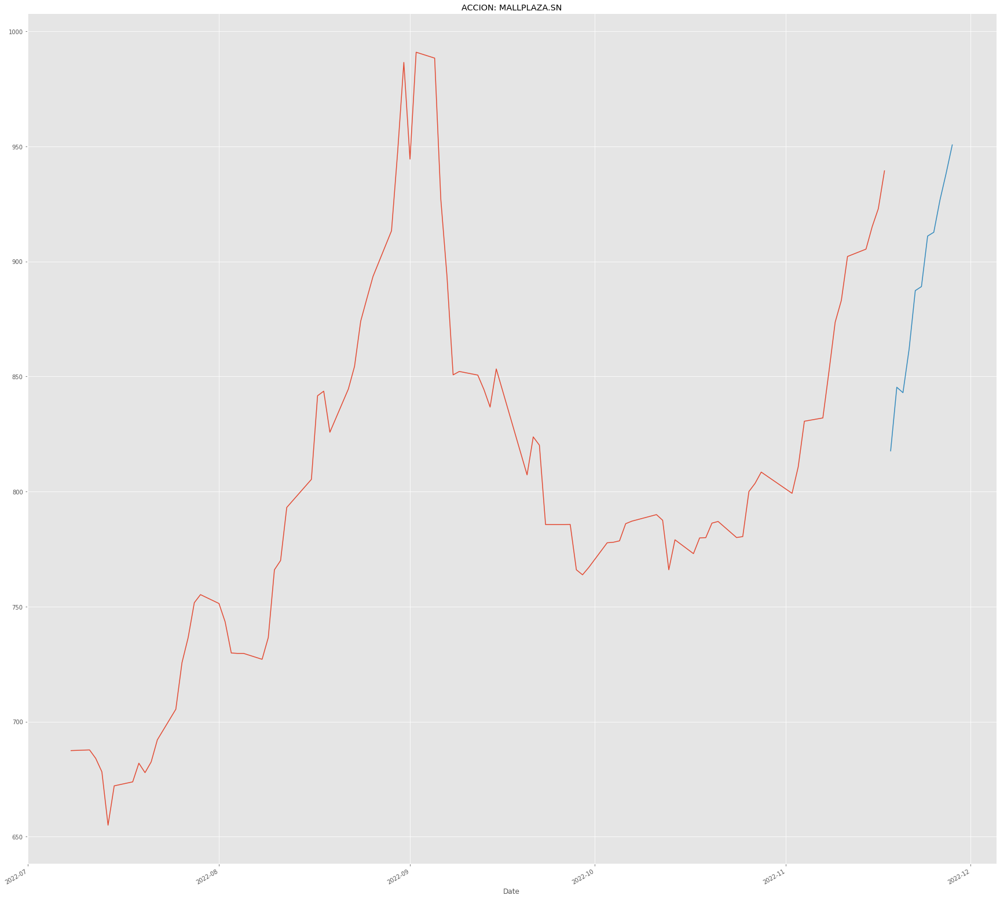


IAM.SN
Date
2022-12-01    406.793787
2022-12-02    396.232775
2022-12-03    392.972687
2022-12-04    388.656093
2022-12-05    382.483002
2022-12-06    390.148944
2022-12-07    392.064498
2022-12-08    391.968110
2022-12-09    411.020033
2022-12-10    413.240713
2022-12-11    405.640023
2022-12-12    386.250777
2022-12-13    392.862712
2022-12-14    410.304394
2022-12-15    418.073250
2022-12-16    431.656953
2022-12-17    443.663329
2022-12-18    453.146952
2022-12-19    445.503482
2022-12-20    444.165811
2022-12-21    445.495382
2022-12-22    452.634991
2022-12-23    452.534675
2022-12-24    459.187152
2022-12-25    462.831547
2022-12-26    463.117899
2022-12-27    465.272647
2022-12-28    461.002477
2022-12-29    460.732007
2022-12-30    460.164466
Name: Forecast, dtype: float64
----------------------


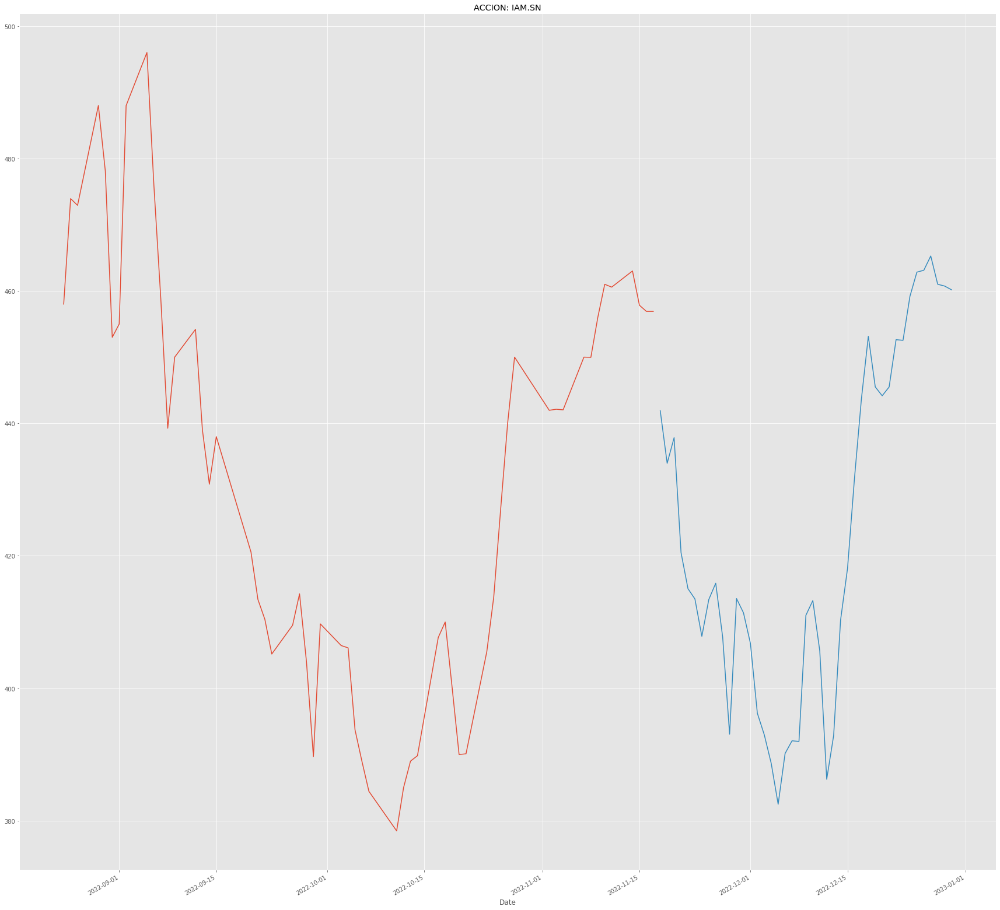


SMU.SN
Date
2022-10-26           NaN
2022-10-27           NaN
2022-10-28           NaN
2022-11-02           NaN
2022-11-03           NaN
2022-11-04           NaN
2022-11-07           NaN
2022-11-08           NaN
2022-11-09           NaN
2022-11-10           NaN
2022-11-11           NaN
2022-11-14           NaN
2022-11-15           NaN
2022-11-16           NaN
2022-11-17           NaN
2022-11-18     94.434790
2022-11-19     97.418469
2022-11-20     96.583414
2022-11-21     95.851054
2022-11-22     95.331906
2022-11-23     96.811038
2022-11-24     97.061838
2022-11-25     97.492535
2022-11-26     98.553663
2022-11-27     99.850531
2022-11-28    101.263997
2022-11-29    100.940947
2022-11-30    103.979890
2022-12-01    106.828050
2022-12-02    108.404215
Name: Forecast, dtype: float64
----------------------


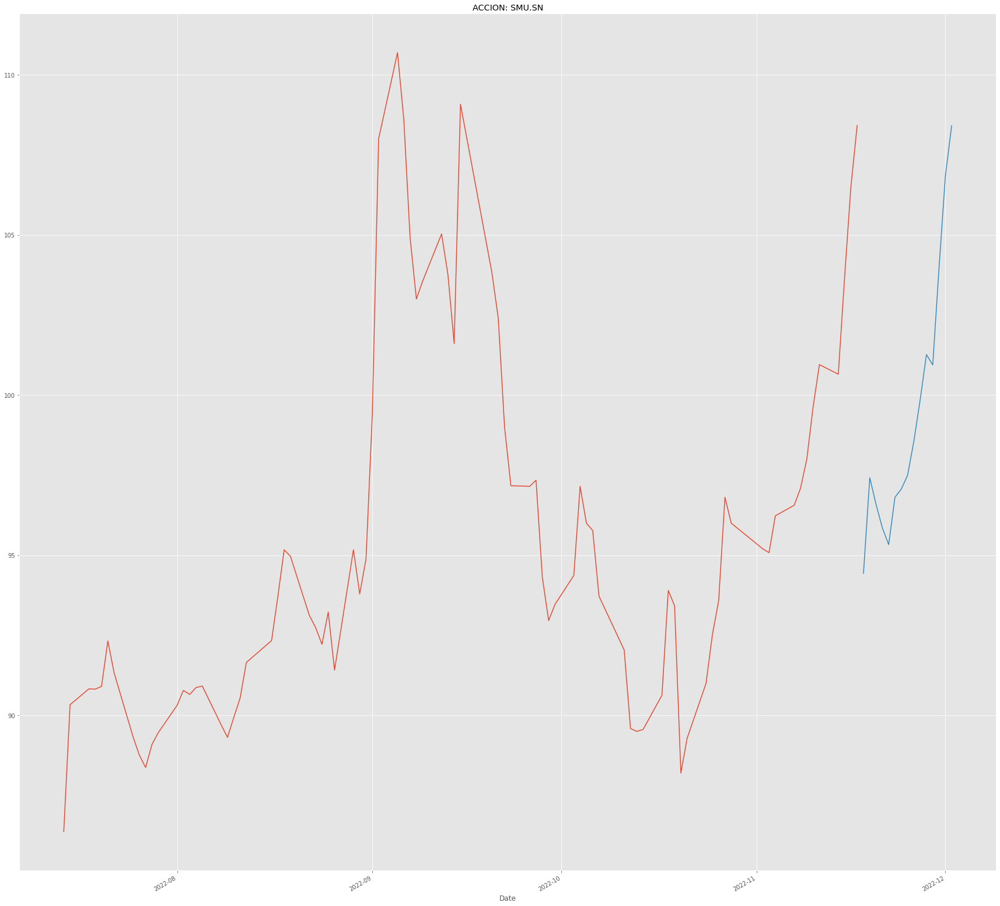


ECL.SN
Date
2022-12-16    482.207698
2022-12-17    477.372177
2022-12-18    498.592117
2022-12-19    479.212249
2022-12-20    464.620366
2022-12-21    467.511968
2022-12-22    482.608248
2022-12-23    497.516176
2022-12-24    509.599026
2022-12-25    517.198246
2022-12-26    500.081618
2022-12-27    506.673284
2022-12-28    515.795562
2022-12-29    504.865256
2022-12-30    527.166416
2022-12-31    534.060967
2023-01-01    549.674359
2023-01-02    562.250020
2023-01-03    558.100788
2023-01-04    552.750772
2023-01-05    542.409314
2023-01-06    536.024394
2023-01-07    537.189239
2023-01-08    526.099118
2023-01-09    526.449053
2023-01-10    509.776516
2023-01-11    522.270113
2023-01-12    509.823978
2023-01-13    513.008749
2023-01-14    512.611690
Name: Forecast, dtype: float64
----------------------


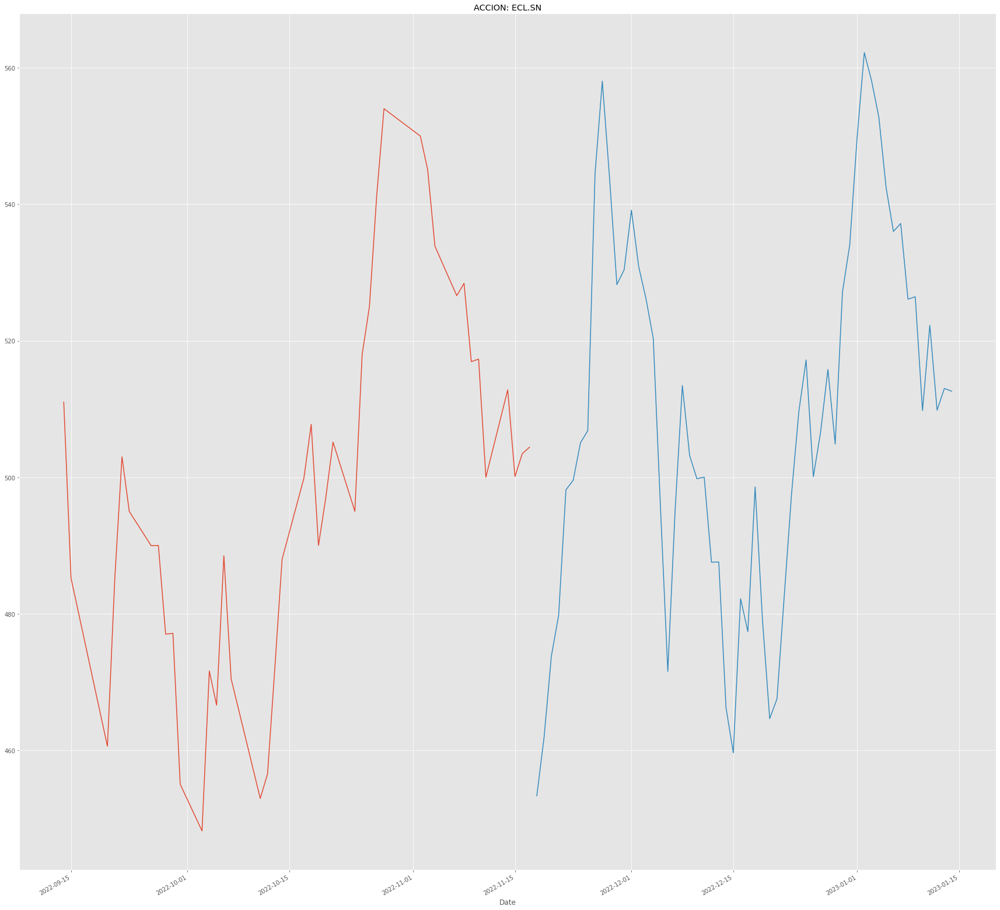


SONDA.SN
Date
2022-11-29    383.537927
2022-11-30    377.660971
2022-12-01    365.855703
2022-12-02    356.910217
2022-12-03    350.179195
2022-12-04    337.302036
2022-12-05    344.902843
2022-12-06    345.564875
2022-12-07    345.526826
2022-12-08    346.728710
2022-12-09    340.421386
2022-12-10    350.534737
2022-12-11    344.956338
2022-12-12    337.375313
2022-12-13    339.891939
2022-12-14    340.953882
2022-12-15    337.347118
2022-12-16    345.697133
2022-12-17    351.021938
2022-12-18    344.739375
2022-12-19    341.572762
2022-12-20    349.218575
2022-12-21    349.332693
2022-12-22    344.105439
2022-12-23    351.551697
2022-12-24    342.378121
2022-12-25    338.625320
2022-12-26    339.536424
2022-12-27    335.101685
2022-12-28    336.147603
Name: Forecast, dtype: float64
----------------------


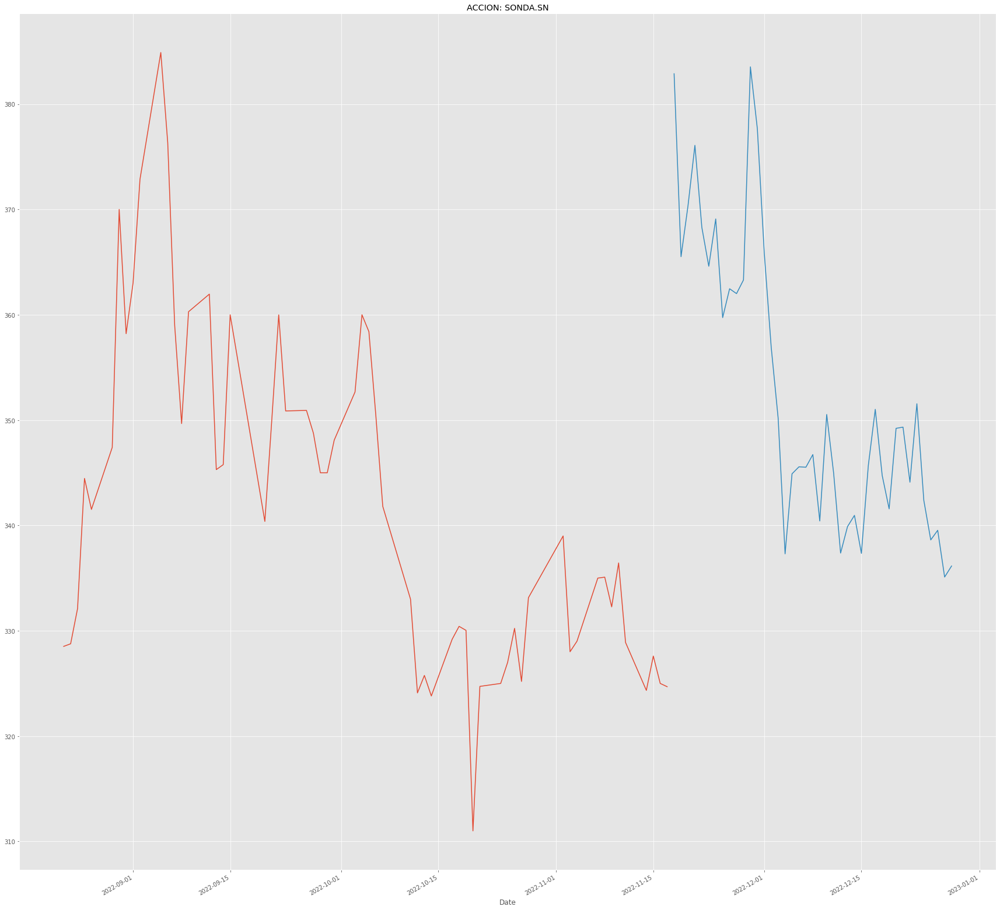


RIPLEY.SN
Date
2022-12-02    161.512882
2022-12-03    163.059080
2022-12-04    168.186304
2022-12-05    161.922322
2022-12-06    163.398275
2022-12-07    162.633346
2022-12-08    160.199815
2022-12-09    162.468206
2022-12-10    166.951674
2022-12-11    168.836636
2022-12-12    171.985348
2022-12-13    159.015759
2022-12-14    166.452239
2022-12-15    164.383695
2022-12-16    165.242189
2022-12-17    163.472980
2022-12-18    162.899076
2022-12-19    162.285292
2022-12-20    160.614598
2022-12-21    156.544505
2022-12-22    160.659975
2022-12-23    162.282520
2022-12-24    160.754183
2022-12-25    156.573793
2022-12-26    153.214627
2022-12-27    154.863374
2022-12-28    152.186569
2022-12-29    150.326756
2022-12-30    152.642251
2022-12-31    152.517328
Name: Forecast, dtype: float64
----------------------


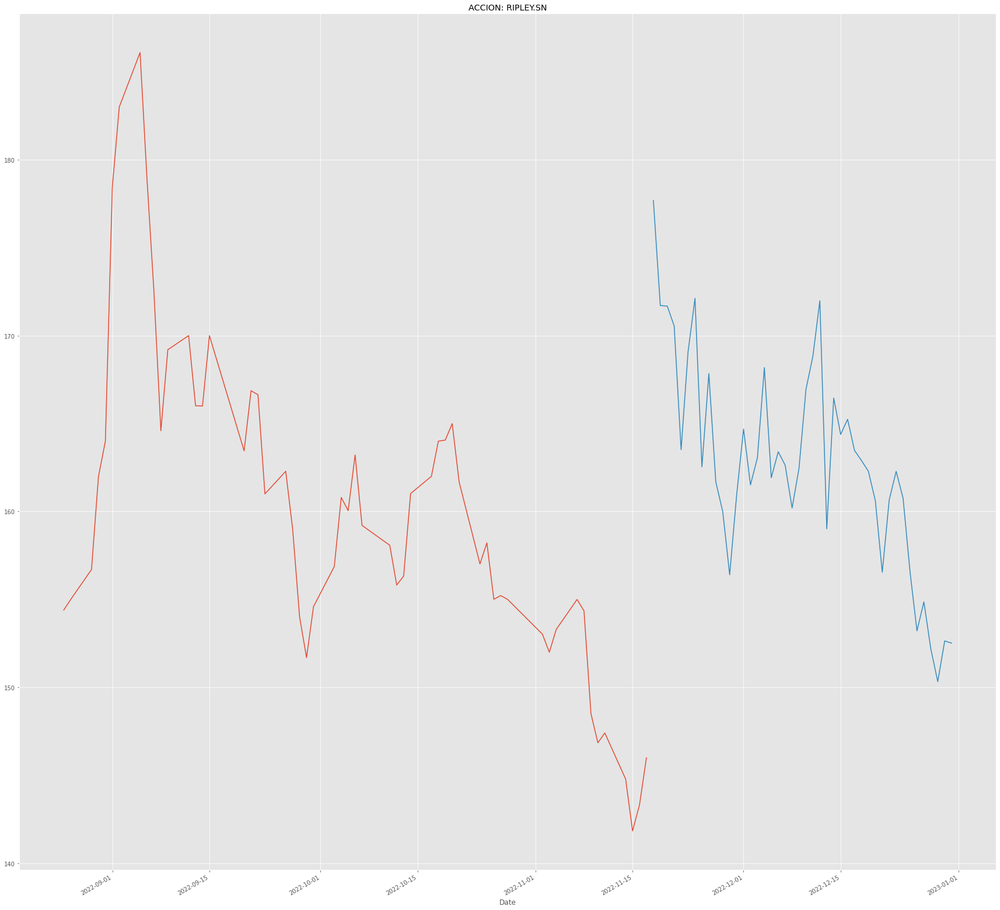


SECURITY.SN
Date
2022-12-16    144.494054
2022-12-17    143.963300
2022-12-18    144.595510
2022-12-19    146.108099
2022-12-20    143.584553
2022-12-21    142.979029
2022-12-22    147.009420
2022-12-23    147.620833
2022-12-24    148.044816
2022-12-25    146.173528
2022-12-26    146.718716
2022-12-27    150.645425
2022-12-28    148.724843
2022-12-29    150.241876
2022-12-30    149.833260
2022-12-31    149.456078
2023-01-01    158.433896
2023-01-02    157.574886
2023-01-03    152.676401
2023-01-04    153.211671
2023-01-05    155.218872
2023-01-06    154.950051
2023-01-07    153.039049
2023-01-08    150.380302
2023-01-09    150.671496
2023-01-10    154.822706
2023-01-11    156.042971
2023-01-12    153.690252
2023-01-13    154.050081
2023-01-14    155.245331
Name: Forecast, dtype: float64
----------------------


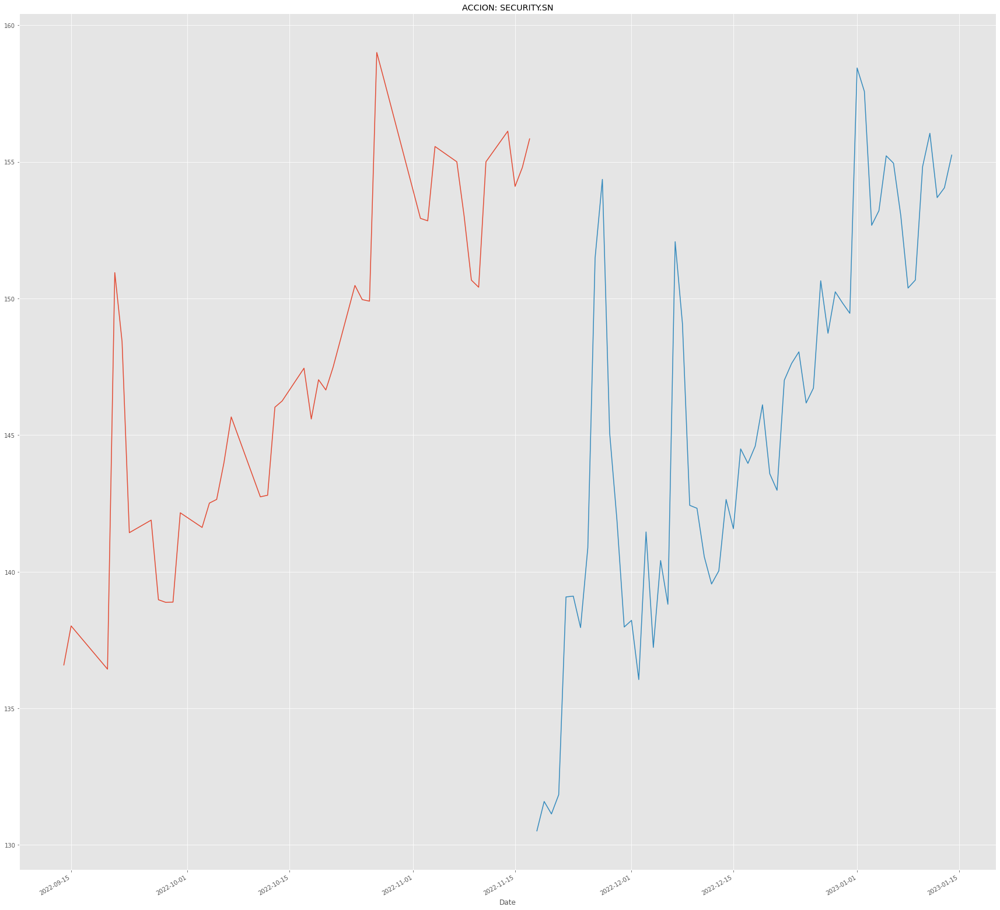


QUINENCO.SN
Date
2022-12-16    2509.038718
2022-12-17    2553.286227
2022-12-18    2501.687153
2022-12-19    2447.804146
2022-12-20    2371.696161
2022-12-21    2348.695090
2022-12-22    2338.128628
2022-12-23    2406.993395
2022-12-24    2471.154443
2022-12-25    2574.723156
2022-12-26    2486.426795
2022-12-27    2960.219671
2022-12-28    2703.492189
2022-12-29    2669.436029
2022-12-30    2597.064180
2022-12-31    2558.002882
2023-01-01    2563.012038
2023-01-02    2595.713252
2023-01-03    2575.302048
2023-01-04    2638.076073
2023-01-05    2621.425598
2023-01-06    2606.883725
2023-01-07    2694.256543
2023-01-08    2686.001100
2023-01-09    2758.611022
2023-01-10    2796.641524
2023-01-11    2764.085846
2023-01-12    2770.705062
2023-01-13    2759.603430
2023-01-14    2763.806418
Name: Forecast, dtype: float64
----------------------


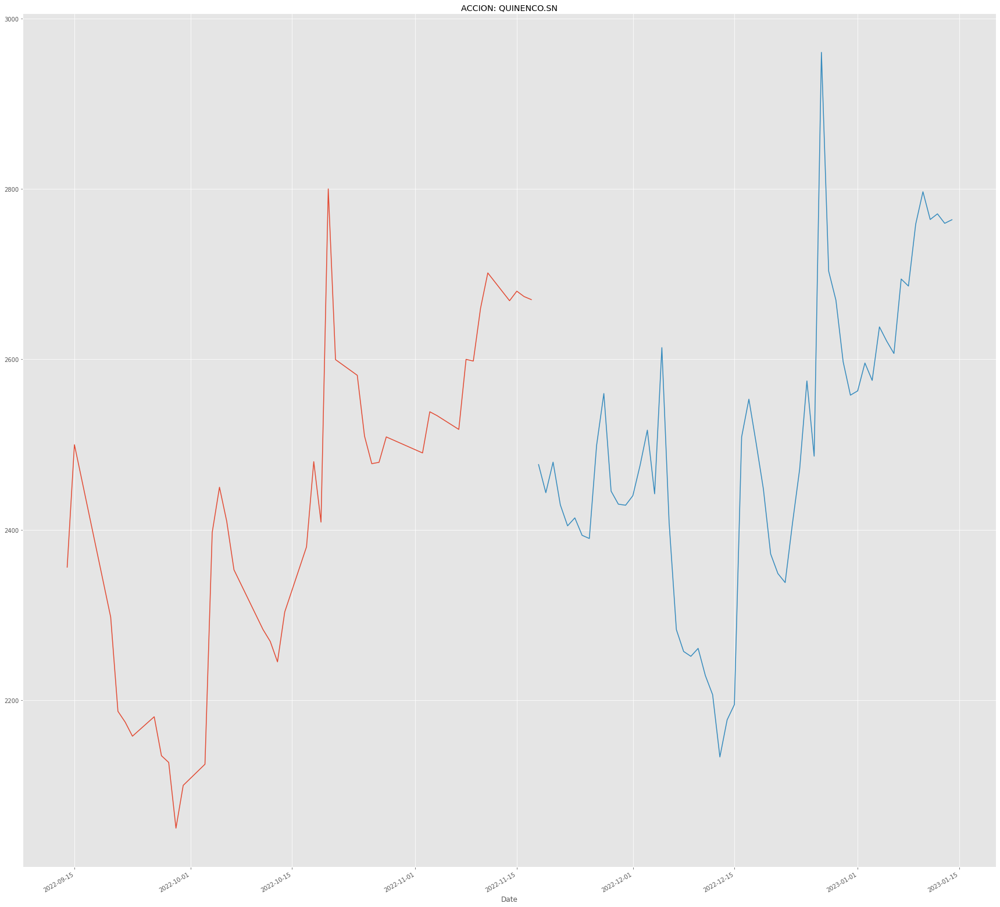


BESALCO.SN
Date
2022-11-26    336.244833
2022-11-27    335.999278
2022-11-28    324.012848
2022-11-29    315.759572
2022-11-30    312.144177
2022-12-01    300.681577
2022-12-02    301.153406
2022-12-03    302.311413
2022-12-04    304.522974
2022-12-05    309.287947
2022-12-06    315.948737
2022-12-07    340.758674
2022-12-08    343.494393
2022-12-09    348.129966
2022-12-10    344.270378
2022-12-11    340.476578
2022-12-12    341.655072
2022-12-13    341.075282
2022-12-14    340.890886
2022-12-15    338.193636
2022-12-16    338.391000
2022-12-17    335.774765
2022-12-18    337.645521
2022-12-19    336.090005
2022-12-20    335.691511
2022-12-21    325.547269
2022-12-22    319.998529
2022-12-23    314.566138
2022-12-24    320.017408
2022-12-25    323.051671
Name: Forecast, dtype: float64
----------------------


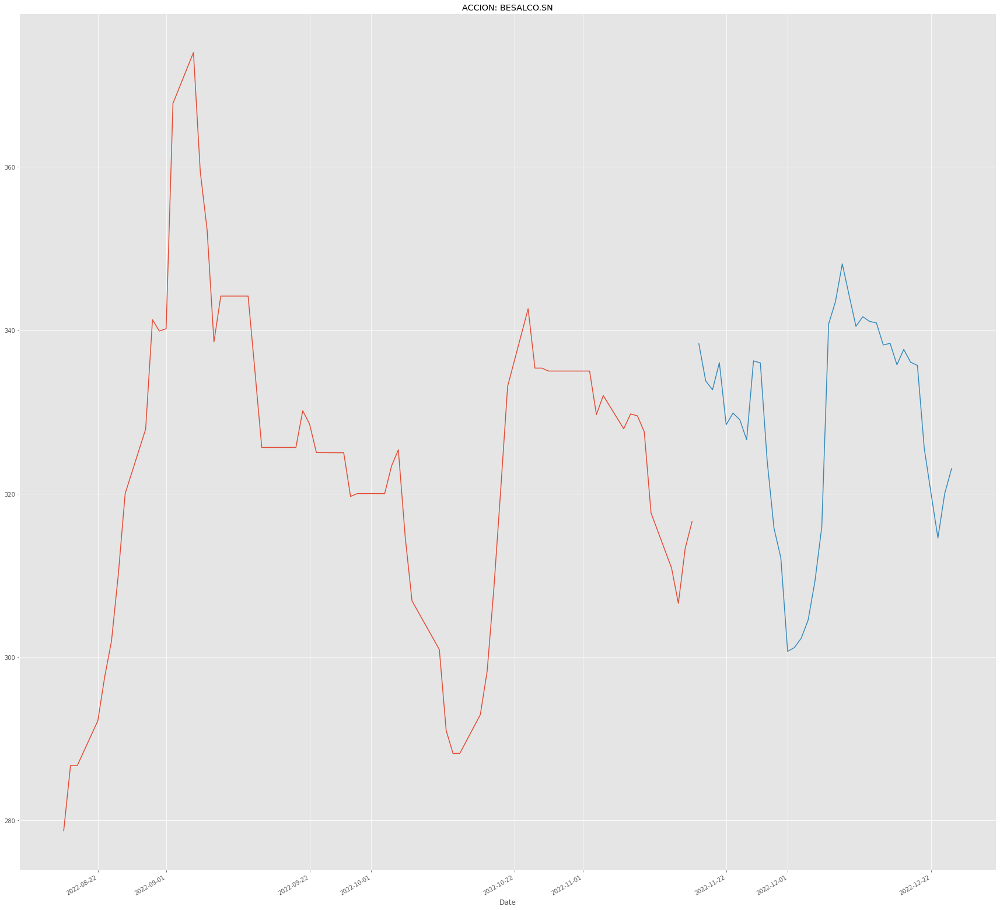


MASISA.SN
Date
2022-12-16    31.546677
2022-12-17    32.044584
2022-12-18    31.877938
2022-12-19    29.951356
2022-12-20    31.443082
2022-12-21    31.117764
2022-12-22    30.497961
2022-12-23    29.900508
2022-12-24    31.706028
2022-12-25    32.289713
2022-12-26    33.102066
2022-12-27    29.596185
2022-12-28    33.127430
2022-12-29    32.520378
2022-12-30    32.581131
2022-12-31    33.773321
2023-01-01    34.329320
2023-01-02    34.718311
2023-01-03    34.302863
2023-01-04    33.368498
2023-01-05    34.217817
2023-01-06    34.671558
2023-01-07    34.442243
2023-01-08    35.070308
2023-01-09    35.015825
2023-01-10    36.618116
2023-01-11    36.641767
2023-01-12    36.738297
2023-01-13    35.451695
2023-01-14    34.778105
Name: Forecast, dtype: float64
----------------------


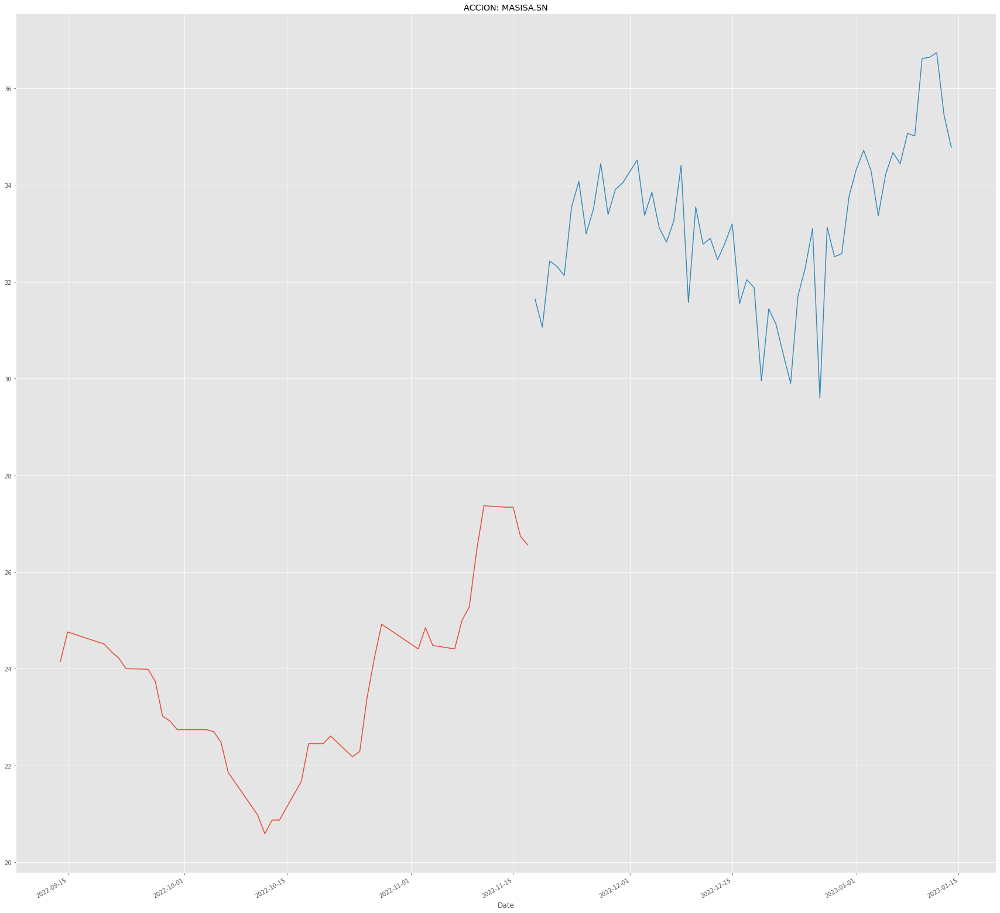


LTM.SN
Date
2022-12-16    372.491508
2022-12-17    239.791199
2022-12-18    242.840430
2022-12-19    217.473427
2022-12-20    239.725430
2022-12-21    254.471234
2022-12-22    255.567442
2022-12-23    238.515378
2022-12-24    256.184310
2022-12-25    260.950241
2022-12-26    273.460358
2022-12-27    215.506272
2022-12-28    265.630328
2022-12-29    259.090420
2022-12-30    314.288183
2022-12-31    269.477168
2023-01-01    321.743645
2023-01-02    368.962007
2023-01-03    307.176672
2023-01-04    503.087161
2023-01-05    354.490494
2023-01-06    347.304319
2023-01-07    516.850275
2023-01-08    388.956694
2023-01-09    342.951141
2023-01-10    329.981873
2023-01-11    698.126971
2023-01-12    222.733426
2023-01-13    256.514433
2023-01-14    400.801185
Name: Forecast, dtype: float64
----------------------


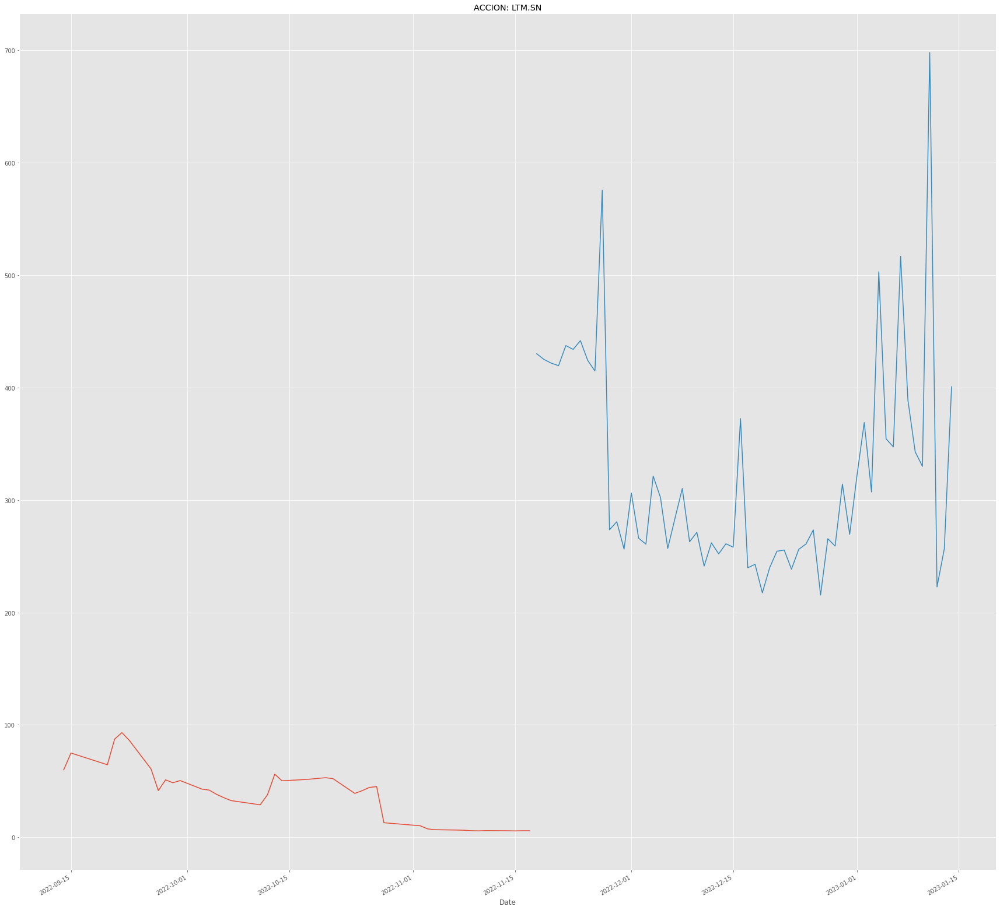


ENJOY.SN
Date
2022-11-22    2.237586
2022-11-23    2.313289
2022-11-24    2.249294
2022-11-25    1.990988
2022-11-26    2.158844
2022-11-27    2.217166
2022-11-28    2.158693
2022-11-29    2.114913
2022-11-30    2.389183
2022-12-01    1.938546
2022-12-02    1.503142
2022-12-03    2.318425
2022-12-04    2.468511
2022-12-05    2.310559
2022-12-06    2.163376
2022-12-07    2.293186
2022-12-08    2.265546
2022-12-09    2.148288
2022-12-10    2.016312
2022-12-11    1.928833
2022-12-12    2.016715
2022-12-13    2.130231
2022-12-14    2.009893
2022-12-15    1.966690
2022-12-16    2.049066
2022-12-17    2.032147
2022-12-18    2.068028
2022-12-19    2.217479
2022-12-20    2.028860
2022-12-21    2.129701
Name: Forecast, dtype: float64
----------------------


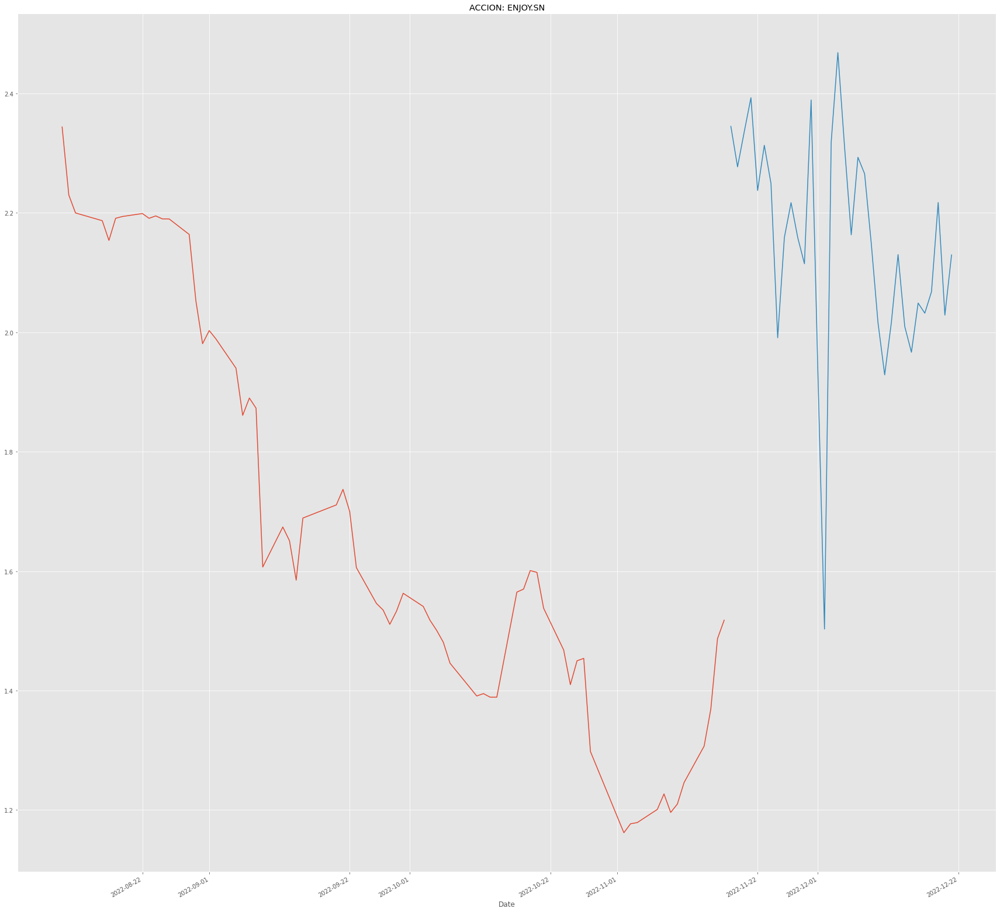

In [32]:
for i in ipsa:
  globals()[str('dfreg')+str(i).replace(".","")]['Adj Close'].tail(100).plot()
  globals()[str('dfreg')+str(i).replace(".","")]['Forecast'].tail(100).plot()

  print(i)
  #print(globals()[str('dfreg')+str(i).replace(".","")]['Adj Close'])
  print(globals()[str('dfreg')+str(i).replace(".","")]['Forecast'].tail(30))
  print("----------------------")
  plt.title("ACCION: "+ str(i))
  plt.show()
  print()



In [116]:
for i in ipsa:
  print(i)
  #print(globals()[str('dfreg')+str(i).replace(".","")])
  #print(globals()[str('dfreg')+str(i).replace(".","")]['Adj Close'])
  print(globals()[str('dfreg')+str(i).replace(".","")]['Forecast'])
  

  







HLAG.DE
Date
2015-11-06           NaN
2015-11-09           NaN
2015-11-10           NaN
2015-11-11           NaN
2015-11-12           NaN
                 ...    
2022-12-01    183.370858
2022-12-02    190.548981
2022-12-03    187.837256
2022-12-04    184.286931
2022-12-05    186.071504
Name: Forecast, Length: 1805, dtype: float64
MAERSK-B.CO
Date
2000-01-03             NaN
2000-01-04             NaN
2000-01-05             NaN
2000-01-06             NaN
2000-01-07             NaN
                  ...     
2023-01-10    15400.252127
2023-01-11    15354.499536
2023-01-12    15254.841523
2023-01-13    14793.540564
2023-01-14    14911.950497
Name: Forecast, Length: 5847, dtype: float64
VALE
Date
2002-03-21          NaN
2002-03-22          NaN
2002-03-25          NaN
2002-03-26          NaN
2002-03-27          NaN
                ...    
2023-01-05    15.533845
2023-01-06    15.425073
2023-01-07    15.309069
2023-01-08    14.875747
2023-01-09    14.875810
Name: Forecast, Length: 5257, dtyp

# Challenges (To Be Continued):
* Assuming economic qualitative factors such as news (news sourcing and sentimental analysis)
* Assuming economic quantitative factors such as HPI of a certain country, economic inequality among origin of company
* Cleaning out the data
* Importing data files

# Next lesson:
## Lesson 4 Basic Python for Data Analytics (Predicting Employee Retention)

# Python: How to Get Live Market Data (Less Than 0.1-Second Lag).
This article is going to be a bit special. I am going to test the latest release from Yahoo Finance API for Python, which provide the possibility to get live data with less than a second lag for free.

Before to start
First of all, if you want to track my progress and before to start, you will need to have installed on your machine a Python 3 version and the following packages:
Pandas
NumPy
Yfinance
Plotly (Not mandatory, but useful for plotting)
If any of these packages are not already installed, you can use the pip command, as shown below.

In [34]:
!pip install yfinance
!pip install plotly

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Once you have ensured that the following packages are installed, we can start.
If you already have experience with Python, you can jump to the second step. The first step will consist of importing data.
I. Import package
The first step will consist of importing the necessary packages.
You will start by importing your packages previously installed by using the following lines of code:

In [35]:
# Raw Package
import numpy as np
import pandas as pd

#Data Source
import yfinance as yf

#Data viz
import plotly.graph_objs as go


def print_real_time(accion_predecirss):
  #Interval required 1 minute
  accion = accion_predecirss
  data = yf.download(tickers=accion, period='1d', interval='1m')

  #declare figure
  fig = go.Figure()


  #Candlestick
  fig.add_trace(go.Candlestick(x=data.index,
                  open=data['Open'],
                  high=data['High'],
                  low=data['Low'],
                  close=data['Close'], name = 'market data'))

  # Add titles
  fig.update_layout(
      title='EVOLUCIÓN EN VIVO DEL PRECIO DE LA ACCIÓN: '+accion,
      yaxis_title='PRECIO DE LAS ACCION ' + accion)

  # X-Axes
  fig.update_xaxes(
      rangeslider_visible=True,
      rangeselector=dict(
          buttons=list([
              dict(count=15, label="15m", step="minute", stepmode="backward"),
              dict(count=45, label="45m", step="minute", stepmode="backward"),
              dict(count=1, label="HTD", step="hour", stepmode="todate"),
              dict(count=3, label="3h", step="hour", stepmode="backward"),
              dict(step="all")
          ])
      )
  )

  #Show
  fig.show()

  #while True:
    #print(data)

for count, value in enumerate(ipsa):
  print("*********************************************************")
  print(count, value)
  print_real_time(value)
  print("*********************************************************")


*********************************************************
0 HLAG.DE
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
1 MAERSK-B.CO
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
2 VALE
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
3 INVERCAP.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
4 SQM-B.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
5 CHILE.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
6 BSANTANDER.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
7 COPEC.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
8 CENCOSUD.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
9 FALABELLA.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
10 ENELAM.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
11 CMPC.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
12 BCI.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
13 VAPORES.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
14 CAP.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
15 CCU.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
16 ENELCHILE.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
17 ANDINA-B.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
18 CONCHATORO.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
19 PARAUCO.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
20 ITAUCORP.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
21 AGUAS-A.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
22 COLBUN.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
23 CENCOSHOPP.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
24 ENTEL.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
25 MALLPLAZA.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
26 IAM.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
27 SMU.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
28 ECL.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
29 SONDA.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
30 RIPLEY.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
31 SECURITY.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
32 QUINENCO.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
33 BESALCO.SN
[*********************100%***********************]  1 of 1 completed

1 Failed download:
- BESALCO.SN: No data found for this date range, symbol may be delisted


*********************************************************
*********************************************************
34 MASISA.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
35 LTM.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
36 ENJOY.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************


In [36]:
def make_forecast(ticker, periods, hist='max'):
    """
    forecast the given ticker (stock) period days into the future (from today)

    inputs
    ------
    > ticker
        >> ticker of stock to forecast
    > periods
        >> number of days into the future to forecast (from today's date)
    > hist
        >> amount of historical data to consider
            > default: max
            > options: 1d, 5d, 1mo, 3mo, 6mo, 1y, 2y, 5y, 10y, ytd, max
    """
    # pull historical data from yahoo finance
    stock_data = yf.Ticker(ticker)

    hist_data = stock_data.history(hist, auto_adjust=True)

    # create new dataframe to hold dates (ds) & adjusted closing prices (y)
    df = pd.DataFrame()

    df['ds'] = hist_data.index.values
    df['y'] = hist_data['Close'].values

    # create a Prophet model from that data
    m = Prophet(daily_seasonality=False)
    m.fit(df)

    future = m.make_future_dataframe(periods, freq='D')

    forecast = m.predict(future)

    m.plot(forecast)

    #return forecast